# Warm-up data exploration and visualization

<style>
.MathJax {
  font-family: "Common HTML";
}
</style>

$$
\newcommand{\eg}{{\it e.g.}}
\newcommand{\ie}{{\it i.e.}}
\newcommand{\argmin}{\operatornamewithlimits{argmin}}
\newcommand{\mc}{\mathcal}
\newcommand{\mb}{\mathbb}
\newcommand{\mf}{\mathbf}
\newcommand{\minimize}{{\text{minimize}}}
\newcommand{\diag}{{\text{diag}}}
\newcommand{\cond}{{\text{cond}}}
\newcommand{\rank}{{\text{rank }}}
\newcommand{\range}{{\mathcal{R}}}
\newcommand{\null}{{\mathcal{N}}}
\newcommand{\tr}{{\text{trace}}}
\newcommand{\dom}{{\text{dom}}}
\newcommand{\dist}{{\text{dist}}}
\newcommand{\R}{\mathbf{R}}
\newcommand{\SM}{\mathbf{S}}
\newcommand{\ball}{\mathcal{B}}
\newcommand{\bmat}[1]{\begin{bmatrix}#1\end{bmatrix}}
\newcommand{\loss}{\ell}
\newcommand{\eloss}{\mc{L}}
\newcommand{\abs}[1]{| #1 |}
\newcommand{\norm}[1]{\| #1 \|}
\newcommand{\tp}{T}
$$

__<div style="text-align: right"> ASE3001: Computational Experiments for Aerospace Engineering, Inha University. </div>__
_<div style="text-align: right"> Jong-Han Kim (jonghank@inha.ac.kr) </div>_



___
__Note__

- _This assignment description was prepared with the assistance of ChatGPT 5._

- _Students are also permitted to use ChatGPT or other generative AI models to support their work on this assignment, provided that all sources of assistance are properly acknowledged, and that the correctness of the AI’s responses is carefully verified before use._

<br>

___

<br>

## Objective

The purpose of this assignment is to provide students with an opportunity to practice essential Python-based data analysis and visualization skills. Building upon the introductory lecture on Python, NumPy, Matplotlib, and Pandas, this task emphasizes independent exploration of aerospace-related datasets and the extraction of meaningful insights.



## Task Description

Each student is required to search for a dataset of personal interest related to aerospace science or engineering. The dataset may be obtained from publicly available online sources, such as governmental agencies, research organizations, or academic repositories. Once an appropriate dataset has been identified, students should perform the following steps:

-	Provide a brief explanation of why this dataset was selected, highlighting its relevance or personal interest in the aerospace domain.
-	Import the dataset into Python using Pandas (e.g., from CSV or Excel format).
-	Preprocess the data as necessary (e.g., handling missing values, renaming columns, adjusting units).
-	Apply NumPy operations, where appropriate, to manipulate or transform the data.
-	Visualize the results using Matplotlib, ensuring that the plots are clear, properly labeled, and scientifically informative.



## Deliverables

All work must be completed directly in the provided Jupyter Notebook file, and the students should write both the code cells (for data handling, processing, and visualization) and the report sections (in Markdown cells) within the same notebook.

The written report should immediately follow the assignment description in the notebook and include the following elements:

-	A description of the dataset, including its source, relevance to aerospace applications, and the motivation for selecting it.
- A clear explanation of the preprocessing steps and analysis methods applied.
- Graphical results (plots, charts, or other visualizations) generated from the dataset.
- A discussion of insights gained from the analysis and potential implications in the aerospace domain.


<br>

---

<br>


### NASA C-MAPSS

NASA C-MAPSS는 **터보팬 항공기 엔진의 열화 과정을 시뮬레이션한 시계열 데이터셋** 이다. 각 엔진의 운전 cycle에 따라 **운전 조건과 21개의 센서값**이 기록되어 있으며, 센서값의 변화를 이용해 엔진의 **잔여 수명(RUL, Remaining Useful Life)** 을 예측하는 데 주로 사용된다.

| 센서                    | 측정값             | 단위      |
| --------------------- | --------------- | ------- |
| sensor_1 (T2)         | Fan 입구 온도       | °R      |
| sensor_2 (T24)        | LPC 출구 온도       | °R      |
| sensor_3 (T30)        | HPC 출구 온도       | °R      |
| sensor_4 (T50)        | LPT 출구 온도       | °R      |
| sensor_5 (P2)         | Fan 입구 압력       | psia    |
| sensor_6 (P15)        | Bypass duct 압력  | psia    |
| sensor_7 (P30)        | HPC 출구 압력       | psia    |
| sensor_8 (Nf)         | Fan 회전 속도       | rpm     |
| sensor_9 (Nc)         | Core 회전 속도      | rpm     |
| sensor_10 (epr)       | 엔진 압력비          | -       |
| sensor_11 (Ps30)      | HPC 출구 정압       | psia    |
| sensor_12 (phi)       | 연료 유량 / Ps30 비율 | pps/psi |
| sensor_13 (NRf)       | 보정 Fan 회전 속도    | rpm     |
| sensor_14 (NRc)       | 보정 Core 회전 속도   | rpm     |
| sensor_15 (BPR)       | Bypass Ratio    | -       |
| sensor_16 (farB)      | 연소기 연료-공기비      | -       |
| sensor_17 (htBleed)   | Bleed Enthalpy  | -       |
| sensor_18 (Nf_dmd)    | 요구 Fan 회전 속도    | rpm     |
| sensor_19 (PCNfR_dmd) | 요구 보정 Fan 회전 속도 | rpm     |
| sensor_20 (W31)       | HPT 냉각 Bleed 유량 | lbm/s   |
| sensor_21 (W32)       | LPT 냉각 Bleed 유량 | lbm/s   |

**LPC**는 Low Pressure Compressor, **HPC**는 High Pressure Compressor, **HPT/LPT** 는 각각 High/Low Pressure Turbine을 의미한다. 센서 정의는 NASA C-MAPSS 문서의 측정 변수 구성을 따른다.

In [1]:
import os
from pathlib import Path

project_root = Path.cwd()

os.environ["KAGGLEHUB_CACHE"] = str(project_root)

import kagglehub

path = kagglehub.dataset_download("behrad3d/nasa-cmaps")

print("Project root:", project_root)
print("Dataset path:", path)

/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Project root: /Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning
Dataset path: /Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/datasets/behrad3d/nasa-cmaps/versions/1


In [2]:
import os

for root, dirs, files in os.walk(path):
    level = root.replace(path, "").count(os.sep)
    indent = "    " * level

    print(f"{indent}{os.path.basename(root)}/")

    for file in files:
        print(f"{indent}    {file}")

1/
    CMaps/
        Damage Propagation Modeling.pdf
        train_FD001.txt
        train_FD003.txt
        RUL_FD004.txt
        train_FD002.txt
        RUL_FD001.txt
        x.txt
        RUL_FD003.txt
        RUL_FD002.txt
        train_FD004.txt
        test_FD003.txt
        test_FD002.txt
        test_FD001.txt
        test_FD004.txt
        readme.txt


In [3]:
from pathlib import Path

import pandas as pd

data_path = Path(path) / "CMaps"

columns = ["unit_id", "cycle"] + [f"setting_{i}" for i in range(1, 4)] + [f"sensor_{i}" for i in range(1, 22)]

train_df = pd.read_csv(data_path / "train_FD001.txt", sep=r"\s+", header=None, names=columns)
test_df  = pd.read_csv(data_path / "test_FD001.txt",  sep=r"\s+", header=None, names=columns)
rul_df   = pd.read_csv(data_path / "RUL_FD001.txt",   sep=r"\s+", header=None, names=["RUL"])

print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)
print("RUL shape:", rul_df.shape)

display(train_df.head())

Train shape: (20631, 26)
Test shape: (13096, 26)
RUL shape: (100, 1)


,unit_id,cycle,setting_1,setting_2,setting_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


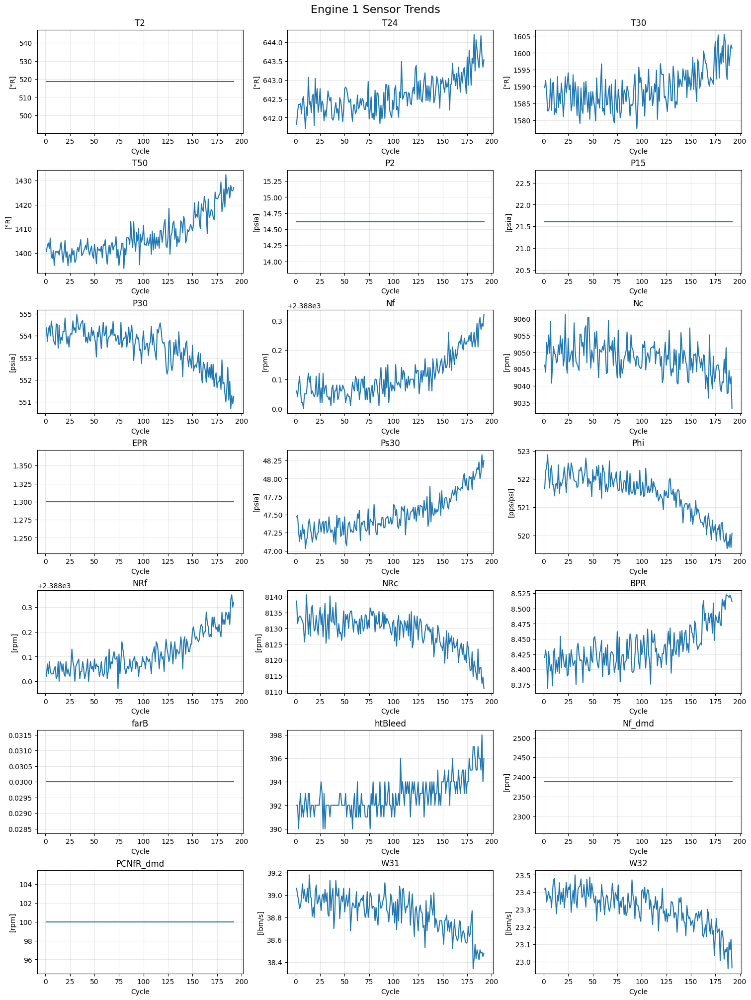

In [4]:
import matplotlib.pyplot as plt

sensor_info = {
    1:  ("T2", "°R"),          # 팬 입구 총온도
    2:  ("T24", "°R"),         # 저압 압축기(LPC) 출구 총온도
    3:  ("T30", "°R"),         # 고압 압축기(HPC) 출구 총온도
    4:  ("T50", "°R"),         # 저압 터빈(LPT) 출구 총온도
    5:  ("P2", "psia"),        # 팬 입구 압력
    6:  ("P15", "psia"),       # 바이패스 덕트 총압력
    7:  ("P30", "psia"),       # 고압 압축기(HPC) 출구 총압력
    8:  ("Nf", "rpm"),         # 팬 회전 속도
    9:  ("Nc", "rpm"),         # 코어 회전 속도
    10: ("EPR", None),         # 엔진 압력비
    11: ("Ps30", "psia"),      # 고압 압축기(HPC) 출구 정압
    12: ("Phi", "pps/psi"),    # 연료 유량 / Ps30 비율
    13: ("NRf", "rpm"),        # 보정 팬 회전 속도
    14: ("NRc", "rpm"),        # 보정 코어 회전 속도
    15: ("BPR", None),         # 바이패스 비율
    16: ("farB", None),        # 연소기 연료-공기비
    17: ("htBleed", None),     # 블리드 공기 엔탈피
    18: ("Nf_dmd", "rpm"),     # 요구 팬 회전 속도
    19: ("PCNfR_dmd", "rpm"),  # 요구 보정 팬 회전 속도
    20: ("W31", "lbm/s"),      # 고압 터빈 냉각 블리드 유량
    21: ("W32", "lbm/s"),      # 저압 터빈 냉각 블리드 유량
}

engine_id = 1
engine_df = train_df[train_df["unit_id"] == engine_id]

fig, axes = plt.subplots(7, 3, figsize=(15, 20), layout="constrained")

for i, ax in enumerate(axes.flat):
    sensor_id = i + 1
    sensor = f"sensor_{sensor_id}"

    name, unit = sensor_info[sensor_id]

    ax.plot(engine_df["cycle"], engine_df[sensor])

    ax.set_title(name)
    ax.set_xlabel("Cycle")

    if unit:
        ax.set_ylabel(f"[{unit}]")

    ax.grid(alpha=0.3)

fig.suptitle(f"Engine {engine_id} Sensor Trends", fontsize=16)

plt.show()

## SVD 기반 RUL 예측

Train 데이터에서 각 엔진의 마지막 cycle을 기준으로 **RUL** (Remaining Useful Life)을 생성한다.

$$
RUL = \text{max cycle of engine} - \text{current cycle}
$$

데이터 누수를 방지하기 위해 개별 행이 아닌 **엔진 ID 단위** 로 Train / Validation 데이터를 분리한다.

입력 변수로 21개의 센서값을 사용하며, Train 데이터의 평균과 표준편차를 기준으로 Standardization을 수행한다. 이때 분산이 거의 없는 센서는 제거한다.

### SVD

표준화된 센서 행렬 $X$에 대해 Singular Value Decomposition을 수행한다.

$$
X = U\Sigma V^T
$$

Singular Value를 이용해 각 성분이 데이터의 분산을 얼마나 설명하는지 계산하고, **누적 설명 분산이 95% 이상이 되는 최소 차원 $k$** 을 선택한다.

선택된 $k$개의 성분을 이용해 기존 센서 데이터를 저차원 공간으로 투영한다.

$$
Z = XV_k
$$

이를 통해 서로 상관관계가 있는 센서 정보를 소수의 주요 성분으로 압축한다.

### RUL 예측

SVD로 축소된 특징 $Z$를 입력으로 사용하여 Least Squares 기반 선형 회귀 모델을 학습한다.

$$
\beta = \arg\min_{\beta}\|Z\beta-y\|^2
$$

Validation 데이터에 대해 실제 RUL과 예측 RUL을 비교하고, 다음 지표를 사용해 성능을 평가한다.

- **RMSE (Root Mean Squared Error)**
- **MAE (Mean Absolute Error)**

### Test 평가

Test 데이터는 각 엔진의 마지막 관측 시점만 사용한다. 해당 시점의 센서값을 동일한 방식으로 정규화하고 SVD 공간으로 투영한 뒤 RUL을 예측한다.

최종적으로 실제 RUL과 예측 RUL을 비교하고, 엔진별 Prediction Error를 확인한다.

$$
Error = Predicted\ RUL - Actual\ RUL
$$

Selected sensors:
['sensor_2', 'sensor_3', 'sensor_4', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_17', 'sensor_20', 'sensor_21']
X shape: (16561, 15)
Singular values:
[385.97113208 186.66856415 126.62485614  83.00551839  78.36095591
  75.99477474  71.73631147  69.39909167  65.33274582  59.17086052
  57.53711296  54.39343343  53.47196608  49.35780279  21.45267703]


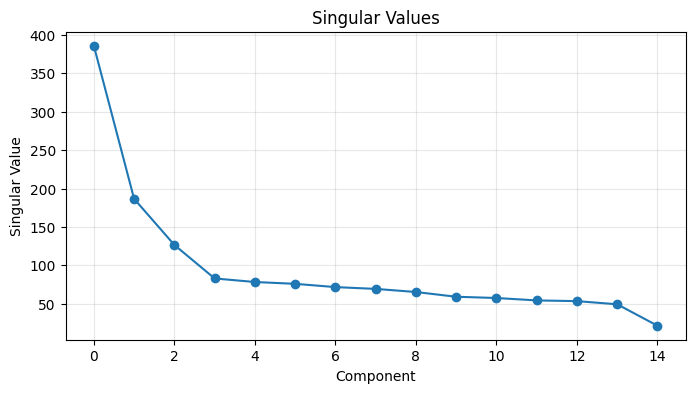

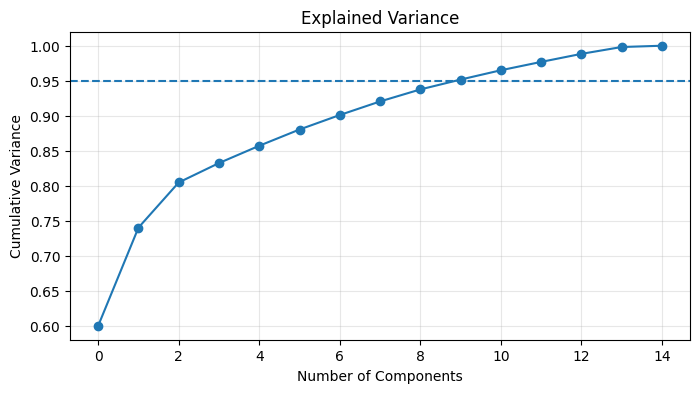

Number of components: 10


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:122: RuntimeWarning: divide by zero encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:122: RuntimeWarning: overflow encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:122: RuntimeWarning: invalid value encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:123: RuntimeWarning: divide by zero encountered in matmul
  Z_val = X_val @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:123: RuntimeWarning: overflow encountered in matmul
  Z_val = X_val @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:123: RuntimeWarning: invalid value encountered in matmul
  Z_val = X_val @ Vk


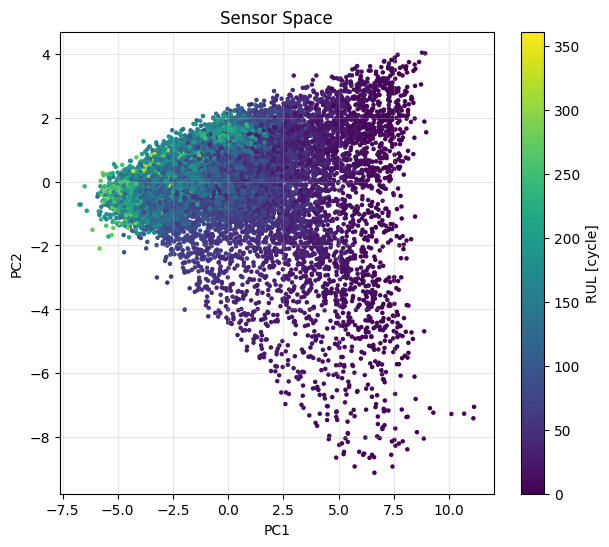

Matrix rank: 11
Validation RMSE: 38.19
Validation MAE: 30.19


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:151: RuntimeWarning: divide by zero encountered in matmul
  y_pred = Z_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:151: RuntimeWarning: overflow encountered in matmul
  y_pred = Z_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:151: RuntimeWarning: invalid value encountered in matmul
  y_pred = Z_val @ beta


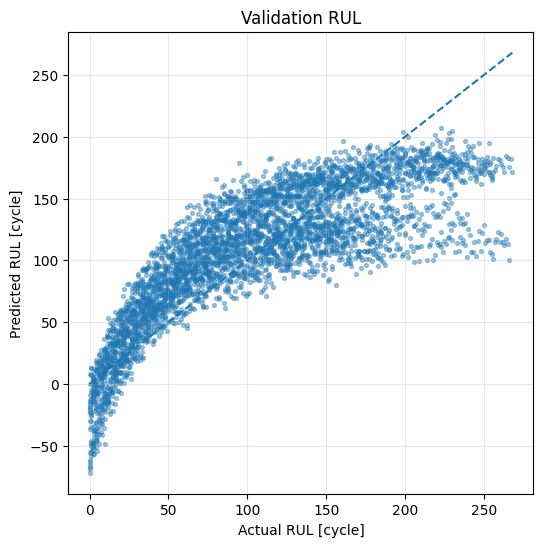

Test RMSE: 31.65
Test MAE: 25.50


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:179: RuntimeWarning: divide by zero encountered in matmul
  Z_test = X_test_last @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:179: RuntimeWarning: overflow encountered in matmul
  Z_test = X_test_last @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:179: RuntimeWarning: invalid value encountered in matmul
  Z_test = X_test_last @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:183: RuntimeWarning: divide by zero encountered in matmul
  y_test_pred = Z_test @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:183: RuntimeWarning: overflow encountered in matmul
  y_test_pred = Z_test @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2492395685.py:183: RuntimeWarning: invalid value encountered in matmul
  y_test_pred = Z_test @ beta


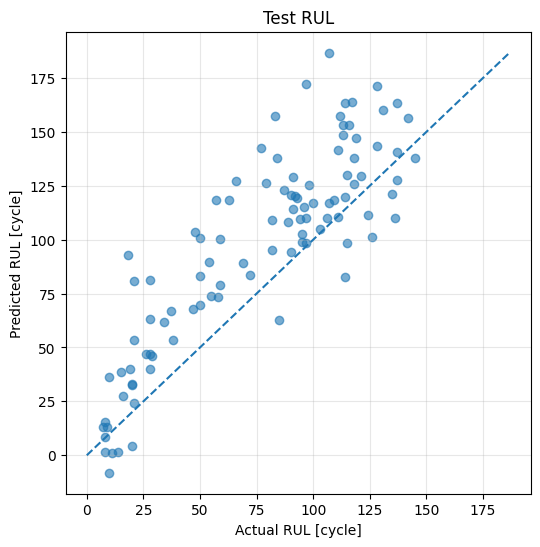

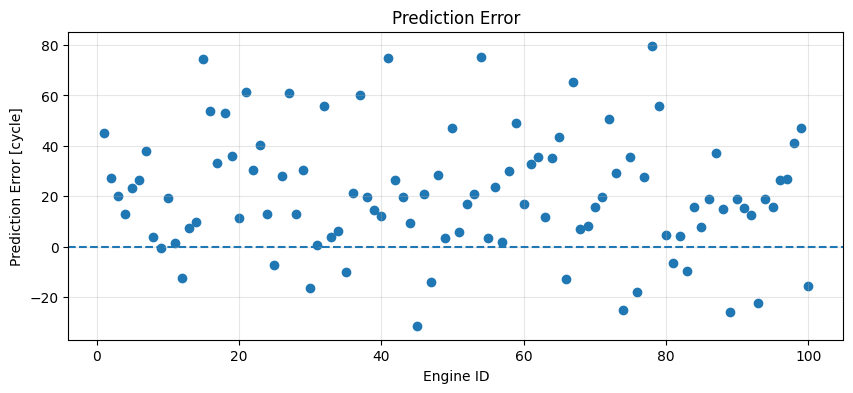

In [5]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split


# RUL 생성
train_df["RUL"] = train_df.groupby("unit_id")["cycle"].transform("max") - train_df["cycle"]


# 엔진 단위로 Train / Validation 분리
unit_ids = train_df["unit_id"].unique()
train_units, val_units = train_test_split(unit_ids, test_size=0.2, random_state=42)

train_data = train_df[train_df["unit_id"].isin(train_units)].copy()
val_data = train_df[train_df["unit_id"].isin(val_units)].copy()


# 센서 선택
sensor_cols = [f"sensor_{i}" for i in range(1, 22)]

X_train_raw = train_data[sensor_cols].to_numpy(dtype=float)
X_val_raw = val_data[sensor_cols].to_numpy(dtype=float)
X_test_raw = test_df[sensor_cols].to_numpy(dtype=float)


# 원본 데이터에 NaN / Inf가 있는지 확인
if not np.isfinite(X_train_raw).all():
    raise ValueError("Train sensor data contains NaN or Inf.")

if not np.isfinite(X_val_raw).all():
    raise ValueError("Validation sensor data contains NaN or Inf.")

if not np.isfinite(X_test_raw).all():
    raise ValueError("Test sensor data contains NaN or Inf.")


# Train 기준 평균과 표준편차
mean = X_train_raw.mean(axis=0)
std = X_train_raw.std(axis=0)


# 분산이 없거나 거의 없는 센서 제거
valid = std > 1e-8

sensor_cols = np.array(sensor_cols)[valid].tolist()

X_train_raw = X_train_raw[:, valid]
X_val_raw = X_val_raw[:, valid]
X_test_raw = X_test_raw[:, valid]

mean = mean[valid]
std = std[valid]

print("Selected sensors:")
print(sensor_cols)


# Standardization
X_train = (X_train_raw - mean) / std
X_val = (X_val_raw - mean) / std
X_test = (X_test_raw - mean) / std

y_train = train_data["RUL"].to_numpy(dtype=float)
y_val = val_data["RUL"].to_numpy(dtype=float)


# 정규화 이후 다시 확인
if not np.isfinite(X_train).all():
    raise ValueError("Normalization produced NaN or Inf.")

if not np.isfinite(X_val).all():
    raise ValueError("Normalization produced NaN or Inf.")

if not np.isfinite(X_test).all():
    raise ValueError("Normalization produced NaN or Inf.")


# SVD
# X = U Σ V^T
U, S, Vt = np.linalg.svd(X_train, full_matrices=False)

print("X shape:", X_train.shape)
print("Singular values:")
print(S)


# Singular Values
plt.figure(figsize=(8, 4))
plt.plot(S, "o-")
plt.xlabel("Component")
plt.ylabel("Singular Value")
plt.title("Singular Values")
plt.grid(alpha=0.3)
plt.show()


# Explained Variance
explained_variance = S ** 2 / np.sum(S ** 2)
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 4))
plt.plot(cumulative_variance, "o-")
plt.axhline(0.95, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance")
plt.title("Explained Variance")
plt.grid(alpha=0.3)
plt.show()


# 누적 설명 분산 95% 기준으로 차원 선택
k = np.argmax(cumulative_variance >= 0.95) + 1

print("Number of components:", k)


# Principal Component 공간으로 투영
Vk = Vt[:k].T

Z_train = X_train @ Vk
Z_val = X_val @ Vk


# PCA 공간 시각화
if k >= 2:
    plt.figure(figsize=(7, 6))
    scatter = plt.scatter(Z_train[:, 0], Z_train[:, 1], c=y_train, s=5)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title("Sensor Space")
    plt.colorbar(scatter, label="RUL [cycle]")
    plt.grid(alpha=0.3)
    plt.show()


# Bias 추가
Z_train = np.c_[np.ones(len(Z_train)), Z_train]
Z_val = np.c_[np.ones(len(Z_val)), Z_val]


# Least Squares
# beta = argmin ||Z beta - y||^2
beta, _, rank, _ = np.linalg.lstsq(Z_train, y_train, rcond=None)

print("Matrix rank:", rank)


# Validation
y_pred = Z_val @ beta

rmse = np.sqrt(mean_squared_error(y_val, y_pred))
mae = mean_absolute_error(y_val, y_pred)

print(f"Validation RMSE: {rmse:.2f}")
print(f"Validation MAE: {mae:.2f}")


# Validation 결과
plt.figure(figsize=(6, 6))
plt.scatter(y_val, y_pred, s=8, alpha=0.4)

limit = max(y_val.max(), y_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Validation RUL")
plt.grid(alpha=0.3)
plt.show()


# Test에서는 각 엔진의 마지막 상태만 사용
test_last = test_df.groupby("unit_id").tail(1)

X_test_last = test_last[sensor_cols].to_numpy(dtype=float)
X_test_last = (X_test_last - mean) / std
Z_test = X_test_last @ Vk
Z_test = np.c_[np.ones(len(Z_test)), Z_test]

y_test = rul_df["RUL"].to_numpy(dtype=float)
y_test_pred = Z_test @ beta


# Test 평가
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)

print(f"Test RMSE: {test_rmse:.2f}")
print(f"Test MAE: {test_mae:.2f}")


# Actual vs Predicted
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6)

limit = max(y_test.max(), y_test_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Test RUL")
plt.grid(alpha=0.3)
plt.show()


# 엔진별 Prediction Error
engine_ids = test_last["unit_id"].to_numpy()
error = y_test_pred - y_test

plt.figure(figsize=(10, 4))
plt.scatter(engine_ids, error)
plt.axhline(0, linestyle="--")
plt.xlabel("Engine ID")
plt.ylabel("Prediction Error [cycle]")
plt.title("Prediction Error")
plt.grid(alpha=0.3)
plt.show()

## 변경한 이유

### 1. RUL을 125 cycle로 제한

기존에는 모든 시점에 대해 실제 RUL을 그대로 사용하였다.  
하지만 엔진이 충분히 건강한 초기 구간에서는 센서값만으로 RUL이 200인지 250인지와 같은 차이를 명확하게 구분하기 어렵다.

따라서 초기 구간의 RUL을 일정한 값으로 제한하였다.

$$
RUL = \min(RUL_{raw}, 125)
$$

이를 통해 모델이 초기 healthy 구간의 불확실한 RUL 차이를 억지로 학습하는 것을 줄이고, 실제 열화가 나타나는 구간의 변화에 더 집중하도록 하였다.

### 2. SVD 차원 선택 기준 변경

기존에는 누적 설명 분산이 95% 이상이 되는 $k$를 선택하였다.

하지만 설명 분산이 높다는 것은 센서 데이터를 잘 표현한다는 의미이지, 해당 성분들이 반드시 **RUL 예측에 유용하다** 는 의미는 아니다.

따라서 변경된 코드에서는 여러 $k$에 대해 직접 RUL을 예측하고, **Validation RMSE가 가장 낮은 $k$** 를 선택하도록 변경하였다.

즉,

- 기존: 센서 데이터 보존을 기준으로 $k$ 선택
- 변경: 실제 RUL 예측 성능을 기준으로 $k$ 선택

### 3. Quadratic Feature 추가

기존 모델은 SVD 결과와 RUL 사이를 선형 관계로 가정하였다.

$$
\hat{y} = \beta_0 + \beta_1z_1 + \cdots + \beta_kz_k
$$

하지만 엔진의 열화 과정에서 센서 변화와 RUL의 관계가 반드시 선형이라고 보기 어렵다.

따라서 다음과 같이 제곱항과 성분 간 상호작용을 추가하였다.

$$
\Phi(Z)
=
[1,z_1,\dots,z_k,z_1^2,z_1z_2,\dots,z_k^2]
$$

이를 통해 복잡한 모델을 사용하지 않고도 센서와 RUL 사이의 **비선형 관계** 를 일부 표현할 수 있도록 하였다.

### 4. Tikhonov Regularization 추가

Quadratic Feature를 추가하면 입력 feature의 수가 증가하고, 서로 비슷한 feature가 생기면서 계수가 과도하게 커지거나 과적합이 발생할 수 있다.

이를 방지하기 위해 Least Squares에 regularization 항을 추가하였다.

$$
\min_{\beta}
\|\Phi\beta-y\|^2
+
\lambda\|L\beta\|^2
$$

$\lambda$가 클수록 회귀 계수가 지나치게 커지는 것을 억제한다.

또한 $\lambda$를 임의로 지정하지 않고 Validation RMSE를 이용하여 선택하도록 하였다.

### 5. 전체 Train 데이터로 다시 학습

Train / Validation 분리는 최적의 $k$와 $\lambda$를 선택하기 위해 필요하다.

하지만 최적 hyperparameter를 결정한 이후에도 기존 Train 데이터 일부만 사용하면 Validation으로 분리했던 데이터를 최종 학습에 활용하지 못한다.

따라서

$$
Train/Validation
\rightarrow
k,\lambda\ 선택
\rightarrow
전체\ Train\ 재학습
\rightarrow
Test
$$

순서로 변경하였다.

이를 통해 모델 선택에는 Validation 데이터를 사용하면서도, 최종 모델은 사용 가능한 전체 Training 데이터를 활용하도록 하였다.

Selected sensors:
['sensor_2', 'sensor_3', 'sensor_4', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_17', 'sensor_20', 'sensor_21']
X shape: (16561, 15)
Singular values:
[385.97113208 186.66856415 126.62485614  83.00551839  78.36095591
  75.99477474  71.73631147  69.39909167  65.33274582  59.17086052
  57.53711296  54.39343343  53.47196608  49.35780279  21.45267703]


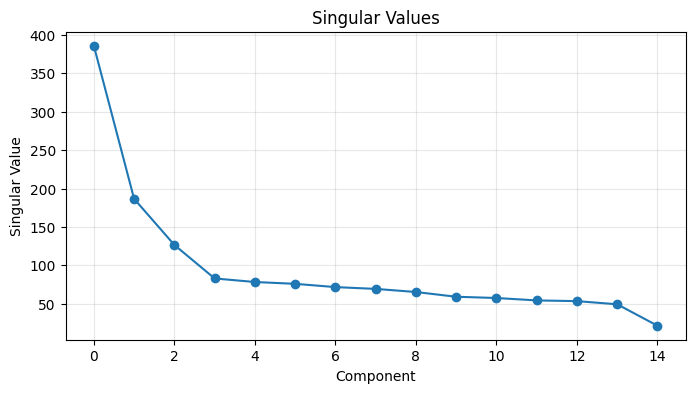

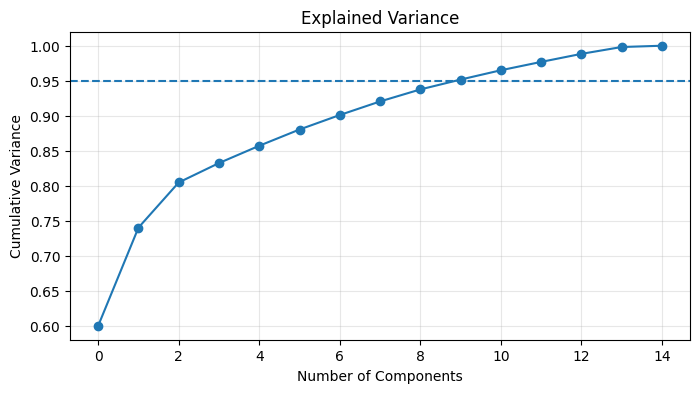

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:184: RuntimeWarning: divide by zero encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:184: RuntimeWarning: overflow encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:184: RuntimeWarning: invalid value encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:185: RuntimeWarning: divide by zero encountered in matmul
  Z_val = X_val @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:185: RuntimeWarning: overflow encountered in matmul
  Z_val = X_val @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:185: RuntimeWarning: invalid value encountered in matmul
  Z_val = X_val @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4

Best k: 12
Best lambda: 0.0
Validation RMSE: 18.52


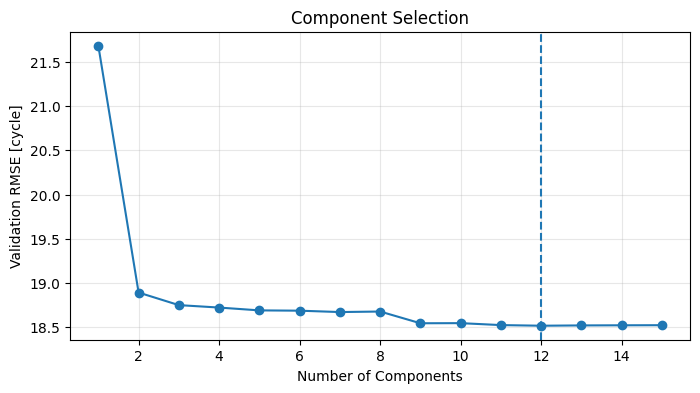

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:234: RuntimeWarning: divide by zero encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:234: RuntimeWarning: overflow encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:234: RuntimeWarning: invalid value encountered in matmul
  Z_train = X_train @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:235: RuntimeWarning: divide by zero encountered in matmul
  Z_val = X_val @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:235: RuntimeWarning: overflow encountered in matmul
  Z_val = X_val @ Vk
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:235: RuntimeWarning: invalid value encountered in matmul
  Z_val = X_val @ Vk


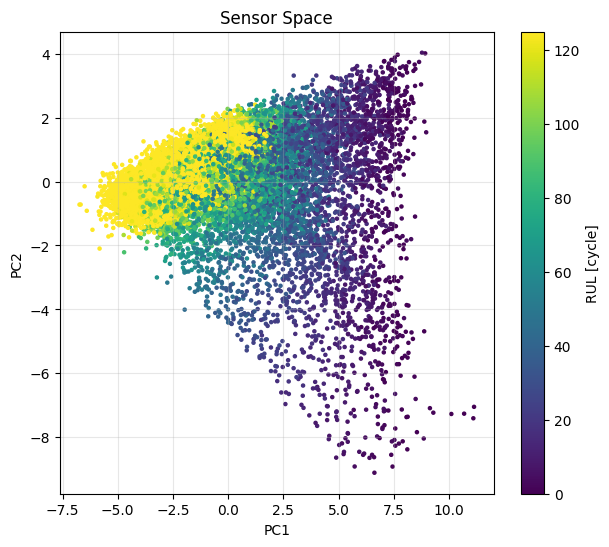

Principal component dimension: 12
Quadratic feature dimension: 91
Validation RMSE: 18.52
Validation MAE: 14.65
Quadratic matrix condition number: 5.85e+03


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:269: RuntimeWarning: divide by zero encountered in matmul
  y_val_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:269: RuntimeWarning: overflow encountered in matmul
  y_val_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:269: RuntimeWarning: invalid value encountered in matmul
  y_val_pred = Phi_val @ beta


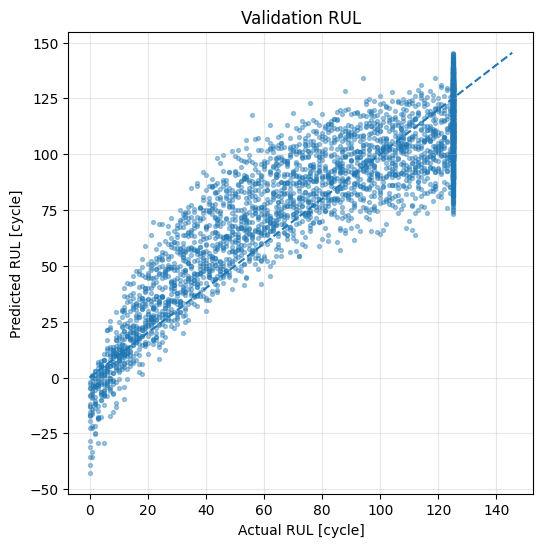

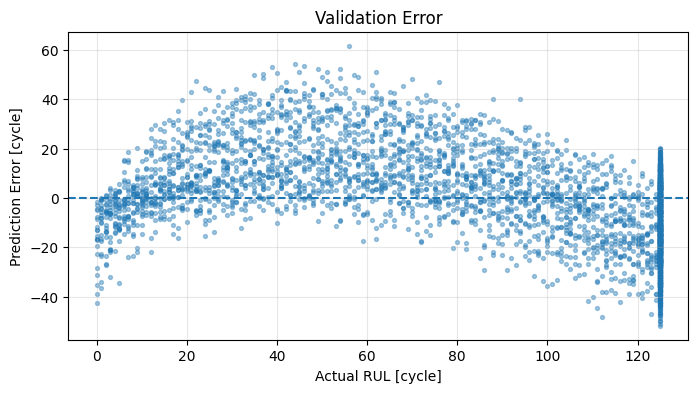

Test RMSE: 19.02
Test MAE: 14.29


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:358: RuntimeWarning: divide by zero encountered in matmul
  Z_full = X_full @ Vk_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:358: RuntimeWarning: overflow encountered in matmul
  Z_full = X_full @ Vk_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:358: RuntimeWarning: invalid value encountered in matmul
  Z_full = X_full @ Vk_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:379: RuntimeWarning: divide by zero encountered in matmul
  Z_test = X_test_last @ Vk_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:379: RuntimeWarning: overflow encountered in matmul
  Z_test = X_test_last @ Vk_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/3959870734.py:379: RuntimeWarning: invalid value encountered in matmul
  Z_test = X_test_last @ Vk_full
/var/folders/2p

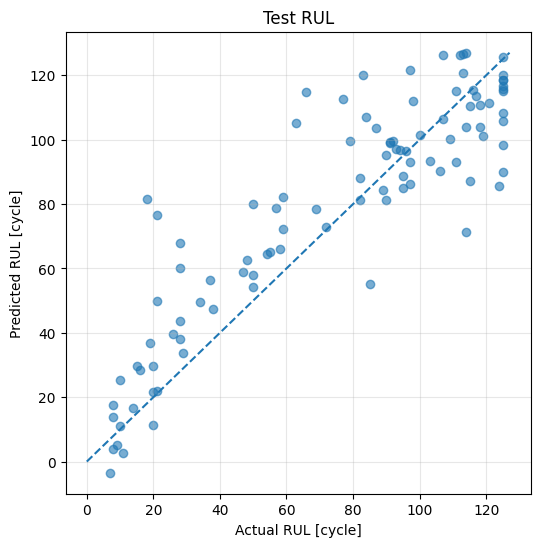

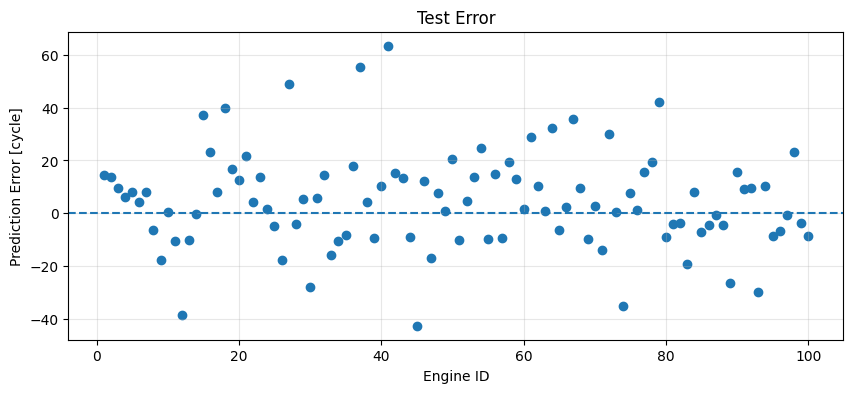

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split


# ------------------------------------------------------------
# RUL
# 초기 healthy 영역에서는 정확한 RUL 구분이 어려우므로 125 cycle로 제한
# None으로 설정하면 원래 RUL을 그대로 사용
# ------------------------------------------------------------

rul_limit = 125

train_df["RUL_raw"] = train_df.groupby("unit_id")["cycle"].transform("max") - train_df["cycle"]

if rul_limit is None:
    train_df["RUL"] = train_df["RUL_raw"]
else:
    train_df["RUL"] = train_df["RUL_raw"].clip(upper=rul_limit)


# ------------------------------------------------------------
# Train / Validation
# 같은 엔진이 두 집합에 동시에 들어가지 않도록 unit_id 기준으로 분리
# ------------------------------------------------------------

unit_ids = train_df["unit_id"].unique()
train_units, val_units = train_test_split(unit_ids, test_size=0.2, random_state=42)

train_data = train_df[train_df["unit_id"].isin(train_units)].copy()
val_data = train_df[train_df["unit_id"].isin(val_units)].copy()


# ------------------------------------------------------------
# Sensor
# ------------------------------------------------------------

sensor_cols = [f"sensor_{i}" for i in range(1, 22)]

X_train_raw = train_data[sensor_cols].to_numpy(dtype=float)
X_val_raw = val_data[sensor_cols].to_numpy(dtype=float)

if not np.isfinite(X_train_raw).all() or not np.isfinite(X_val_raw).all():
    raise ValueError("Sensor data contains NaN or Inf.")


# ------------------------------------------------------------
# Train 데이터 기준으로 상수 센서 제거
# ------------------------------------------------------------

mean = X_train_raw.mean(axis=0)
std = X_train_raw.std(axis=0)

valid = std > 1e-8

sensor_cols = np.array(sensor_cols)[valid].tolist()

X_train_raw = X_train_raw[:, valid]
X_val_raw = X_val_raw[:, valid]

mean = mean[valid]
std = std[valid]

print("Selected sensors:")
print(sensor_cols)


# ------------------------------------------------------------
# Standardization
# ------------------------------------------------------------

X_train = (X_train_raw - mean) / std
X_val = (X_val_raw - mean) / std

y_train = train_data["RUL"].to_numpy(dtype=float)
y_val = val_data["RUL"].to_numpy(dtype=float)

if not np.isfinite(X_train).all() or not np.isfinite(X_val).all():
    raise ValueError("Normalization produced NaN or Inf.")


# ------------------------------------------------------------
# SVD
#
# X = U Σ V^T
# ------------------------------------------------------------

_, S, Vt = np.linalg.svd(X_train, full_matrices=False)

print("X shape:", X_train.shape)
print("Singular values:")
print(S)


# ------------------------------------------------------------
# Singular Values
# ------------------------------------------------------------

plt.figure(figsize=(8, 4))
plt.plot(S, "o-")
plt.xlabel("Component")
plt.ylabel("Singular Value")
plt.title("Singular Values")
plt.grid(alpha=0.3)
plt.show()


# ------------------------------------------------------------
# Explained Variance
# ------------------------------------------------------------

explained_variance = S ** 2 / np.sum(S ** 2)
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 4))
plt.plot(cumulative_variance, "o-")
plt.axhline(0.95, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance")
plt.title("Explained Variance")
plt.grid(alpha=0.3)
plt.show()


# ------------------------------------------------------------
# Quadratic Basis
#
# [1, z1, z2, ..., z1^2, z1z2, ..., zk^2]
# ------------------------------------------------------------

def quadratic_features(Z):
    features = [np.ones(len(Z))]

    for i in range(Z.shape[1]):
        features.append(Z[:, i])

    for i in range(Z.shape[1]):
        for j in range(i, Z.shape[1]):
            features.append(Z[:, i] * Z[:, j])

    return np.column_stack(features)


# ------------------------------------------------------------
# Tikhonov Regularization
#
# min ||Phi beta - y||^2 + lambda ||L beta||^2
#
# bias는 regularization하지 않음
# ------------------------------------------------------------

def tikhonov(Phi, y, lam):
    L = np.eye(Phi.shape[1])
    L[0, 0] = 0

    A = np.vstack([Phi, np.sqrt(lam) * L])
    b = np.concatenate([y, np.zeros(Phi.shape[1])])

    beta, _, _, _ = np.linalg.lstsq(A, b, rcond=None)

    return beta


def rmse(y, y_pred):
    return np.sqrt(np.mean((y - y_pred) ** 2))


def mae(y, y_pred):
    return np.mean(np.abs(y - y_pred))


# ------------------------------------------------------------
# k와 lambda를 Validation으로 선택
# ------------------------------------------------------------

lambda_grid = [0.0, 1e-4, 1e-3, 1e-2, 1e-1, 1.0, 10.0, 100.0]

results = []

for k in range(1, len(S) + 1):
    Vk = Vt[:k].T

    Z_train = X_train @ Vk
    Z_val = X_val @ Vk

    Phi_train = quadratic_features(Z_train)
    Phi_val = quadratic_features(Z_val)

    for lam in lambda_grid:
        beta = tikhonov(Phi_train, y_train, lam)
        y_pred = Phi_val @ beta

        results.append((k, lam, rmse(y_val, y_pred)))

best_k, best_lambda, best_rmse = min(results, key=lambda x: x[2])

print("Best k:", best_k)
print("Best lambda:", best_lambda)
print(f"Validation RMSE: {best_rmse:.2f}")


# ------------------------------------------------------------
# 각 k에서 가장 좋은 Validation RMSE
# ------------------------------------------------------------

k_values = range(1, len(S) + 1)
rmse_by_k = []
lambda_by_k = []

for k in k_values:
    k_results = [result for result in results if result[0] == k]
    best = min(k_results, key=lambda x: x[2])

    lambda_by_k.append(best[1])
    rmse_by_k.append(best[2])

plt.figure(figsize=(8, 4))
plt.plot(k_values, rmse_by_k, "o-")
plt.axvline(best_k, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Validation RMSE [cycle]")
plt.title("Component Selection")
plt.grid(alpha=0.3)
plt.show()


# ------------------------------------------------------------
# 선택된 SVD 공간
# ------------------------------------------------------------

Vk = Vt[:best_k].T

Z_train = X_train @ Vk
Z_val = X_val @ Vk


# ------------------------------------------------------------
# Sensor Space
# ------------------------------------------------------------

if best_k >= 2:
    plt.figure(figsize=(7, 6))
    scatter = plt.scatter(Z_train[:, 0], Z_train[:, 1], c=y_train, s=5)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title("Sensor Space")
    plt.colorbar(scatter, label="RUL [cycle]")
    plt.grid(alpha=0.3)
    plt.show()


# ------------------------------------------------------------
# Quadratic Feature Space
# ------------------------------------------------------------

Phi_train = quadratic_features(Z_train)
Phi_val = quadratic_features(Z_val)

print("Principal component dimension:", Z_train.shape[1])
print("Quadratic feature dimension:", Phi_train.shape[1])


# ------------------------------------------------------------
# Tikhonov 최종 Validation 모델
# ------------------------------------------------------------

beta = tikhonov(Phi_train, y_train, best_lambda)
y_val_pred = Phi_val @ beta

val_rmse = rmse(y_val, y_val_pred)
val_mae = mae(y_val, y_val_pred)

print(f"Validation RMSE: {val_rmse:.2f}")
print(f"Validation MAE: {val_mae:.2f}")


# ------------------------------------------------------------
# Conditioning 확인
# ------------------------------------------------------------

phi_singular_values = np.linalg.svd(Phi_train, compute_uv=False)

if phi_singular_values[-1] > 0:
    condition_number = phi_singular_values[0] / phi_singular_values[-1]
else:
    condition_number = np.inf

print(f"Quadratic matrix condition number: {condition_number:.2e}")


# ------------------------------------------------------------
# Validation Actual vs Predicted
# ------------------------------------------------------------

plt.figure(figsize=(6, 6))
plt.scatter(y_val, y_val_pred, s=8, alpha=0.4)

limit = max(y_val.max(), y_val_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Validation RUL")
plt.grid(alpha=0.3)
plt.show()


# ------------------------------------------------------------
# Validation Error
# ------------------------------------------------------------

val_error = y_val_pred - y_val

plt.figure(figsize=(8, 4))
plt.scatter(y_val, val_error, s=8, alpha=0.4)
plt.axhline(0, linestyle="--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Prediction Error [cycle]")
plt.title("Validation Error")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Final Model
#
# Validation으로 k와 lambda를 결정했으므로
# 이제 전체 train_FD001을 사용하여 다시 학습
# ============================================================

X_full_raw = train_df[sensor_cols].to_numpy(dtype=float)
X_test_raw = test_df[sensor_cols].to_numpy(dtype=float)

full_mean = X_full_raw.mean(axis=0)
full_std = X_full_raw.std(axis=0)

if np.any(full_std <= 1e-8):
    raise ValueError("A selected sensor became constant in the full training data.")

X_full = (X_full_raw - full_mean) / full_std
X_test = (X_test_raw - full_mean) / full_std

y_full = train_df["RUL"].to_numpy(dtype=float)

if not np.isfinite(X_full).all() or not np.isfinite(X_test).all():
    raise ValueError("Final normalization produced NaN or Inf.")


# ------------------------------------------------------------
# 전체 Training 데이터에서 SVD 다시 계산
# ------------------------------------------------------------

_, S_full, Vt_full = np.linalg.svd(X_full, full_matrices=False)

Vk_full = Vt_full[:best_k].T

Z_full = X_full @ Vk_full
Phi_full = quadratic_features(Z_full)


# ------------------------------------------------------------
# 전체 Training 데이터로 최종 Tikhonov 모델 학습
# ------------------------------------------------------------

beta_full = tikhonov(Phi_full, y_full, best_lambda)


# ------------------------------------------------------------
# Test
# 각 엔진의 마지막 관측 상태만 사용
# ------------------------------------------------------------

test_last = test_df.groupby("unit_id").tail(1).sort_values("unit_id")

X_test_last = test_last[sensor_cols].to_numpy(dtype=float)
X_test_last = (X_test_last - full_mean) / full_std

Z_test = X_test_last @ Vk_full
Phi_test = quadratic_features(Z_test)

y_test_raw = rul_df["RUL"].to_numpy(dtype=float)

if rul_limit is None:
    y_test = y_test_raw
else:
    y_test = np.minimum(y_test_raw, rul_limit)

y_test_pred = Phi_test @ beta_full


# ------------------------------------------------------------
# Test Evaluation
# ------------------------------------------------------------

test_rmse = rmse(y_test, y_test_pred)
test_mae = mae(y_test, y_test_pred)

print(f"Test RMSE: {test_rmse:.2f}")
print(f"Test MAE: {test_mae:.2f}")


# ------------------------------------------------------------
# Test Actual vs Predicted
# ------------------------------------------------------------

plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6)

limit = max(y_test.max(), y_test_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Test RUL")
plt.grid(alpha=0.3)
plt.show()


# ------------------------------------------------------------
# Engine별 Test Error
# ------------------------------------------------------------

engine_ids = test_last["unit_id"].to_numpy()
test_error = y_test_pred - y_test

plt.figure(figsize=(10, 4))
plt.scatter(engine_ids, test_error)
plt.axhline(0, linestyle="--")
plt.xlabel("Engine ID")
plt.ylabel("Prediction Error [cycle]")
plt.title("Test Error")
plt.grid(alpha=0.3)
plt.show()

## 변경된 부분

### 1. SVD 차원을 PC1, PC2로 고정

기존에는 여러 $k$를 비교하여 Validation RMSE가 가장 작은 차원을 선택했지만, 이번에는 **PC1과 PC2 두 개의 성분만 사용** 하도록 변경하였다.

$$
Z = XV_2
$$

이는 RUL과 센서 데이터의 관계를 2차원 PC 공간에서 직접 확인하고, 이후 회귀 결과를 3차원으로 시각화하기 위해 변경하였다.

### 2. Quadratic Feature 제거

기존에는 SVD 결과에 제곱항과 상호작용항을 추가하였다.

$$
[1,z_1,z_2,\dots,z_1^2,z_1z_2,\dots]
$$

이번에는 이러한 항을 제거하고 PC1과 PC2만 사용한다.

$$
[1,PC1,PC2]
$$

복잡한 비선형 모델보다 먼저 **SVD 공간과 RUL 사이의 기본적인 선형 관계를 확인** 하기 위해 단순화하였다.

### 3. Tikhonov Regularization 제거

Quadratic Feature를 제거하면서 feature 수가 크게 줄었기 때문에 Tikhonov Regularization과 $\lambda$ 탐색도 제거하였다.

대신 일반적인 Least Squares를 사용한다.

$$
\beta = \arg\min_{\beta}\|A\beta-y\|^2
$$

최종적으로 다음과 같은 단순한 평면으로 RUL을 표현한다.

$$
RUL = \beta_0 + \beta_1PC1 + \beta_2PC2
$$

### 4. Regression Plane 시각화 추가

PC1, PC2와 실제 RUL을 3차원 공간에 나타내고, Least Squares로 구한 회귀 평면을 함께 표시하도록 변경하였다.

이를 통해 **센서의 주요 변화 방향과 RUL 사이의 관계가 실제로 평면으로 설명 가능한지 시각적으로 확인** 할 수 있다.

### 5. Residual Space 시각화 추가

예측 오차를 다음과 같이 정의하였다.

$$
Error = Predicted\ RUL - Actual\ RUL
$$

이를 PC1, PC2 공간에 함께 나타내어 특정 영역에서 오차가 집중적으로 발생하는지 확인하도록 하였다.

단순히 RMSE와 MAE만 확인하는 것보다 **선형 평면 모델이 어느 영역에서 잘 맞지 않는지 분석하기 위해 추가** 하였다.

Selected sensors: ['sensor_2', 'sensor_3', 'sensor_4', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_17', 'sensor_20', 'sensor_21']
Sensor dimension: 15


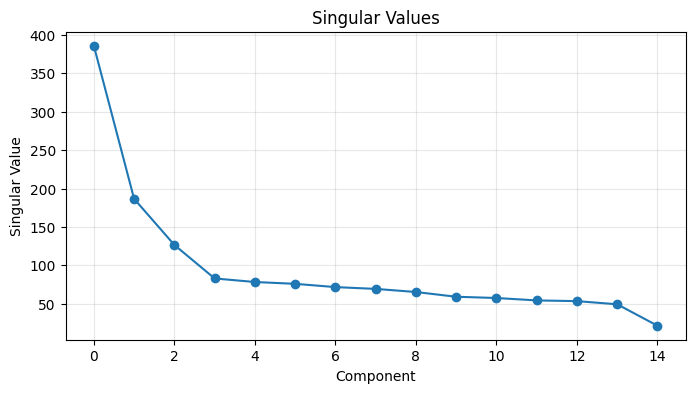

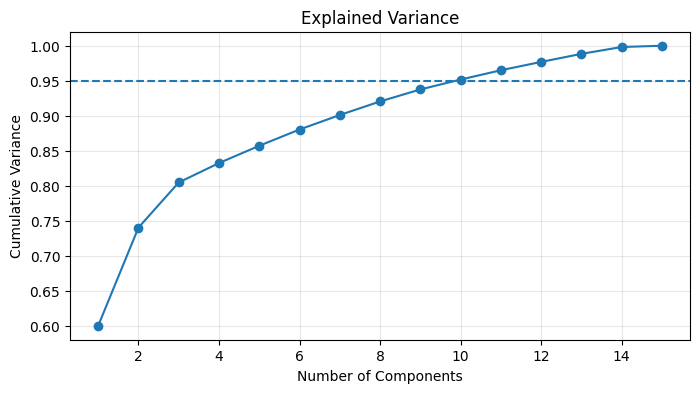

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:122: RuntimeWarning: divide by zero encountered in matmul
  Z_train = X_train @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:122: RuntimeWarning: overflow encountered in matmul
  Z_train = X_train @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:122: RuntimeWarning: invalid value encountered in matmul
  Z_train = X_train @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:123: RuntimeWarning: divide by zero encountered in matmul
  Z_val = X_val @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:123: RuntimeWarning: overflow encountered in matmul
  Z_val = X_val @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:123: RuntimeWarning: invalid value encountered in matmul
  Z_val = X_val @ V2


Original dimension: 15
Reduced dimension: 2


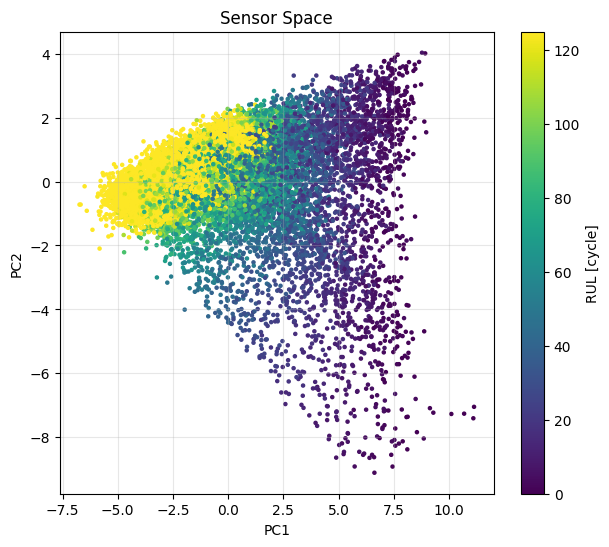

Plane coefficients:
[ 86.95881891 -11.4509283    6.06876927]
Rank: 3
RUL = 86.959 + (-11.451) PC1 + (6.069) PC2
Validation RMSE: 20.64
Validation MAE: 16.69


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:154: RuntimeWarning: divide by zero encountered in matmul
  y_val_pred = A_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:154: RuntimeWarning: overflow encountered in matmul
  y_val_pred = A_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:154: RuntimeWarning: invalid value encountered in matmul
  y_val_pred = A_val @ beta
/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/mpl_toolkits/mplot3d/art3d.py:1239: RuntimeWarning: divide by zero encountered in matmul
  shade = ((normals / np.linalg.norm(normals, axis=1, keepdims=True))
/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/mpl_toolkits/mplot3d/art3d.py:1239: RuntimeWarning: overflow encountered in matmul
  shade = ((normals / np.linalg.norm(normals, axis=1, keepdims=True))


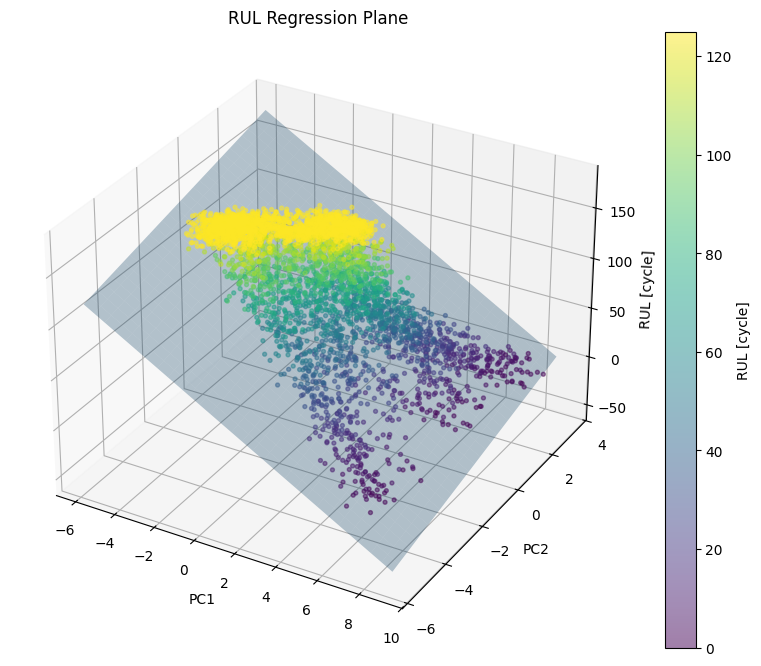

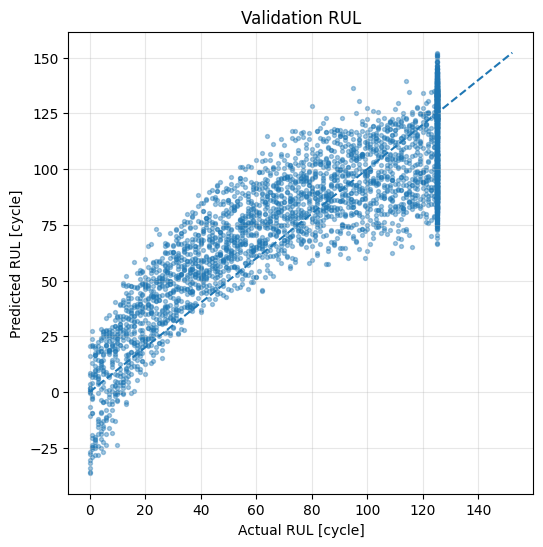

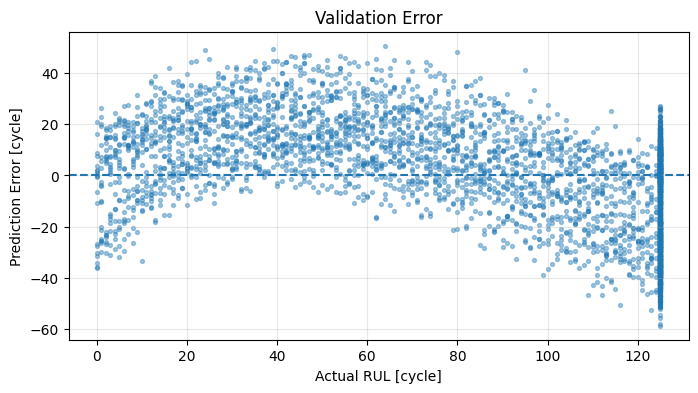

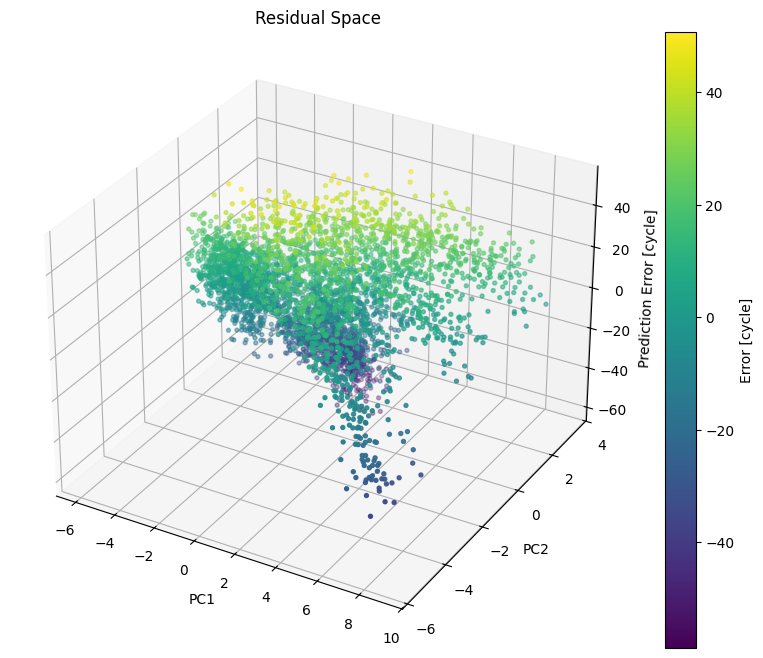

Final plane coefficients:
[ 86.82928603 -11.48351816   6.10469012]
Test RMSE: 20.58
Test MAE: 16.45


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:291: RuntimeWarning: divide by zero encountered in matmul
  Z_full = X_full @ V2_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:291: RuntimeWarning: overflow encountered in matmul
  Z_full = X_full @ V2_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2948721346.py:291: RuntimeWarning: invalid value encountered in matmul
  Z_full = X_full @ V2_full
/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/mpl_toolkits/mplot3d/art3d.py:1239: RuntimeWarning: divide by zero encountered in matmul
  shade = ((normals / np.linalg.norm(normals, axis=1, keepdims=True))
/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/mpl_toolkits/mplot3d/art3d.py:1239: RuntimeWarning: overflow encountered in matmul
  shade = ((normals / np.linalg.norm(normals, axis=1, keepdims=True))


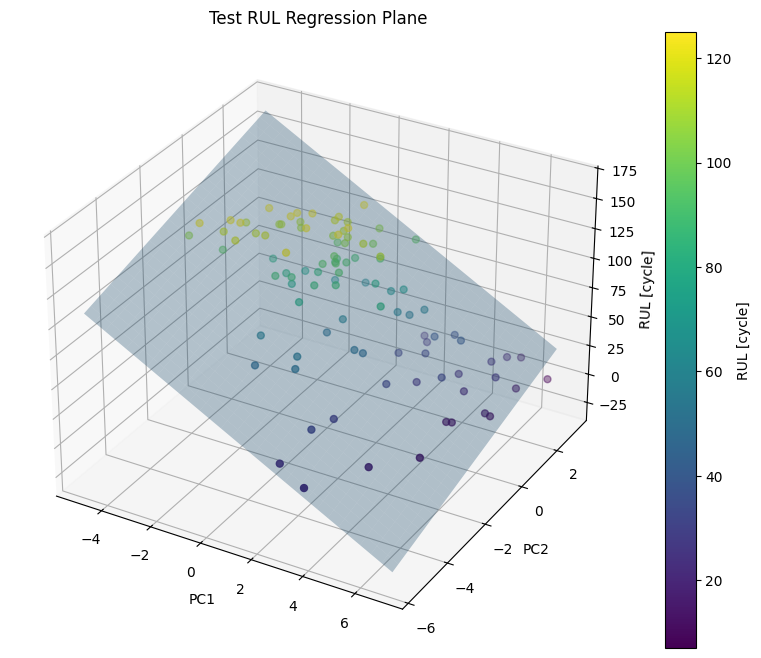

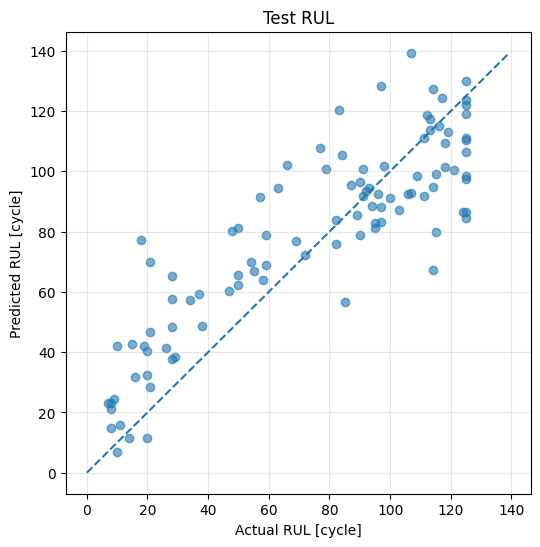

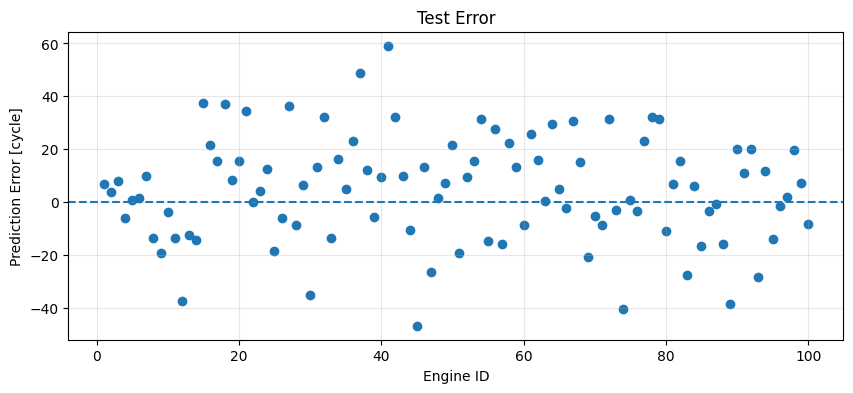

In [7]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split


# ============================================================
# RUL
# ============================================================

rul_limit = 125

train_df["RUL_raw"] = train_df.groupby("unit_id")["cycle"].transform("max") - train_df["cycle"]
train_df["RUL"] = train_df["RUL_raw"].clip(upper=rul_limit)


# ============================================================
# Train / Validation
# 같은 엔진이 두 데이터셋에 동시에 들어가지 않도록 분리
# ============================================================

unit_ids = train_df["unit_id"].unique()
train_units, val_units = train_test_split(unit_ids, test_size=0.2, random_state=42)

train_data = train_df[train_df["unit_id"].isin(train_units)].copy()
val_data = train_df[train_df["unit_id"].isin(val_units)].copy()


# ============================================================
# Sensor
# ============================================================

sensor_cols = [f"sensor_{i}" for i in range(1, 22)]

X_train_raw = train_data[sensor_cols].to_numpy(float)
X_val_raw = val_data[sensor_cols].to_numpy(float)

y_train = train_data["RUL"].to_numpy(float)
y_val = val_data["RUL"].to_numpy(float)

if not np.isfinite(X_train_raw).all() or not np.isfinite(X_val_raw).all():
    raise ValueError("Sensor data contains NaN or Inf.")


# ============================================================
# 상수 Sensor 제거
# ============================================================

mean = X_train_raw.mean(0)
std = X_train_raw.std(0)

valid = std > 1e-8

sensor_cols = np.array(sensor_cols)[valid].tolist()

X_train_raw = X_train_raw[:, valid]
X_val_raw = X_val_raw[:, valid]

mean = mean[valid]
std = std[valid]

print("Selected sensors:", sensor_cols)
print("Sensor dimension:", len(sensor_cols))


# ============================================================
# Standardization
# ============================================================

X_train = (X_train_raw - mean) / std
X_val = (X_val_raw - mean) / std

if not np.isfinite(X_train).all() or not np.isfinite(X_val).all():
    raise ValueError("Normalization produced NaN or Inf.")


# ============================================================
# SVD
#
# X = U Σ V^T
# ============================================================

_, S, Vt = np.linalg.svd(X_train, full_matrices=False)


# ============================================================
# Singular Values
# ============================================================

plt.figure(figsize=(8, 4))
plt.plot(S, "o-")
plt.xlabel("Component")
plt.ylabel("Singular Value")
plt.title("Singular Values")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Explained Variance
# ============================================================

explained_variance = S ** 2 / np.sum(S ** 2)
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 4))
plt.plot(range(1, len(S) + 1), cumulative_variance, "o-")
plt.axhline(0.95, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance")
plt.title("Explained Variance")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# PC1, PC2
# ============================================================

V2 = Vt[:2].T

Z_train = X_train @ V2
Z_val = X_val @ V2

print("Original dimension:", X_train.shape[1])
print("Reduced dimension:", Z_train.shape[1])


# ============================================================
# PC Sensor Space
# ============================================================

plt.figure(figsize=(7, 6))
scatter = plt.scatter(Z_train[:, 0], Z_train[:, 1], c=y_train, s=5)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Sensor Space")
plt.colorbar(scatter, label="RUL [cycle]")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Least Squares Plane
#
# RUL = b0 + b1 PC1 + b2 PC2
# ============================================================

A_train = np.c_[np.ones(len(Z_train)), Z_train]
A_val = np.c_[np.ones(len(Z_val)), Z_val]

beta, _, rank, singular_values = np.linalg.lstsq(A_train, y_train, rcond=None)

y_val_pred = A_val @ beta

print("Plane coefficients:")
print(beta)

print("Rank:", rank)

print(
    f"RUL = {beta[0]:.3f} "
    f"+ ({beta[1]:.3f}) PC1 "
    f"+ ({beta[2]:.3f}) PC2"
)


# ============================================================
# Evaluation
# ============================================================

def rmse(y, y_pred):
    return np.sqrt(np.mean((y - y_pred) ** 2))


def mae(y, y_pred):
    return np.mean(np.abs(y - y_pred))


print(f"Validation RMSE: {rmse(y_val, y_val_pred):.2f}")
print(f"Validation MAE: {mae(y_val, y_val_pred):.2f}")


# ============================================================
# Regression Plane
# ============================================================

pc1 = np.linspace(Z_val[:, 0].min(), Z_val[:, 0].max(), 30)
pc2 = np.linspace(Z_val[:, 1].min(), Z_val[:, 1].max(), 30)

PC1, PC2 = np.meshgrid(pc1, pc2)

RUL_plane = beta[0] + beta[1] * PC1 + beta[2] * PC2

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(Z_val[:, 0], Z_val[:, 1], y_val, c=y_val, s=8, alpha=0.5)
ax.plot_surface(PC1, PC2, RUL_plane, alpha=0.3)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("RUL [cycle]")
ax.set_title("RUL Regression Plane")

fig.colorbar(scatter, ax=ax, label="RUL [cycle]")

plt.show()


# ============================================================
# Validation Actual vs Predicted
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_val, y_val_pred, s=8, alpha=0.4)

limit = max(y_val.max(), y_val_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Validation RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Residual
# ============================================================

val_error = y_val_pred - y_val

plt.figure(figsize=(8, 4))
plt.scatter(y_val, val_error, s=8, alpha=0.4)
plt.axhline(0, linestyle="--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Prediction Error [cycle]")
plt.title("Validation Error")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Residual Space
# 평면이 어느 PC 영역에서 잘 맞지 않는지 확인
# ============================================================

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(Z_val[:, 0], Z_val[:, 1], val_error, c=val_error, s=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("Prediction Error [cycle]")
ax.set_title("Residual Space")

fig.colorbar(scatter, ax=ax, label="Error [cycle]")

plt.show()


# ============================================================
# 전체 Train 데이터로 최종 모델 재학습
# ============================================================

X_full_raw = train_df[sensor_cols].to_numpy(float)
y_full = train_df["RUL"].to_numpy(float)

full_mean = X_full_raw.mean(0)
full_std = X_full_raw.std(0)

if np.any(full_std <= 1e-8):
    raise ValueError("A selected sensor has zero variance.")

X_full = (X_full_raw - full_mean) / full_std

if not np.isfinite(X_full).all():
    raise ValueError("Full training data contains NaN or Inf.")


# ============================================================
# 전체 Train SVD
# ============================================================

_, _, Vt_full = np.linalg.svd(X_full, full_matrices=False)

V2_full = Vt_full[:2].T

Z_full = X_full @ V2_full

A_full = np.c_[np.ones(len(Z_full)), Z_full]

beta_full, _, _, _ = np.linalg.lstsq(A_full, y_full, rcond=None)

print("Final plane coefficients:")
print(beta_full)


# ============================================================
# Test
# 각 엔진의 마지막 상태 사용
# ============================================================

test_last = test_df.groupby("unit_id").tail(1).sort_values("unit_id")

X_test = test_last[sensor_cols].to_numpy(float)
X_test = (X_test - full_mean) / full_std

if not np.isfinite(X_test).all():
    raise ValueError("Test data contains NaN or Inf.")

Z_test = X_test @ V2_full

A_test = np.c_[np.ones(len(Z_test)), Z_test]

y_test_raw = rul_df["RUL"].to_numpy(float)
y_test = np.minimum(y_test_raw, rul_limit)

y_test_pred = A_test @ beta_full


# ============================================================
# Test Evaluation
# ============================================================

print(f"Test RMSE: {rmse(y_test, y_test_pred):.2f}")
print(f"Test MAE: {mae(y_test, y_test_pred):.2f}")


# ============================================================
# Test Regression Plane
# ============================================================

pc1 = np.linspace(Z_test[:, 0].min(), Z_test[:, 0].max(), 30)
pc2 = np.linspace(Z_test[:, 1].min(), Z_test[:, 1].max(), 30)

PC1, PC2 = np.meshgrid(pc1, pc2)

RUL_plane = beta_full[0] + beta_full[1] * PC1 + beta_full[2] * PC2

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(Z_test[:, 0], Z_test[:, 1], y_test, c=y_test, s=25)
ax.plot_surface(PC1, PC2, RUL_plane, alpha=0.3)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("RUL [cycle]")
ax.set_title("Test RUL Regression Plane")

fig.colorbar(scatter, ax=ax, label="RUL [cycle]")

plt.show()


# ============================================================
# Test Actual vs Predicted
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6)

limit = max(y_test.max(), y_test_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Test RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Test Error
# ============================================================

engine_ids = test_last["unit_id"].to_numpy()
test_error = y_test_pred - y_test

plt.figure(figsize=(10, 4))
plt.scatter(engine_ids, test_error)
plt.axhline(0, linestyle="--")
plt.xlabel("Engine ID")
plt.ylabel("Prediction Error [cycle]")
plt.title("Test Error")
plt.grid(alpha=0.3)
plt.show()

## 변경된 부분

### 1. Linear Plane에서 Quadratic Surface로 변경

이전에는 PC1과 PC2에 대해 단순한 선형 평면을 사용하였다.

$$
RUL = \beta_0 + \beta_1 PC1 + \beta_2 PC2
$$

하지만 PC 공간에서 RUL의 변화가 완전히 선형적이지 않을 수 있기 때문에 제곱항과 상호작용항을 추가하였다.

$$
RUL =
\beta_0
+ \beta_1 PC1
+ \beta_2 PC2
+ \beta_3 PC1^2
+ \beta_4 PC1PC2
+ \beta_5 PC2^2
$$

이를 통해 PC1, PC2와 RUL 사이의 곡면 형태의 관계까지 표현할 수 있도록 변경하였다.

### 2. Tikhonov Regularization 추가

Quadratic Feature를 추가하면서 feature 간 상관관계가 커지고 회귀 계수가 불안정해질 가능성이 생긴다.

이를 억제하기 위해 Tikhonov Regularization을 다시 적용하였다.

$$
\min_{\beta}
\|\Phi\beta-y\|^2
+
\lambda\|L\beta\|^2
$$

이를 통해 모델이 특정 feature에 지나치게 의존하거나 회귀 계수가 과도하게 커지는 것을 줄이도록 하였다.

### 3. Validation을 이용한 Lambda 선택 추가

Regularization의 강도를 임의로 결정하지 않고 여러 $\lambda$ 값을 비교하여 Validation RMSE가 가장 낮은 값을 선택하도록 변경하였다.

즉, 너무 작은 $\lambda$로 인한 과적합과 너무 큰 $\lambda$로 인한 과도한 제약 사이에서 적절한 값을 찾도록 하였다.

### 4. Condition Number 확인 추가

Quadratic Feature를 사용하면 입력 행렬의 수치적 불안정성이 커질 수 있기 때문에 Condition Number를 추가로 확인하도록 하였다.

Condition Number가 매우 크다면 feature 간 의존성이 높거나 회귀 문제가 불안정할 가능성이 있다는 것을 의미한다.

### 5. Regression Plane을 Regression Surface로 변경

이전에는 선형 회귀 결과를 하나의 평면으로 시각화했지만, Quadratic Feature를 사용하면서 예측 결과가 곡면 형태가 되기 때문에 Regression Surface로 변경하였다.

이를 통해 PC1, PC2에 따른 RUL의 비선형적인 변화가 실제 데이터와 어떻게 대응하는지 시각적으로 확인할 수 있다.

Selected sensors: ['sensor_2', 'sensor_3', 'sensor_4', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_17', 'sensor_20', 'sensor_21']
Sensor dimension: 15


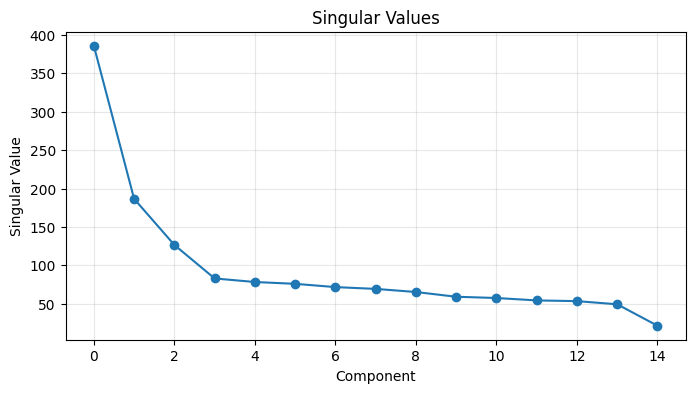

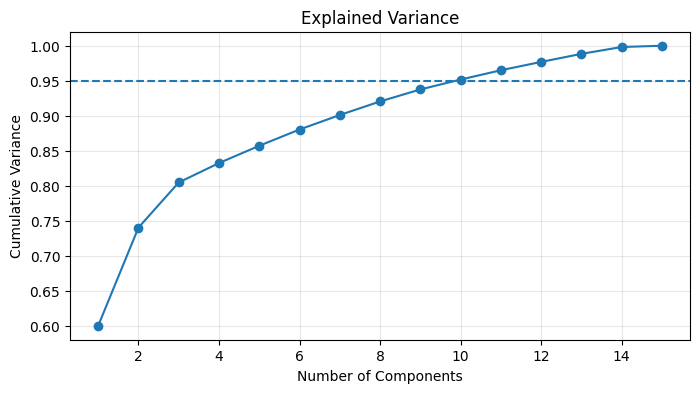

Original dimension: 15
Reduced dimension: 2


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:122: RuntimeWarning: divide by zero encountered in matmul
  Z_train = X_train @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:122: RuntimeWarning: overflow encountered in matmul
  Z_train = X_train @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:122: RuntimeWarning: invalid value encountered in matmul
  Z_train = X_train @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:123: RuntimeWarning: divide by zero encountered in matmul
  Z_val = X_val @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:123: RuntimeWarning: overflow encountered in matmul
  Z_val = X_val @ V2
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:123: RuntimeWarning: invalid value encountered in matmul
  Z_val = X_val @ V2


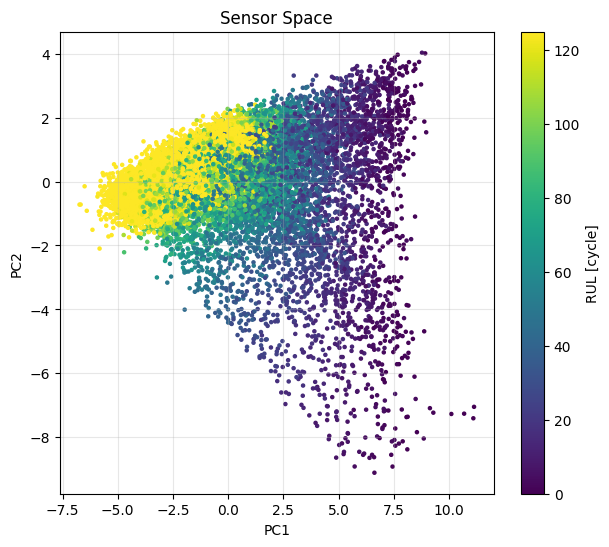

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:198: RuntimeWarning: divide by zero encountered in matmul
  y_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:198: RuntimeWarning: overflow encountered in matmul
  y_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:198: RuntimeWarning: invalid value encountered in matmul
  y_pred = Phi_val @ beta


Surface feature dimension: 6
Best lambda: 0.0
Best Validation RMSE: 18.89


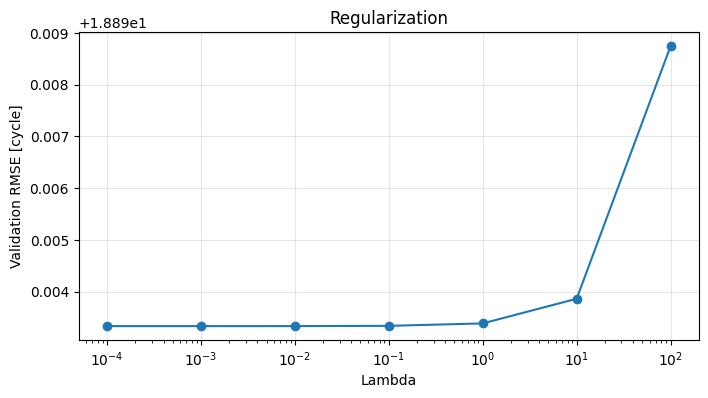

Surface coefficients:
[ 8.92531966e+01 -1.15527991e+01  1.15638006e+01 -2.40114501e-01
 -1.77999051e+00 -6.38952366e-02]
RUL = 89.253 + (-11.553) PC1 + (11.564) PC2 + (-0.240) PC1² + (-1.780) PC1·PC2 + (-0.064) PC2²
Validation RMSE: 18.89
Validation MAE: 14.98
Condition number: 2.23e+01


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:226: RuntimeWarning: divide by zero encountered in matmul
  y_val_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:226: RuntimeWarning: overflow encountered in matmul
  y_val_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:226: RuntimeWarning: invalid value encountered in matmul
  y_val_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:265: RuntimeWarning: divide by zero encountered in matmul
  RUL_surface = (Phi_surface @ beta).reshape(PC1.shape)
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:265: RuntimeWarning: overflow encountered in matmul
  RUL_surface = (Phi_surface @ beta).reshape(PC1.shape)
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:265: RuntimeWarning: invalid value encountered in mat

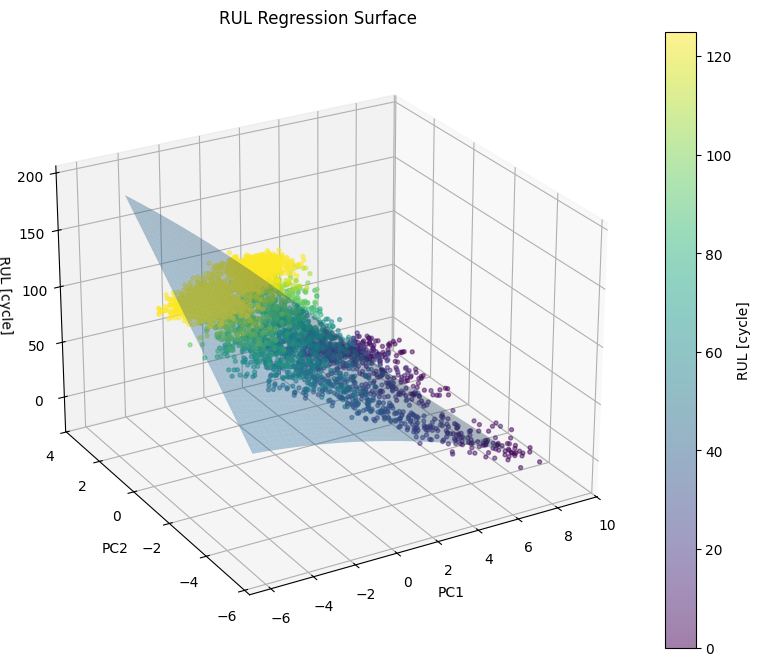

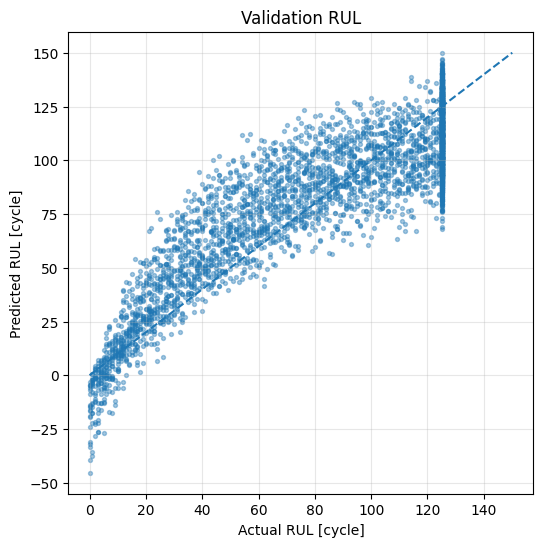

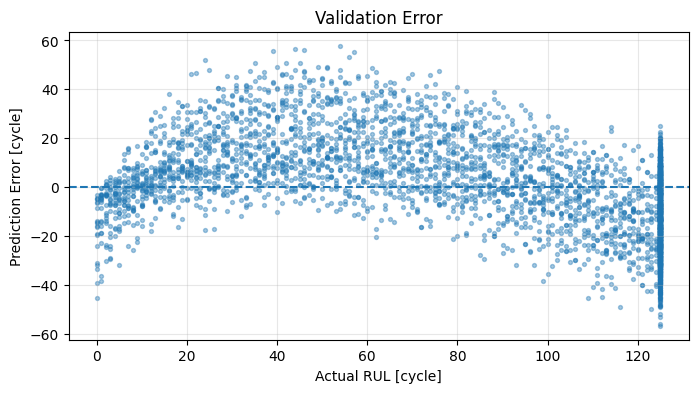

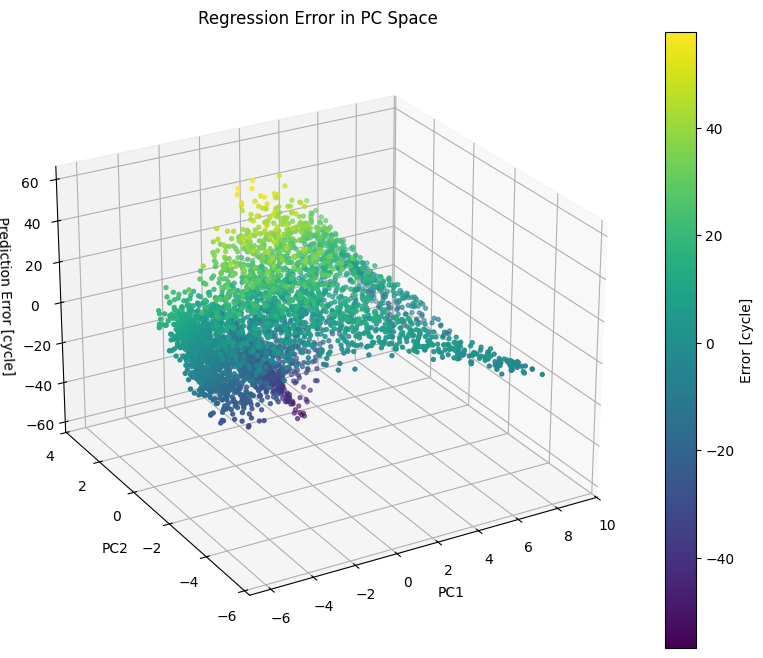

Test RMSE: 19.26
Test MAE: 14.45


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:365: RuntimeWarning: divide by zero encountered in matmul
  Z_full = X_full @ V2_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:365: RuntimeWarning: overflow encountered in matmul
  Z_full = X_full @ V2_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:365: RuntimeWarning: invalid value encountered in matmul
  Z_full = X_full @ V2_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:413: RuntimeWarning: divide by zero encountered in matmul
  RUL_surface = (Phi_surface @ beta_full).reshape(PC1.shape)
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:413: RuntimeWarning: overflow encountered in matmul
  RUL_surface = (Phi_surface @ beta_full).reshape(PC1.shape)
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/1374389029.py:413: RuntimeWarning: invalid value encountered in

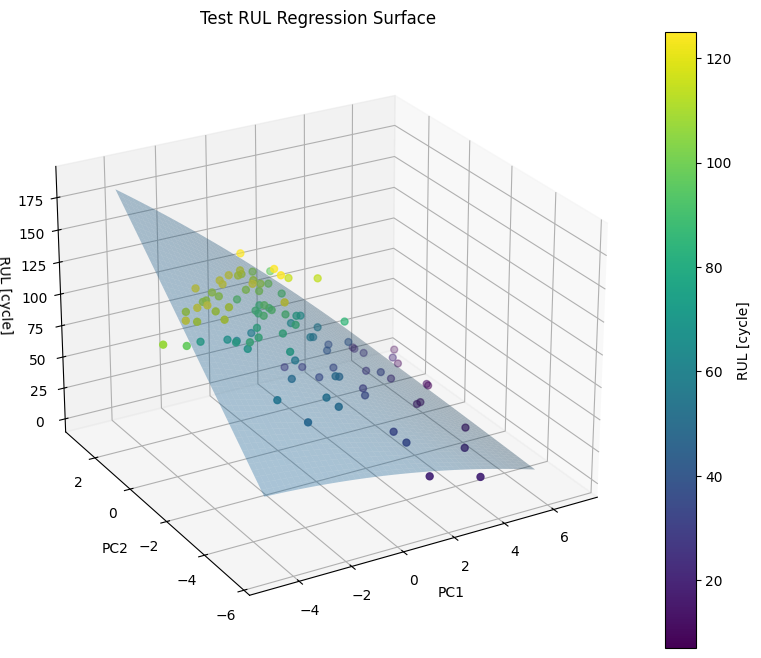

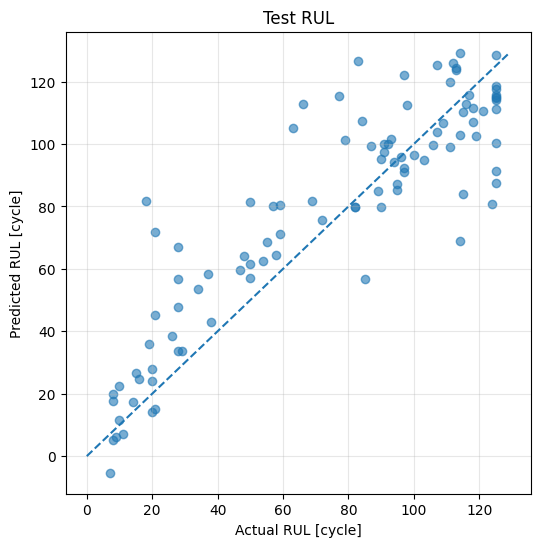

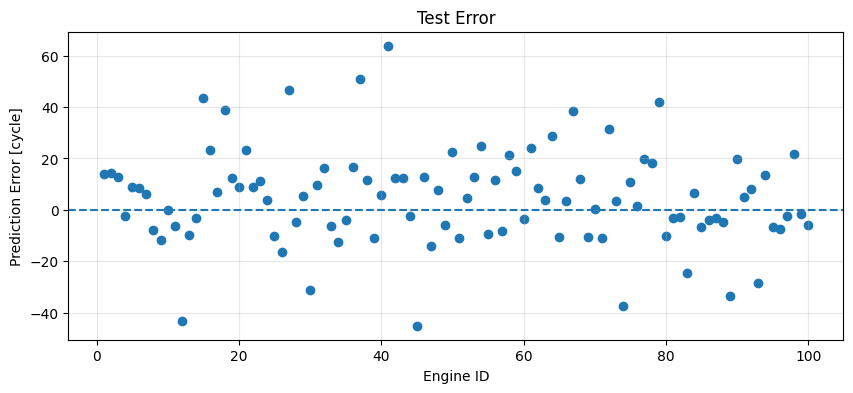

In [8]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split


# ============================================================
# RUL
# ============================================================

rul_limit = 125

train_df["RUL_raw"] = train_df.groupby("unit_id")["cycle"].transform("max") - train_df["cycle"]
train_df["RUL"] = train_df["RUL_raw"].clip(upper=rul_limit)


# ============================================================
# Train / Validation
# 같은 엔진이 Train과 Validation에 동시에 들어가지 않도록 분리
# ============================================================

unit_ids = train_df["unit_id"].unique()
train_units, val_units = train_test_split(unit_ids, test_size=0.2, random_state=42)

train_data = train_df[train_df["unit_id"].isin(train_units)].copy()
val_data = train_df[train_df["unit_id"].isin(val_units)].copy()


# ============================================================
# Sensor
# ============================================================

sensor_cols = [f"sensor_{i}" for i in range(1, 22)]

X_train_raw = train_data[sensor_cols].to_numpy(float)
X_val_raw = val_data[sensor_cols].to_numpy(float)

y_train = train_data["RUL"].to_numpy(float)
y_val = val_data["RUL"].to_numpy(float)

if not np.isfinite(X_train_raw).all() or not np.isfinite(X_val_raw).all():
    raise ValueError("Sensor data contains NaN or Inf.")


# ============================================================
# 상수 Sensor 제거
# ============================================================

mean = X_train_raw.mean(0)
std = X_train_raw.std(0)

valid = std > 1e-8

sensor_cols = np.array(sensor_cols)[valid].tolist()

X_train_raw = X_train_raw[:, valid]
X_val_raw = X_val_raw[:, valid]

mean = mean[valid]
std = std[valid]

print("Selected sensors:", sensor_cols)
print("Sensor dimension:", len(sensor_cols))


# ============================================================
# Standardization
# ============================================================

X_train = (X_train_raw - mean) / std
X_val = (X_val_raw - mean) / std

if not np.isfinite(X_train).all() or not np.isfinite(X_val).all():
    raise ValueError("Normalization produced NaN or Inf.")


# ============================================================
# SVD
#
# X = U Σ V^T
# ============================================================

_, S, Vt = np.linalg.svd(X_train, full_matrices=False)


# ============================================================
# Singular Values
# ============================================================

plt.figure(figsize=(8, 4))
plt.plot(S, "o-")
plt.xlabel("Component")
plt.ylabel("Singular Value")
plt.title("Singular Values")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Explained Variance
# ============================================================

explained_variance = S ** 2 / np.sum(S ** 2)
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 4))
plt.plot(range(1, len(S) + 1), cumulative_variance, "o-")
plt.axhline(0.95, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance")
plt.title("Explained Variance")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# PC1, PC2
# ============================================================

V2 = Vt[:2].T

Z_train = X_train @ V2
Z_val = X_val @ V2

print("Original dimension:", X_train.shape[1])
print("Reduced dimension:", Z_train.shape[1])


# ============================================================
# Sensor Space
# ============================================================

plt.figure(figsize=(7, 6))
scatter = plt.scatter(Z_train[:, 0], Z_train[:, 1], c=y_train, s=5)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Sensor Space")
plt.colorbar(scatter, label="RUL [cycle]")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Quadratic Surface
#
# [1, PC1, PC2, PC1², PC1*PC2, PC2²]
# ============================================================

def quadratic_features(Z):
    x = Z[:, 0]
    y = Z[:, 1]

    return np.column_stack([np.ones(len(Z)), x, y, x ** 2, x * y, y ** 2])


Phi_train = quadratic_features(Z_train)
Phi_val = quadratic_features(Z_val)

print("Surface feature dimension:", Phi_train.shape[1])


# ============================================================
# Tikhonov Regularization
#
# min ||Phi beta - y||² + lambda ||L beta||²
# ============================================================

def tikhonov(Phi, y, lam):
    L = np.eye(Phi.shape[1])
    L[0, 0] = 0

    A = np.vstack([Phi, np.sqrt(lam) * L])
    b = np.concatenate([y, np.zeros(Phi.shape[1])])

    beta, _, _, _ = np.linalg.lstsq(A, b, rcond=None)

    return beta


def rmse(y, y_pred):
    return np.sqrt(np.mean((y - y_pred) ** 2))


def mae(y, y_pred):
    return np.mean(np.abs(y - y_pred))


# ============================================================
# Lambda 선택
# ============================================================

lambda_grid = [0.0, 1e-4, 1e-3, 1e-2, 1e-1, 1.0, 10.0, 100.0]

val_errors = []

for lam in lambda_grid:
    beta = tikhonov(Phi_train, y_train, lam)
    y_pred = Phi_val @ beta
    val_errors.append(rmse(y_val, y_pred))

best_index = np.argmin(val_errors)
best_lambda = lambda_grid[best_index]

print("Best lambda:", best_lambda)
print(f"Best Validation RMSE: {val_errors[best_index]:.2f}")


# ============================================================
# Lambda 비교
# ============================================================

plt.figure(figsize=(8, 4))
plt.semilogx(lambda_grid[1:], val_errors[1:], "o-")
plt.xlabel("Lambda")
plt.ylabel("Validation RMSE [cycle]")
plt.title("Regularization")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# 최종 Validation Model
# ============================================================

beta = tikhonov(Phi_train, y_train, best_lambda)
y_val_pred = Phi_val @ beta

print("Surface coefficients:")
print(beta)

print(
    f"RUL = {beta[0]:.3f}"
    f" + ({beta[1]:.3f}) PC1"
    f" + ({beta[2]:.3f}) PC2"
    f" + ({beta[3]:.3f}) PC1²"
    f" + ({beta[4]:.3f}) PC1·PC2"
    f" + ({beta[5]:.3f}) PC2²"
)

print(f"Validation RMSE: {rmse(y_val, y_val_pred):.2f}")
print(f"Validation MAE: {mae(y_val, y_val_pred):.2f}")


# ============================================================
# Condition Number
# ============================================================

surface_singular_values = np.linalg.svd(Phi_train, compute_uv=False)
condition_number = surface_singular_values[0] / surface_singular_values[-1]

print(f"Condition number: {condition_number:.2e}")


# ============================================================
# Validation Regression Surface
# ============================================================

pc1 = np.linspace(np.percentile(Z_val[:, 0], 1), np.percentile(Z_val[:, 0], 99), 50)
pc2 = np.linspace(np.percentile(Z_val[:, 1], 1), np.percentile(Z_val[:, 1], 99), 50)

PC1, PC2 = np.meshgrid(pc1, pc2)

surface_points = np.column_stack([PC1.ravel(), PC2.ravel()])
Phi_surface = quadratic_features(surface_points)
RUL_surface = (Phi_surface @ beta).reshape(PC1.shape)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(Z_val[:, 0], Z_val[:, 1], y_val, c=y_val, s=8, alpha=0.5)
ax.plot_surface(PC1, PC2, RUL_surface, alpha=0.35)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("RUL [cycle]")
ax.set_title("RUL Regression Surface")

ax.view_init(25, -120)

fig.colorbar(scatter, ax=ax, label="RUL [cycle]")

plt.show()


# ============================================================
# Validation Actual vs Predicted
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_val, y_val_pred, s=8, alpha=0.4)

limit = max(y_val.max(), y_val_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Validation RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Validation Error
# ============================================================

val_error = y_val_pred - y_val

plt.figure(figsize=(8, 4))
plt.scatter(y_val, val_error, s=8, alpha=0.4)
plt.axhline(0, linestyle="--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Prediction Error [cycle]")
plt.title("Validation Error")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Error in PC Space
# ============================================================

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(Z_val[:, 0], Z_val[:, 1], val_error, c=val_error, s=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("Prediction Error [cycle]")
ax.set_title("Regression Error in PC Space")

ax.view_init(25, -120)

fig.colorbar(scatter, ax=ax, label="Error [cycle]")

plt.show()


# ============================================================
# 전체 Train 데이터로 최종 모델 재학습
# ============================================================

X_full_raw = train_df[sensor_cols].to_numpy(float)
y_full = train_df["RUL"].to_numpy(float)

full_mean = X_full_raw.mean(0)
full_std = X_full_raw.std(0)

if np.any(full_std <= 1e-8):
    raise ValueError("A selected sensor has zero variance.")

X_full = (X_full_raw - full_mean) / full_std

if not np.isfinite(X_full).all():
    raise ValueError("Full training data contains NaN or Inf.")


# ============================================================
# 전체 Train SVD
# ============================================================

_, _, Vt_full = np.linalg.svd(X_full, full_matrices=False)

V2_full = Vt_full[:2].T
Z_full = X_full @ V2_full

Phi_full = quadratic_features(Z_full)

beta_full = tikhonov(Phi_full, y_full, best_lambda)


# ============================================================
# Test
# 각 엔진의 마지막 상태 사용
# ============================================================

test_last = test_df.groupby("unit_id").tail(1).sort_values("unit_id")

X_test = test_last[sensor_cols].to_numpy(float)
X_test = (X_test - full_mean) / full_std

if not np.isfinite(X_test).all():
    raise ValueError("Test data contains NaN or Inf.")

Z_test = X_test @ V2_full
Phi_test = quadratic_features(Z_test)

y_test_raw = rul_df["RUL"].to_numpy(float)
y_test = np.minimum(y_test_raw, rul_limit)

y_test_pred = Phi_test @ beta_full


# ============================================================
# Test Evaluation
# ============================================================

print(f"Test RMSE: {rmse(y_test, y_test_pred):.2f}")
print(f"Test MAE: {mae(y_test, y_test_pred):.2f}")


# ============================================================
# Test Regression Surface
# ============================================================

pc1 = np.linspace(np.percentile(Z_test[:, 0], 1), np.percentile(Z_test[:, 0], 99), 50)
pc2 = np.linspace(np.percentile(Z_test[:, 1], 1), np.percentile(Z_test[:, 1], 99), 50)

PC1, PC2 = np.meshgrid(pc1, pc2)

surface_points = np.column_stack([PC1.ravel(), PC2.ravel()])
Phi_surface = quadratic_features(surface_points)
RUL_surface = (Phi_surface @ beta_full).reshape(PC1.shape)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(Z_test[:, 0], Z_test[:, 1], y_test, c=y_test, s=25)
ax.plot_surface(PC1, PC2, RUL_surface, alpha=0.35)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("RUL [cycle]")
ax.set_title("Test RUL Regression Surface")

ax.view_init(25, -120)

fig.colorbar(scatter, ax=ax, label="RUL [cycle]")

plt.show()


# ============================================================
# Test Actual vs Predicted
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6)

limit = max(y_test.max(), y_test_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Test RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Test Error
# ============================================================

engine_ids = test_last["unit_id"].to_numpy()
test_error = y_test_pred - y_test

plt.figure(figsize=(10, 4))
plt.scatter(engine_ids, test_error)
plt.axhline(0, linestyle="--")
plt.xlabel("Engine ID")
plt.ylabel("Prediction Error [cycle]")
plt.title("Test Error")
plt.grid(alpha=0.3)
plt.show()

## 변경된 부분

### 1. 단일 시점 Sensor에서 Delay Embedding으로 변경

기존에는 한 cycle의 센서값을 이용해 RUL을 예측했지만, 이번에는 **최근 30 cycle의 센서값을 하나의 벡터로 구성** 하도록 변경하였다.

$$
H_t =
[x(t-29), x(t-28), \dots, x(t)]
$$

이를 통해 현재 센서값뿐만 아니라 **시간에 따른 센서 변화 패턴** 까지 RUL 예측에 활용할 수 있도록 하였다.

### 2. SVD를 Temporal Sensor Space에 적용

기존에는 현재 시점의 센서 데이터에 SVD를 적용했지만, 변경된 코드에서는 최근 30 cycle을 포함하는 Delay Matrix에 SVD를 적용한다.

$$
H = U\Sigma V^T
$$

따라서 각 Principal Component는 단순한 센서 간 관계가 아니라 **센서의 시간적 변화 패턴을 압축한 Temporal Component** 를 의미한다.

### 3. Quadratic Surface와 Tikhonov Regularization 제거

기존에는 PC1, PC2에 Quadratic Feature를 추가하고 Tikhonov Regularization을 사용하였다.

이번에는 이를 제거하고 **Truncated SVD Regression** 을 사용하도록 변경하였다.

$$
\beta = V_k\Sigma_k^{-1}U_k^Ty
$$

즉, 작은 Singular Value에 해당하는 불안정한 성분을 제거하고 주요 Temporal Component만 이용하여 RUL을 예측한다.

### 4. Temporal Component 개수 선택

사용할 Component 수 $k$는 Explained Variance가 아니라 **Validation RMSE가 가장 작은 값** 으로 선택한다.

이를 통해 데이터 자체를 가장 잘 복원하는 성분보다 실제 RUL 예측에 유용한 Temporal Component를 선택하도록 하였다.

### 5. Temporal State Space 및 Temporal Mode 추가

최근 30 cycle의 상태를 첫 번째와 두 번째 Temporal Component로 투영하여 Temporal State Space를 확인하도록 변경하였다.

또한 각 Temporal Mode를

$$
30\ cycle \times Sensor
$$

형태로 다시 변환하여, 특정 센서와 특정 시점이 각 Component에 얼마나 영향을 주는지 확인할 수 있도록 하였다.

### 6. Test 데이터도 최근 30 cycle 사용

기존에는 각 엔진의 마지막 한 시점만 사용했지만, 이번에는 **각 엔진의 마지막 30 cycle** 을 이용해 RUL을 예측한다.

30 cycle보다 짧은 엔진은 초기 센서값을 반복하여 Padding한 뒤 동일한 크기의 입력을 생성한다.

### 7. RUL 예측값 범위 제한 결과 추가

선형 회귀 특성상 예측 RUL이 0보다 작거나 125보다 크게 나올 수 있기 때문에 별도로 다음 범위를 적용한 결과도 비교하도록 추가하였다.

$$
\hat{RUL}_{clipped}
=
\min(\max(\hat{RUL},0),125)
$$

이를 통해 물리적으로 의미 없는 RUL 예측값을 제한했을 때의 RMSE와 MAE도 함께 확인한다.


Selected sensors: ['sensor_2', 'sensor_3', 'sensor_4', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_17', 'sensor_20', 'sensor_21']
Sensor dimension: 15
Train delay matrix: (14241, 450)
Validation delay matrix: (3490, 450)
U shape: (14241, 450)
S shape: (450,)
Vt shape: (450, 450)


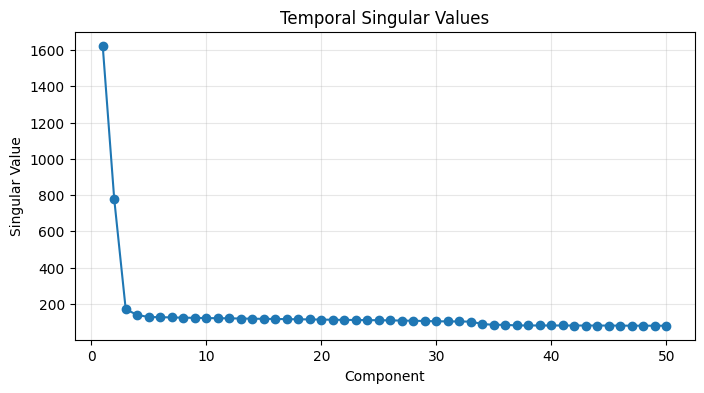

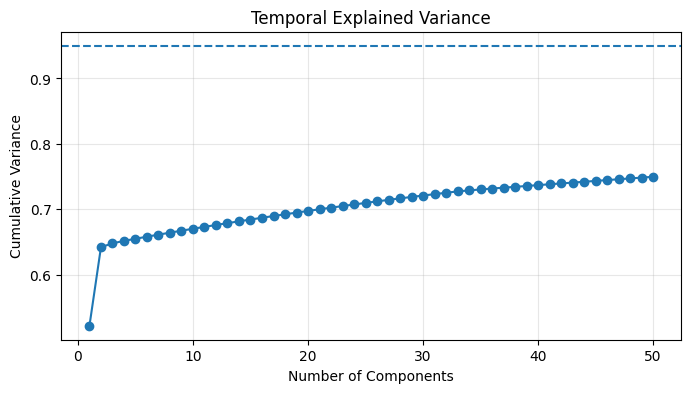

Matrix rank: 450
Best k: 50
Best Validation RMSE: 15.73


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:215: RuntimeWarning: divide by zero encountered in matmul
  y_pred = H_val_centered @ beta + y_mean
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:215: RuntimeWarning: overflow encountered in matmul
  y_pred = H_val_centered @ beta + y_mean
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:215: RuntimeWarning: invalid value encountered in matmul
  y_pred = H_val_centered @ beta + y_mean
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:188: RuntimeWarning: divide by zero encountered in matmul
  beta = Vt[:k].T @ coefficients
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:188: RuntimeWarning: overflow encountered in matmul
  beta = Vt[:k].T @ coefficients
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:188: RuntimeWarning: invalid value encountered in matmul
  beta

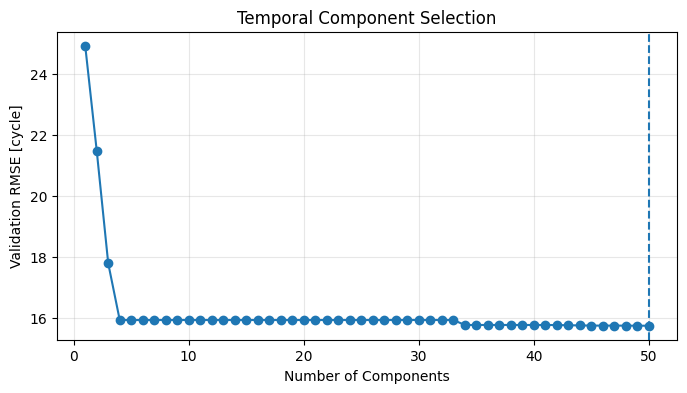

Validation RMSE: 15.73
Validation MAE: 13.01


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:246: RuntimeWarning: divide by zero encountered in matmul
  y_val_pred = H_val_centered @ beta + y_mean
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:246: RuntimeWarning: overflow encountered in matmul
  y_val_pred = H_val_centered @ beta + y_mean
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:246: RuntimeWarning: invalid value encountered in matmul
  y_val_pred = H_val_centered @ beta + y_mean


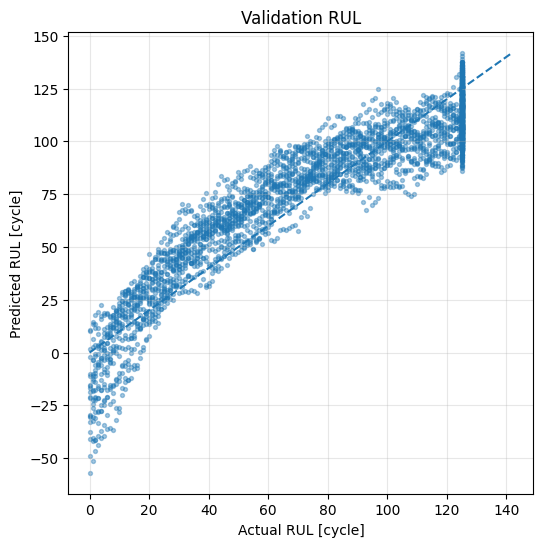

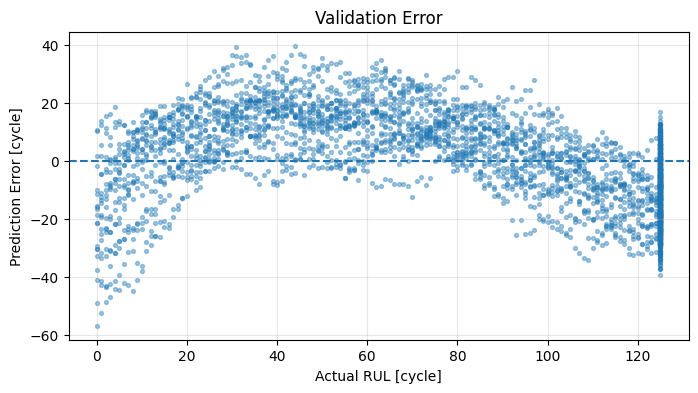

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:291: RuntimeWarning: divide by zero encountered in matmul
  Z_train = H_train_centered @ Vt[:2].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:291: RuntimeWarning: overflow encountered in matmul
  Z_train = H_train_centered @ Vt[:2].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:291: RuntimeWarning: invalid value encountered in matmul
  Z_train = H_train_centered @ Vt[:2].T


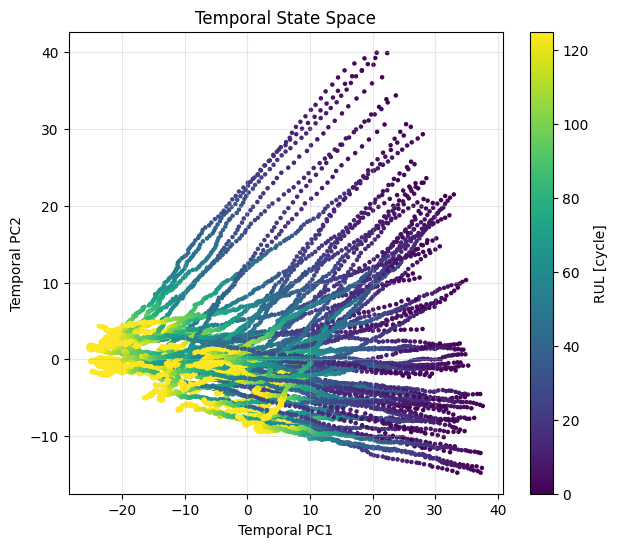

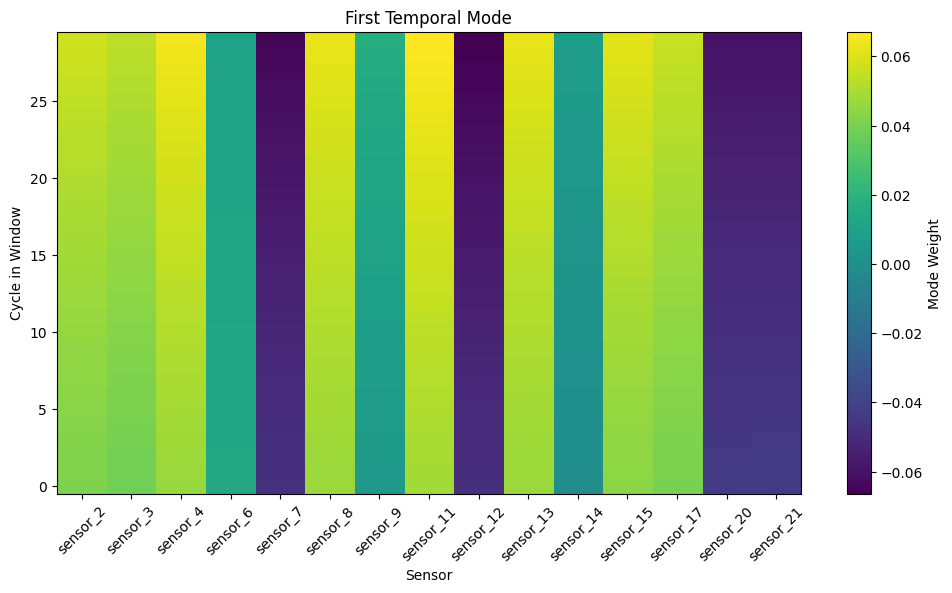

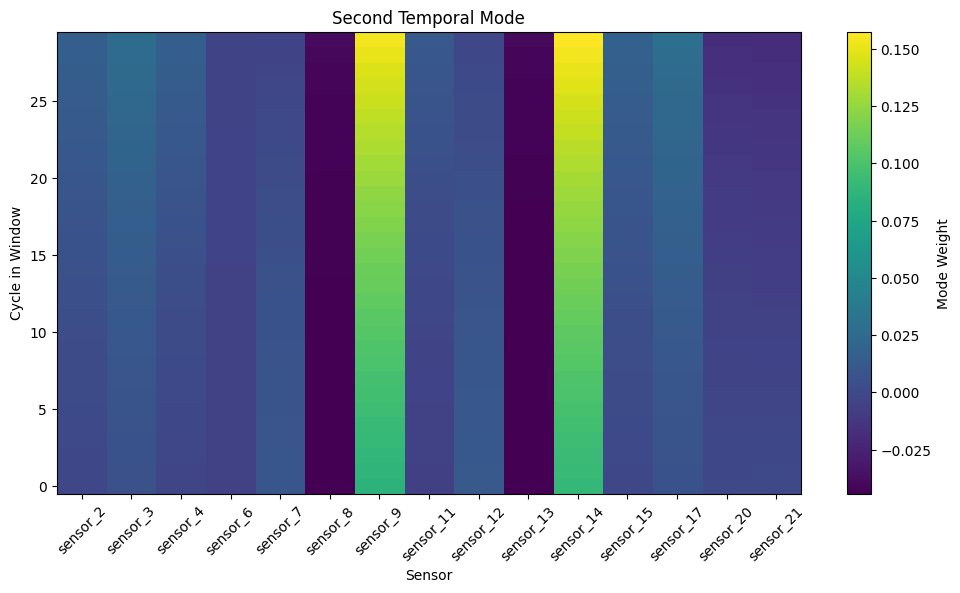

Test delay matrix: (100, 450)
Test RMSE: 16.32
Test MAE: 13.35
Clipped Test RMSE: 15.17
Clipped Test MAE: 12.33


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:187: RuntimeWarning: divide by zero encountered in matmul
  coefficients = (U[:, :k].T @ y_centered) / S[:k]
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:187: RuntimeWarning: overflow encountered in matmul
  coefficients = (U[:, :k].T @ y_centered) / S[:k]
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:187: RuntimeWarning: invalid value encountered in matmul
  coefficients = (U[:, :k].T @ y_centered) / S[:k]
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:188: RuntimeWarning: divide by zero encountered in matmul
  beta = Vt[:k].T @ coefficients
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:188: RuntimeWarning: overflow encountered in matmul
  beta = Vt[:k].T @ coefficients
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2734912565.py:188: RuntimeWarning: invalid value e

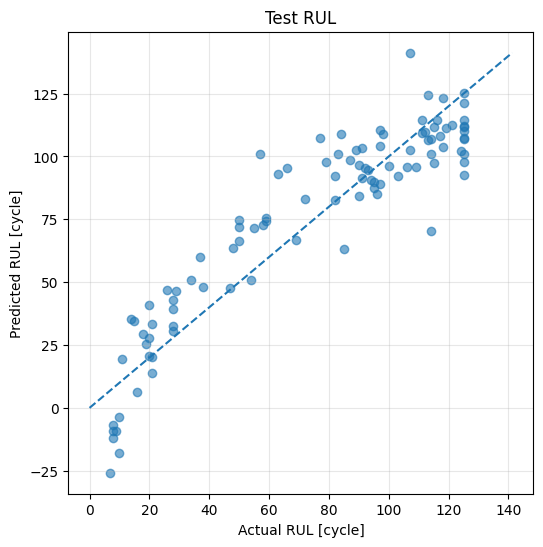

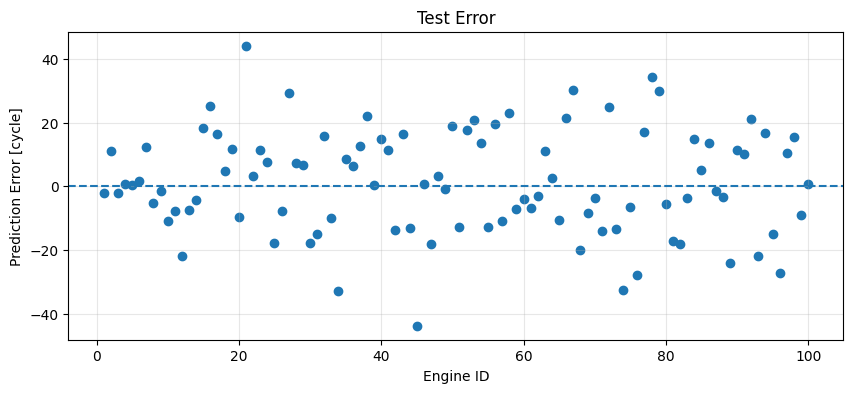

In [10]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split


# ============================================================
# 설정
# ============================================================

seq_len = 30
rul_limit = 125


# ============================================================
# RUL 생성
# ============================================================

train_df["RUL_raw"] = train_df.groupby("unit_id")["cycle"].transform("max") - train_df["cycle"]
train_df["RUL"] = train_df["RUL_raw"].clip(upper=rul_limit)


# ============================================================
# Train / Validation 분리
# 같은 엔진이 두 데이터셋에 동시에 들어가지 않도록 unit_id 기준 분리
# ============================================================

unit_ids = train_df["unit_id"].unique()
train_units, val_units = train_test_split(unit_ids, test_size=0.2, random_state=42)

train_data = train_df[train_df["unit_id"].isin(train_units)].copy()
val_data = train_df[train_df["unit_id"].isin(val_units)].copy()


# ============================================================
# Sensor 선택
# ============================================================

sensor_cols = [f"sensor_{i}" for i in range(1, 22)]

X_train_raw = train_data[sensor_cols].to_numpy(float)

if not np.isfinite(X_train_raw).all():
    raise ValueError("Sensor data contains NaN or Inf.")


# ============================================================
# 상수에 가까운 Sensor 제거
# ============================================================

mean = X_train_raw.mean(0)
std = X_train_raw.std(0)

valid = std > 1e-8

sensor_cols = np.array(sensor_cols)[valid].tolist()

mean = mean[valid]
std = std[valid]

print("Selected sensors:", sensor_cols)
print("Sensor dimension:", len(sensor_cols))


# ============================================================
# 정규화
# ============================================================

def normalize_data(df, sensors, mean, std):
    data = df.copy()
    data.loc[:, sensors] = (data[sensors].to_numpy(float) - mean) / std

    return data


train_data[sensor_cols] = (
    train_data[sensor_cols].astype(float) - mean
) / std

val_data[sensor_cols] = (
    val_data[sensor_cols].astype(float) - mean
) / std


# ============================================================
# Delay Embedding
#
# 최근 30 cycle을 하나의 벡터로 생성
#
# [x(t-29), x(t-28), ..., x(t)]
# ============================================================

def make_delay_matrix(df, sensors, seq_len):
    H = []
    y = []

    for unit_id in sorted(df["unit_id"].unique()):
        engine = df[df["unit_id"] == unit_id].sort_values("cycle")

        values = engine[sensors].to_numpy(float)
        rul = engine["RUL"].to_numpy(float)

        for i in range(seq_len - 1, len(engine)):
            window = values[i - seq_len + 1:i + 1]

            H.append(window.reshape(-1))
            y.append(rul[i])

    return np.array(H), np.array(y)


H_train, y_train = make_delay_matrix(train_data, sensor_cols, seq_len)
H_val, y_val = make_delay_matrix(val_data, sensor_cols, seq_len)

print("Train delay matrix:", H_train.shape)
print("Validation delay matrix:", H_val.shape)


# ============================================================
# Delay Matrix Centering
# ============================================================

H_mean = H_train.mean(0)

H_train_centered = H_train - H_mean
H_val_centered = H_val - H_mean

if not np.isfinite(H_train_centered).all() or not np.isfinite(H_val_centered).all():
    raise ValueError("Delay matrix contains NaN or Inf.")


# ============================================================
# SVD
#
# H = U Σ V^T
# ============================================================

U, S, Vt = np.linalg.svd(H_train_centered, full_matrices=False)

print("U shape:", U.shape)
print("S shape:", S.shape)
print("Vt shape:", Vt.shape)


# ============================================================
# Singular Values
# ============================================================

n_plot = min(50, len(S))

plt.figure(figsize=(8, 4))
plt.plot(range(1, n_plot + 1), S[:n_plot], "o-")
plt.xlabel("Component")
plt.ylabel("Singular Value")
plt.title("Temporal Singular Values")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Explained Variance
# ============================================================

explained_variance = S ** 2 / np.sum(S ** 2)
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 4))
plt.plot(range(1, n_plot + 1), cumulative_variance[:n_plot], "o-")
plt.axhline(0.95, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance")
plt.title("Temporal Explained Variance")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Truncated SVD Regression
#
# beta = V_k Σ_k^-1 U_k^T y
# ============================================================

def tsvd_regression(U, S, Vt, y, k):
    y_mean = y.mean()
    y_centered = y - y_mean

    coefficients = (U[:, :k].T @ y_centered) / S[:k]
    beta = Vt[:k].T @ coefficients

    return beta, y_mean


def rmse(y, y_pred):
    return np.sqrt(np.mean((y - y_pred) ** 2))


def mae(y, y_pred):
    return np.mean(np.abs(y - y_pred))


# ============================================================
# 사용할 Temporal Component 개수 선택
#
# Explained Variance가 아니라 Validation RMSE로 결정
# ============================================================

rank = np.sum(S > S[0] * 1e-10)
max_k = min(50, rank)

k_values = range(1, max_k + 1)
val_errors = []

for k in k_values:
    beta, y_mean = tsvd_regression(U, S, Vt, y_train, k)
    y_pred = H_val_centered @ beta + y_mean

    val_errors.append(rmse(y_val, y_pred))

best_k = np.argmin(val_errors) + 1

print("Matrix rank:", rank)
print("Best k:", best_k)
print(f"Best Validation RMSE: {val_errors[best_k - 1]:.2f}")


# ============================================================
# Component Selection
# ============================================================

plt.figure(figsize=(8, 4))
plt.plot(k_values, val_errors, "o-")
plt.axvline(best_k, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Validation RMSE [cycle]")
plt.title("Temporal Component Selection")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Validation Prediction
# ============================================================

beta, y_mean = tsvd_regression(U, S, Vt, y_train, best_k)

y_val_pred = H_val_centered @ beta + y_mean

print(f"Validation RMSE: {rmse(y_val, y_val_pred):.2f}")
print(f"Validation MAE: {mae(y_val, y_val_pred):.2f}")


# ============================================================
# Validation RUL
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_val, y_val_pred, s=8, alpha=0.4)

limit = max(y_val.max(), y_val_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Validation RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Validation Error
# ============================================================

val_error = y_val_pred - y_val

plt.figure(figsize=(8, 4))
plt.scatter(y_val, val_error, s=8, alpha=0.4)
plt.axhline(0, linestyle="--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Prediction Error [cycle]")
plt.title("Validation Error")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Temporal State Space
#
# 기존 PCA와 달리 최근 30 cycle 전체의 상태를 압축한 공간
# ============================================================

Z_train = H_train_centered @ Vt[:2].T

plt.figure(figsize=(7, 6))
scatter = plt.scatter(Z_train[:, 0], Z_train[:, 1], c=y_train, s=5)

plt.xlabel("Temporal PC1")
plt.ylabel("Temporal PC2")
plt.title("Temporal State Space")
plt.colorbar(scatter, label="RUL [cycle]")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# 첫 번째 Temporal Mode
#
# 세로축: 30 cycle
# 가로축: sensor
# ============================================================

mode_1 = Vt[0].reshape(seq_len, len(sensor_cols))

plt.figure(figsize=(12, 6))
plt.imshow(mode_1, aspect="auto", origin="lower")
plt.xlabel("Sensor")
plt.ylabel("Cycle in Window")
plt.title("First Temporal Mode")
plt.xticks(range(len(sensor_cols)), sensor_cols, rotation=45)
plt.colorbar(label="Mode Weight")
plt.show()


# ============================================================
# 두 번째 Temporal Mode
# ============================================================

mode_2 = Vt[1].reshape(seq_len, len(sensor_cols))

plt.figure(figsize=(12, 6))
plt.imshow(mode_2, aspect="auto", origin="lower")
plt.xlabel("Sensor")
plt.ylabel("Cycle in Window")
plt.title("Second Temporal Mode")
plt.xticks(range(len(sensor_cols)), sensor_cols, rotation=45)
plt.colorbar(label="Mode Weight")
plt.show()


# ============================================================
# 전체 Train 데이터로 최종 모델 재학습
# ============================================================

X_full_raw = train_df[sensor_cols].to_numpy(float)

full_mean = X_full_raw.mean(0)
full_std = X_full_raw.std(0)

if np.any(full_std <= 1e-8):
    raise ValueError("A selected sensor has zero variance.")

full_data = train_df.copy()

full_data[sensor_cols] = (
    full_data[sensor_cols].astype(float) - full_mean
) / full_std

# ============================================================
# 전체 Train Delay Matrix
# ============================================================

H_full, y_full = make_delay_matrix(full_data, sensor_cols, seq_len)

H_full_mean = H_full.mean(0)
H_full_centered = H_full - H_full_mean

if not np.isfinite(H_full_centered).all():
    raise ValueError("Full delay matrix contains NaN or Inf.")


# ============================================================
# 전체 Train SVD
# ============================================================

U_full, S_full, Vt_full = np.linalg.svd(H_full_centered, full_matrices=False)

beta_full, y_full_mean = tsvd_regression(U_full, S_full, Vt_full, y_full, best_k)


# ============================================================
# Test Delay Matrix
#
# Test에서는 각 엔진의 마지막 30 cycle만 사용
# ============================================================

def make_test_delay_matrix(df, sensors, mean, std, seq_len):
    H = []
    engine_ids = []

    for unit_id in sorted(df["unit_id"].unique()):
        engine = df[df["unit_id"] == unit_id].sort_values("cycle")

        values = engine[sensors].to_numpy(float)
        values = (values - mean) / std

        if len(values) < seq_len:
            padding = np.repeat(values[:1], seq_len - len(values), axis=0)
            window = np.vstack([padding, values])
        else:
            window = values[-seq_len:]

        H.append(window.reshape(-1))
        engine_ids.append(unit_id)

    return np.array(H), np.array(engine_ids)


H_test, engine_ids = make_test_delay_matrix(test_df, sensor_cols, full_mean, full_std, seq_len)

H_test_centered = H_test - H_full_mean

if not np.isfinite(H_test_centered).all():
    raise ValueError("Test delay matrix contains NaN or Inf.")

print("Test delay matrix:", H_test.shape)


# ============================================================
# Test Prediction
# ============================================================

y_test_raw = rul_df["RUL"].to_numpy(float)
y_test = np.minimum(y_test_raw, rul_limit)

y_test_pred = H_test_centered @ beta_full + y_full_mean

print(f"Test RMSE: {rmse(y_test, y_test_pred):.2f}")
print(f"Test MAE: {mae(y_test, y_test_pred):.2f}")


# ============================================================
# 물리적 RUL 범위 적용 결과
# 원본 결과와 별도로 비교
# ============================================================

y_test_pred_clipped = np.clip(y_test_pred, 0, rul_limit)

print(f"Clipped Test RMSE: {rmse(y_test, y_test_pred_clipped):.2f}")
print(f"Clipped Test MAE: {mae(y_test, y_test_pred_clipped):.2f}")


# ============================================================
# Test RUL
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6)

limit = max(y_test.max(), y_test_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Test RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Test Error
# ============================================================

test_error = y_test_pred - y_test

plt.figure(figsize=(10, 4))
plt.scatter(engine_ids, test_error)
plt.axhline(0, linestyle="--")
plt.xlabel("Engine ID")
plt.ylabel("Prediction Error [cycle]")
plt.title("Test Error")
plt.grid(alpha=0.3)
plt.show()

## 변경된 부분

### 1. 엔진별 Initial Baseline 제거 추가

각 엔진의 초기 10 cycle 평균을 baseline으로 사용하여 센서값에서 제거하도록 변경하였다.

$$
x'(t) = x(t) - \frac{1}{10}\sum_{i=1}^{10}x(i)
$$

엔진마다 존재할 수 있는 초기 센서 offset의 영향을 줄이고, 절대적인 센서값보다 **초기 상태에서 얼마나 변화했는지** 를 강조하기 위해 추가하였다.

### 2. Delay Embedding을 Value + Difference 형태로 변경

기존에는 최근 30 cycle의 센서값 전체를 그대로 펼쳐 사용하였다.

$$
[x(t-29), \dots, x(t)]
$$

이번에는 **현재 센서값과 최근 센서 변화량** 을 결합하도록 변경하였다.

$$
H_t =
[x(t), \Delta x(t-28), \dots, \Delta x(t)]
$$

여기서

$$
\Delta x(t)=x(t)-x(t-1)
$$

이다.

이를 통해 현재 엔진의 상태와 함께 **센서가 시간에 따라 어떻게 변화하고 있는지** 를 직접 특징으로 사용할 수 있도록 하였다.

### 3. Temporal State Space에서 Raw RUL 사용

기존에는 125 cycle로 제한된 RUL을 이용해 Temporal State Space를 시각화했지만, 이번에는 원래의 Raw RUL을 사용하도록 변경하였다.

RUL을 125로 제한하면 healthy 영역의 데이터가 모두 같은 값으로 표현되기 때문에, 초기 상태에서도 시간에 따라 상태 공간이 어떻게 변화하는지 확인하기 위해 Raw RUL을 사용하였다.

### 4. 3D Temporal State Space 추가

기존의 Temporal PC1, PC2 시각화에 Temporal PC3를 추가하여 3차원 공간에서도 상태 변화를 확인하도록 변경하였다.

이를 통해 2차원 projection에서 겹쳐 보이는 엔진 상태가 세 번째 Temporal Component에서는 분리되는지 추가로 확인할 수 있다.

### 5. Temporal Mode 시각화 방식 변경

기존에는 하나의 Temporal Mode를

$$
30\ cycle \times Sensor
$$

형태로 바로 표현하였다.

이번 feature는 현재 상태와 차분으로 구성되므로 이를 분리하여,

* **Current State Weight** : 현재 각 센서의 영향
* **Temporal Difference Mode** : 과거 29 cycle 동안 센서 변화량의 영향

으로 각각 시각화하도록 변경하였다.

이를 통해 Temporal Component가 현재 센서 상태에 영향을 받는지, 시간적인 변화 패턴에 영향을 받는지를 구분해서 확인할 수 있다.

### 6. Test 데이터에도 Initial Baseline 제거 적용

Training 데이터뿐만 아니라 Test 엔진에도 각 엔진의 초기 10 cycle을 이용한 동일한 baseline 제거를 적용하도록 변경하였다.

Train과 Test에 동일한 전처리 방식을 적용하여 입력 데이터의 기준을 일관되게 유지하기 위해 추가하였다.

### 7. Clipped Prediction 결과 시각화 추가

기존에는 clipping 적용 전후의 RMSE와 MAE만 비교했지만, 이번에는 Clipped RUL과 Clipped Error도 별도로 시각화하도록 변경하였다.

$$
\hat{RUL}_{clipped}
=
\min(\max(\hat{RUL},0),125)
$$

이를 통해 RUL의 물리적 범위를 적용했을 때 예측값과 엔진별 오차가 실제로 어떻게 변하는지 직접 확인할 수 있도록 하였다.


Selected sensors: ['sensor_2', 'sensor_3', 'sensor_4', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_17', 'sensor_20', 'sensor_21']
Sensor dimension: 15
Train delay matrix: (14241, 450)
Validation delay matrix: (3490, 450)
U shape: (14241, 450)
S shape: (450,)
Vt shape: (450, 450)


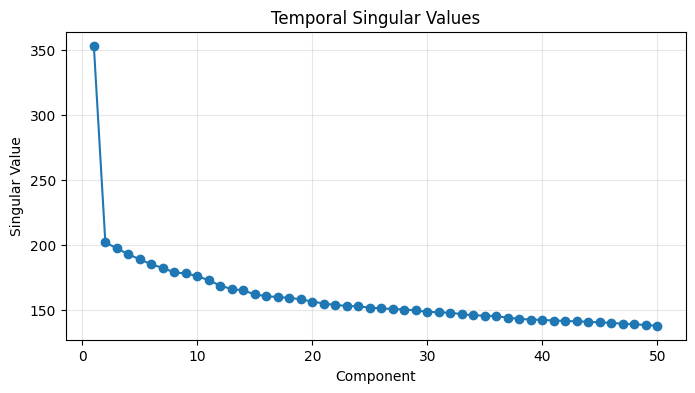

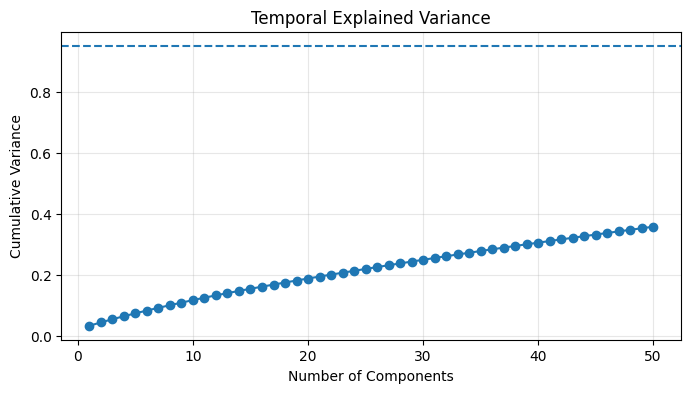

Matrix rank: 450
Best k: 50
Retained condition number: 2.57e+00
Best Validation RMSE: 20.39


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:624: RuntimeWarning: divide by zero encountered in matmul
  U[:, :max_k].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:624: RuntimeWarning: overflow encountered in matmul
  U[:, :max_k].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:624: RuntimeWarning: invalid value encountered in matmul
  U[:, :max_k].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:630: RuntimeWarning: divide by zero encountered in matmul
  H_val_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:630: RuntimeWarning: overflow encountered in matmul
  H_val_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:630: RuntimeWarning: invalid value encountered in matmul
  H_val_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:678: RuntimeWarnin

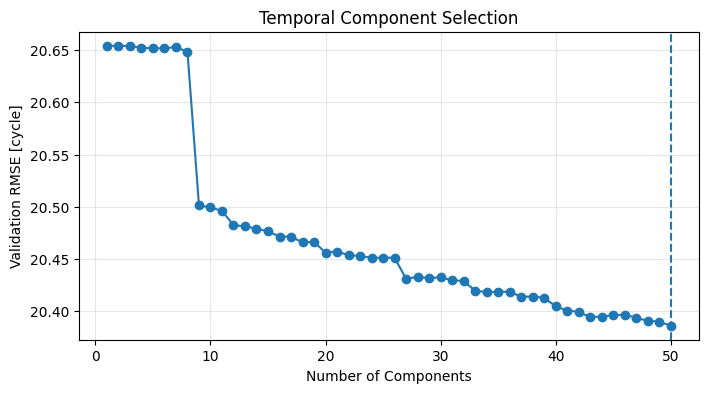

Validation RMSE: 20.39
Validation MAE: 16.93


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:765: RuntimeWarning: divide by zero encountered in matmul
  Z_val_all[:, :best_k]
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:765: RuntimeWarning: overflow encountered in matmul
  Z_val_all[:, :best_k]
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:765: RuntimeWarning: invalid value encountered in matmul
  Z_val_all[:, :best_k]


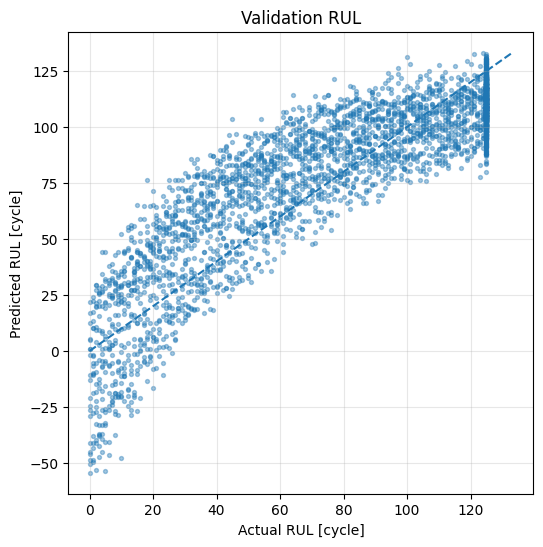

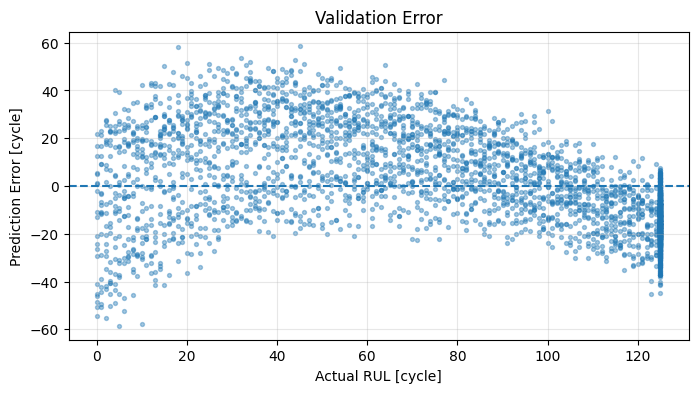

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:888: RuntimeWarning: divide by zero encountered in matmul
  H_train_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:888: RuntimeWarning: overflow encountered in matmul
  H_train_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:888: RuntimeWarning: invalid value encountered in matmul
  H_train_centered


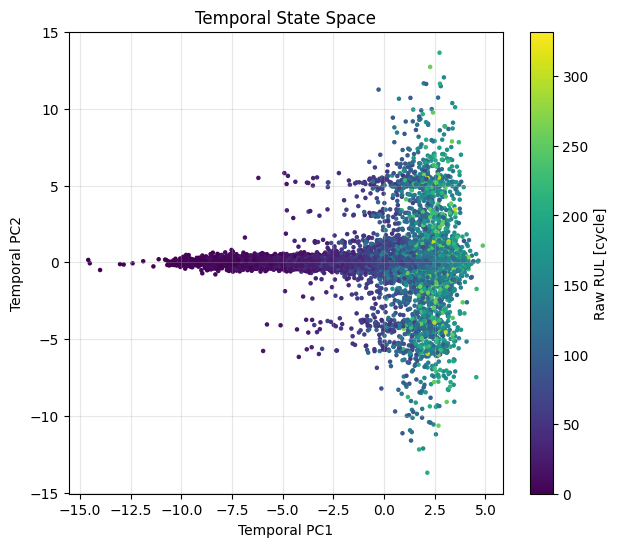

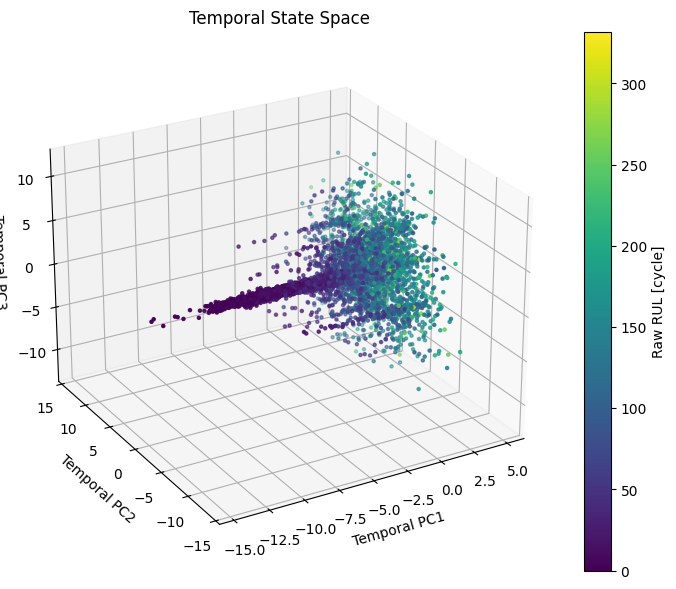

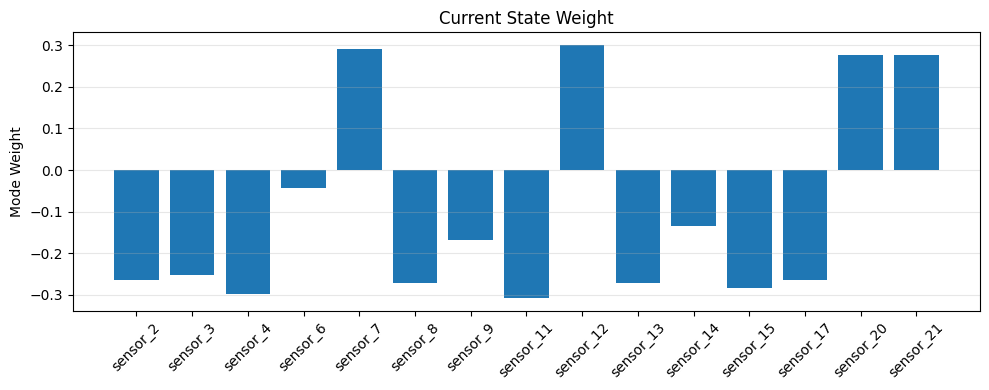

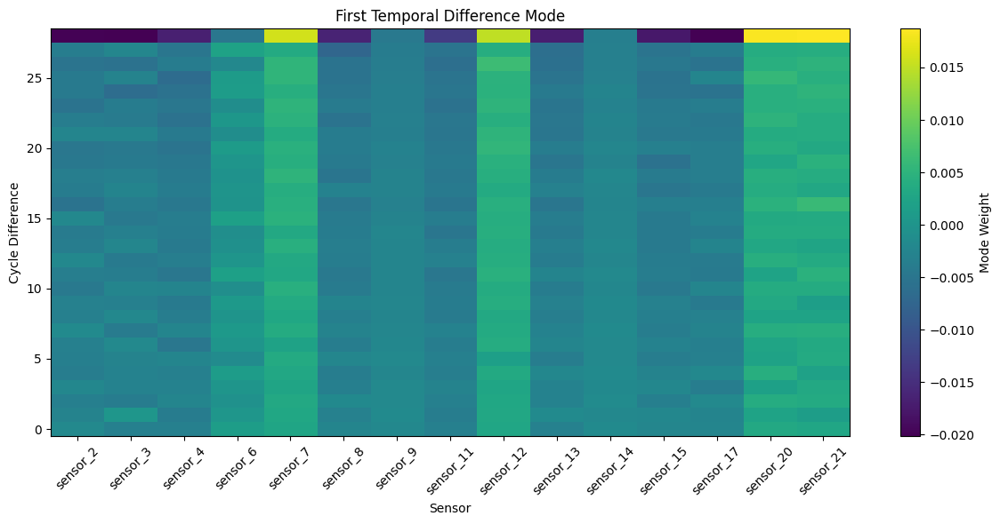

Test delay matrix: (100, 450)
Test RMSE: 18.80
Test MAE: 15.45
Clipped Test RMSE: 18.32
Clipped Test MAE: 14.97


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:1220: RuntimeWarning: divide by zero encountered in matmul
  U_full[:, :best_k].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:1220: RuntimeWarning: overflow encountered in matmul
  U_full[:, :best_k].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:1220: RuntimeWarning: invalid value encountered in matmul
  U_full[:, :best_k].T
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:1385: RuntimeWarning: divide by zero encountered in matmul
  H_test_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:1385: RuntimeWarning: overflow encountered in matmul
  H_test_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/4207621376.py:1385: RuntimeWarning: invalid value encountered in matmul
  H_test_centered
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/42076

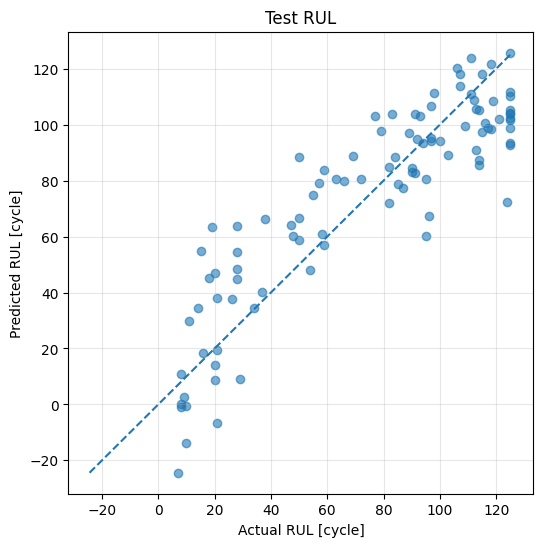

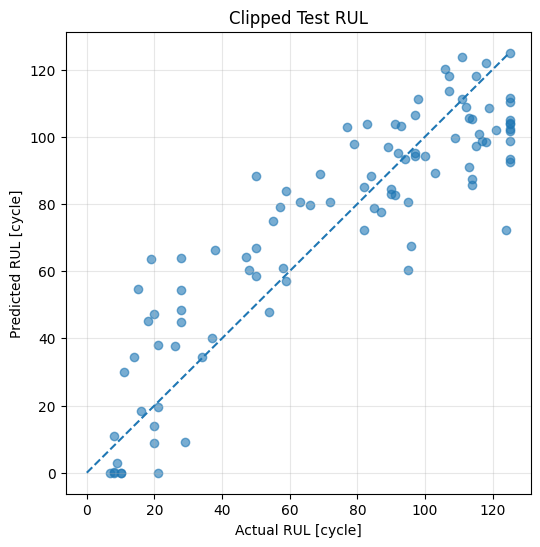

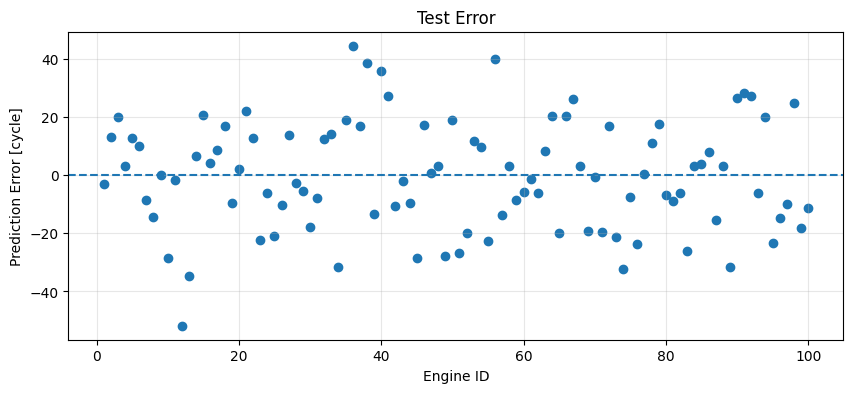

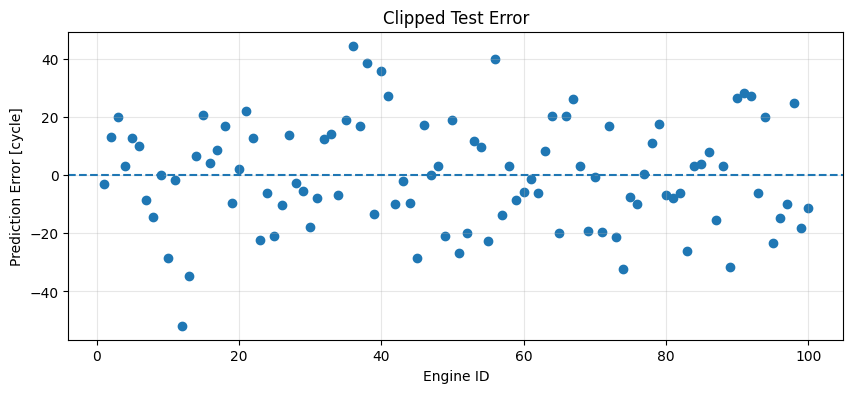

In [11]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split


# ============================================================
# 설정
# ============================================================

seq_len = 30
baseline_cycles = 10
rul_limit = 125


# ============================================================
# Sensor
# ============================================================

all_sensor_cols = [
    f"sensor_{i}"
    for i in range(1, 22)
]


# ============================================================
# Sensor dtype -> float
#
# pandas의 int64 column에 float 값을 넣을 때 발생하는
# LossySetitemError 방지
# ============================================================

train_df[all_sensor_cols] = (
    train_df[all_sensor_cols]
    .astype(np.float64)
)

test_df[all_sensor_cols] = (
    test_df[all_sensor_cols]
    .astype(np.float64)
)


# ============================================================
# RUL 생성
# ============================================================

train_df["RUL_raw"] = (
    train_df
    .groupby("unit_id")["cycle"]
    .transform("max")
    - train_df["cycle"]
)

train_df["RUL"] = (
    train_df["RUL_raw"]
    .clip(upper=rul_limit)
)


# ============================================================
# Train / Validation
#
# 같은 엔진이 두 데이터셋에 동시에 들어가지 않도록
# 엔진 단위로 분리
# ============================================================

unit_ids = train_df["unit_id"].unique()

train_units, val_units = train_test_split(
    unit_ids,
    test_size=0.2,
    random_state=42
)


train_data = (
    train_df[
        train_df["unit_id"].isin(train_units)
    ]
    .copy()
)

val_data = (
    train_df[
        train_df["unit_id"].isin(val_units)
    ]
    .copy()
)


# ============================================================
# 엔진별 Initial Baseline 제거
#
# x(t) <- x(t) - mean(x(1), ..., x(10))
#
# 엔진마다 존재하는 초기 sensor offset을 제거하고
# 초기 상태로부터 얼마나 변화했는지 강조
# ============================================================

def remove_engine_baseline(df, sensors, n):

    data = df.copy()

    # 중요:
    # baseline subtraction 결과가 float이므로
    # dataframe column도 미리 float으로 만든다.
    data[sensors] = (
        data[sensors]
        .astype(np.float64)
    )

    for unit_id in data["unit_id"].unique():

        engine = (
            data[
                data["unit_id"] == unit_id
            ]
            .sort_values("cycle")
        )

        baseline = (
            engine[sensors]
            .head(n)
            .mean(axis=0)
            .to_numpy(dtype=np.float64)
        )

        values = (
            engine[sensors]
            .to_numpy(dtype=np.float64)
        )

        corrected = (
            values
            - baseline
        )

        data.loc[
            engine.index,
            sensors
        ] = corrected

    return data


train_data = remove_engine_baseline(
    train_data,
    all_sensor_cols,
    baseline_cycles
)

val_data = remove_engine_baseline(
    val_data,
    all_sensor_cols,
    baseline_cycles
)


# ============================================================
# 상수 Sensor 제거
#
# Train 데이터에서 분산이 거의 없는 센서 제거
# ============================================================

X_train_raw = (
    train_data[all_sensor_cols]
    .to_numpy(dtype=np.float64)
)

mean = X_train_raw.mean(axis=0)
std = X_train_raw.std(axis=0)


valid = std > 1e-8


sensor_cols = (
    np.array(all_sensor_cols)[valid]
    .tolist()
)

mean = mean[valid]
std = std[valid]


print(
    "Selected sensors:",
    sensor_cols
)

print(
    "Sensor dimension:",
    len(sensor_cols)
)


# ============================================================
# Standardization
#
# Train 통계만 사용
#
# x <- (x - mean) / std
# ============================================================

def normalize_data(
    df,
    sensors,
    mean,
    std
):

    data = df.copy()

    # LossySetitemError 방지
    data[sensors] = (
        data[sensors]
        .astype(np.float64)
    )

    values = (
        data[sensors]
        .to_numpy(dtype=np.float64)
    )

    normalized = (
        values
        - mean
    ) / std

    data.loc[
        :,
        sensors
    ] = normalized

    return data


train_data = normalize_data(
    train_data,
    sensor_cols,
    mean,
    std
)

val_data = normalize_data(
    val_data,
    sensor_cols,
    mean,
    std
)


# ============================================================
# Value + Difference Delay Embedding
#
# 최근 seq_len cycle에서
#
# current state:
#
# x(t)
#
# temporal difference:
#
# Δx(t-28), ..., Δx(t)
#
# 를 하나의 벡터로 결합
#
#
# sensor가 d개,
# seq_len = 30이라면
#
# d + 29*d
#
# = 30*d dimensions
# ============================================================

def make_delay_matrix(
    df,
    sensors,
    seq_len
):

    H = []

    y = []
    y_raw = []

    units = []
    cycles = []


    for unit_id in sorted(
        df["unit_id"].unique()
    ):

        engine = (
            df[
                df["unit_id"] == unit_id
            ]
            .sort_values("cycle")
        )

        values = (
            engine[sensors]
            .to_numpy(dtype=np.float64)
        )

        rul = (
            engine["RUL"]
            .to_numpy(dtype=np.float64)
        )

        rul_raw = (
            engine["RUL_raw"]
            .to_numpy(dtype=np.float64)
        )

        cycle = (
            engine["cycle"]
            .to_numpy()
        )


        for i in range(
            seq_len - 1,
            len(engine)
        ):

            window = values[
                i - seq_len + 1:
                i + 1
            ]


            # 현재 상태
            current = window[-1]


            # 시간 차분
            delta = (
                np.diff(
                    window,
                    axis=0
                )
                .reshape(-1)
            )


            feature = np.concatenate(
                [
                    current,
                    delta
                ]
            )


            H.append(feature)

            y.append(
                rul[i]
            )

            y_raw.append(
                rul_raw[i]
            )

            units.append(
                unit_id
            )

            cycles.append(
                cycle[i]
            )


    return (
        np.asarray(
            H,
            dtype=np.float64
        ),
        np.asarray(
            y,
            dtype=np.float64
        ),
        np.asarray(
            y_raw,
            dtype=np.float64
        ),
        np.asarray(units),
        np.asarray(cycles)
    )


H_train, \
y_train, \
y_train_raw, \
unit_train, \
cycle_train = make_delay_matrix(
    train_data,
    sensor_cols,
    seq_len
)


H_val, \
y_val, \
y_val_raw, \
unit_val, \
cycle_val = make_delay_matrix(
    val_data,
    sensor_cols,
    seq_len
)


print(
    "Train delay matrix:",
    H_train.shape
)

print(
    "Validation delay matrix:",
    H_val.shape
)


# ============================================================
# Delay Matrix Centering
#
# Validation에는 Train mean만 사용
# ============================================================

H_mean = H_train.mean(
    axis=0
)


H_train_centered = (
    H_train
    - H_mean
)

H_val_centered = (
    H_val
    - H_mean
)


if not np.isfinite(
    H_train_centered
).all():

    raise ValueError(
        "Train delay matrix contains NaN or Inf."
    )


if not np.isfinite(
    H_val_centered
).all():

    raise ValueError(
        "Validation delay matrix contains NaN or Inf."
    )


# ============================================================
# SVD
#
# H = U Σ V^T
# ============================================================

U, S, Vt = np.linalg.svd(
    H_train_centered,
    full_matrices=False
)


print(
    "U shape:",
    U.shape
)

print(
    "S shape:",
    S.shape
)

print(
    "Vt shape:",
    Vt.shape
)


# ============================================================
# Singular Values
# ============================================================

n_plot = min(
    50,
    len(S)
)


plt.figure(
    figsize=(8, 4)
)

plt.plot(
    range(
        1,
        n_plot + 1
    ),
    S[:n_plot],
    "o-"
)

plt.xlabel(
    "Component"
)

plt.ylabel(
    "Singular Value"
)

plt.title(
    "Temporal Singular Values"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Explained Variance
# ============================================================

explained_variance = (
    S ** 2
    / np.sum(S ** 2)
)

cumulative_variance = (
    np.cumsum(
        explained_variance
    )
)


plt.figure(
    figsize=(8, 4)
)

plt.plot(
    range(
        1,
        n_plot + 1
    ),
    cumulative_variance[:n_plot],
    "o-"
)

plt.axhline(
    0.95,
    linestyle="--"
)

plt.xlabel(
    "Number of Components"
)

plt.ylabel(
    "Cumulative Variance"
)

plt.title(
    "Temporal Explained Variance"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Validation 성능으로 Component 수 선택
#
# H = U Σ V^T
#
# y ≈ U_k beta + mean(y)
#
# 또는
#
# y ≈ H V_k gamma + mean(y)
#
# gamma = Σ_k^-1 U_k^T y
# ============================================================

rank = np.sum(
    S > S[0] * 1e-10
)

max_k = min(
    50,
    rank
)


y_mean = y_train.mean()

y_centered = (
    y_train
    - y_mean
)


gamma = (
    U[:, :max_k].T
    @ y_centered
) / S[:max_k]


Z_val_all = (
    H_val_centered
    @ Vt[:max_k].T
)


k_values = range(
    1,
    max_k + 1
)

val_errors = []


# ============================================================
# Evaluation Functions
# ============================================================

def rmse(
    y,
    y_pred
):

    return np.sqrt(
        np.mean(
            (y - y_pred) ** 2
        )
    )


def mae(
    y,
    y_pred
):

    return np.mean(
        np.abs(
            y - y_pred
        )
    )


# ============================================================
# Component Search
# ============================================================

for k in k_values:

    y_pred = (
        Z_val_all[:, :k]
        @ gamma[:k]
        + y_mean
    )

    error = rmse(
        y_val,
        y_pred
    )

    val_errors.append(
        error
    )


best_k = (
    np.argmin(
        val_errors
    )
    + 1
)


print(
    "Matrix rank:",
    rank
)

print(
    "Best k:",
    best_k
)

print(
    "Retained condition number:",
    f"{S[0] / S[best_k - 1]:.2e}"
)

print(
    "Best Validation RMSE:",
    f"{val_errors[best_k - 1]:.2f}"
)


# ============================================================
# Component Selection Plot
# ============================================================

plt.figure(
    figsize=(8, 4)
)

plt.plot(
    list(k_values),
    val_errors,
    "o-"
)

plt.axvline(
    best_k,
    linestyle="--"
)

plt.xlabel(
    "Number of Components"
)

plt.ylabel(
    "Validation RMSE [cycle]"
)

plt.title(
    "Temporal Component Selection"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Validation Prediction
# ============================================================

y_val_pred = (
    Z_val_all[:, :best_k]
    @ gamma[:best_k]
    + y_mean
)


print(
    f"Validation RMSE: "
    f"{rmse(y_val, y_val_pred):.2f}"
)

print(
    f"Validation MAE: "
    f"{mae(y_val, y_val_pred):.2f}"
)


# ============================================================
# Validation RUL
# ============================================================

plt.figure(
    figsize=(6, 6)
)

plt.scatter(
    y_val,
    y_val_pred,
    s=8,
    alpha=0.4
)


limit = max(
    y_val.max(),
    y_val_pred.max()
)


plt.plot(
    [0, limit],
    [0, limit],
    "--"
)

plt.xlabel(
    "Actual RUL [cycle]"
)

plt.ylabel(
    "Predicted RUL [cycle]"
)

plt.title(
    "Validation RUL"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Validation Error
# ============================================================

val_error = (
    y_val_pred
    - y_val
)


plt.figure(
    figsize=(8, 4)
)

plt.scatter(
    y_val,
    val_error,
    s=8,
    alpha=0.4
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Actual RUL [cycle]"
)

plt.ylabel(
    "Prediction Error [cycle]"
)

plt.title(
    "Validation Error"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Temporal State Space
#
# 여기서는 clipped RUL이 아니라 raw RUL을 사용해서
# healthy 영역 내부의 시간적 변화도 확인
# ============================================================

n_state_components = min(
    3,
    Vt.shape[0]
)


Z_train = (
    H_train_centered
    @ Vt[:n_state_components].T
)


# ============================================================
# 2D Temporal State Space
# ============================================================

if Z_train.shape[1] >= 2:

    plt.figure(
        figsize=(7, 6)
    )

    scatter = plt.scatter(
        Z_train[:, 0],
        Z_train[:, 1],
        c=y_train_raw,
        s=5
    )

    plt.xlabel(
        "Temporal PC1"
    )

    plt.ylabel(
        "Temporal PC2"
    )

    plt.title(
        "Temporal State Space"
    )

    plt.colorbar(
        scatter,
        label="Raw RUL [cycle]"
    )

    plt.grid(
        alpha=0.3
    )

    plt.show()


# ============================================================
# 3D Temporal State Space
# ============================================================

if Z_train.shape[1] >= 3:

    fig = plt.figure(
        figsize=(9, 7)
    )

    ax = fig.add_subplot(
        111,
        projection="3d"
    )

    scatter = ax.scatter(
        Z_train[:, 0],
        Z_train[:, 1],
        Z_train[:, 2],
        c=y_train_raw,
        s=5
    )

    ax.set_xlabel(
        "Temporal PC1"
    )

    ax.set_ylabel(
        "Temporal PC2"
    )

    ax.set_zlabel(
        "Temporal PC3"
    )

    ax.set_title(
        "Temporal State Space"
    )

    ax.view_init(
        25,
        -120
    )

    fig.colorbar(
        scatter,
        ax=ax,
        label="Raw RUL [cycle]"
    )

    plt.show()


# ============================================================
# 첫 번째 Temporal Mode
#
# feature:
#
# [Current Sensor]
#
# +
#
# [29 cycle Sensor Differences]
# ============================================================

sensor_dim = len(
    sensor_cols
)


mode_1 = Vt[0]


current_mode = (
    mode_1[
        :sensor_dim
    ]
)

delta_mode = (
    mode_1[
        sensor_dim:
    ]
    .reshape(
        seq_len - 1,
        sensor_dim
    )
)


# ============================================================
# Current State Weight
# ============================================================

plt.figure(
    figsize=(10, 4)
)

plt.bar(
    sensor_cols,
    current_mode
)

plt.xticks(
    rotation=45
)

plt.ylabel(
    "Mode Weight"
)

plt.title(
    "Current State Weight"
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# Temporal Difference Mode
# ============================================================

plt.figure(
    figsize=(12, 6)
)

plt.imshow(
    delta_mode,
    aspect="auto",
    origin="lower"
)

plt.xlabel(
    "Sensor"
)

plt.ylabel(
    "Cycle Difference"
)

plt.title(
    "First Temporal Difference Mode"
)

plt.xticks(
    range(sensor_dim),
    sensor_cols,
    rotation=45
)

plt.colorbar(
    label="Mode Weight"
)

plt.tight_layout()

plt.show()


# ============================================================
# 전체 Train 데이터로 최종 모델 재학습
# ============================================================

full_data = remove_engine_baseline(
    train_df,
    sensor_cols,
    baseline_cycles
)


X_full_sensor = (
    full_data[sensor_cols]
    .to_numpy(dtype=np.float64)
)


full_mean = (
    X_full_sensor
    .mean(axis=0)
)

full_std = (
    X_full_sensor
    .std(axis=0)
)


if np.any(
    full_std <= 1e-8
):

    raise ValueError(
        "A selected sensor has zero variance."
    )


full_data = normalize_data(
    full_data,
    sensor_cols,
    full_mean,
    full_std
)


# ============================================================
# 전체 Train Delay Matrix
# ============================================================

H_full, \
y_full, \
y_full_raw, \
_, \
_ = make_delay_matrix(
    full_data,
    sensor_cols,
    seq_len
)


H_full_mean = (
    H_full.mean(
        axis=0
    )
)

H_full_centered = (
    H_full
    - H_full_mean
)


if not np.isfinite(
    H_full_centered
).all():

    raise ValueError(
        "Full delay matrix contains NaN or Inf."
    )


# ============================================================
# 전체 Train SVD
# ============================================================

U_full, \
S_full, \
Vt_full = np.linalg.svd(
    H_full_centered,
    full_matrices=False
)


if best_k > len(S_full):

    raise ValueError(
        "best_k exceeds full-data matrix rank."
    )


if np.any(
    S_full[:best_k] <= 1e-12
):

    raise ValueError(
        "Selected singular value is too close to zero."
    )


y_full_mean = (
    y_full.mean()
)

y_full_centered = (
    y_full
    - y_full_mean
)


gamma_full = (
    U_full[:, :best_k].T
    @ y_full_centered
) / S_full[:best_k]


# ============================================================
# Test Preprocessing
#
# Test 엔진도 자신의 초기 baseline_cycles cycle을
# baseline으로 사용
# ============================================================

test_data = remove_engine_baseline(
    test_df,
    sensor_cols,
    baseline_cycles
)

test_data = normalize_data(
    test_data,
    sensor_cols,
    full_mean,
    full_std
)


# ============================================================
# Test Delay Matrix
#
# 각 엔진의 마지막 seq_len cycle만 사용
# ============================================================

def make_test_delay_matrix(
    df,
    sensors,
    seq_len
):

    H = []
    engine_ids = []


    for unit_id in sorted(
        df["unit_id"].unique()
    ):

        engine = (
            df[
                df["unit_id"] == unit_id
            ]
            .sort_values("cycle")
        )

        values = (
            engine[sensors]
            .to_numpy(dtype=np.float64)
        )


        if len(values) == 0:

            continue


        # seq_len보다 짧은 엔진
        if len(values) < seq_len:

            padding = np.repeat(
                values[:1],
                seq_len - len(values),
                axis=0
            )

            window = np.vstack(
                [
                    padding,
                    values
                ]
            )

        else:

            window = (
                values[
                    -seq_len:
                ]
            )


        current = (
            window[-1]
        )


        delta = (
            np.diff(
                window,
                axis=0
            )
            .reshape(-1)
        )


        feature = np.concatenate(
            [
                current,
                delta
            ]
        )


        H.append(
            feature
        )

        engine_ids.append(
            unit_id
        )


    return (
        np.asarray(
            H,
            dtype=np.float64
        ),
        np.asarray(
            engine_ids
        )
    )


H_test, \
engine_ids = make_test_delay_matrix(
    test_data,
    sensor_cols,
    seq_len
)


H_test_centered = (
    H_test
    - H_full_mean
)


if not np.isfinite(
    H_test_centered
).all():

    raise ValueError(
        "Test delay matrix contains NaN or Inf."
    )


print(
    "Test delay matrix:",
    H_test.shape
)


# ============================================================
# Test Projection
# ============================================================

Z_test = (
    H_test_centered
    @ Vt_full[:best_k].T
)


# ============================================================
# Test Prediction
# ============================================================

y_test_raw = (
    rul_df["RUL"]
    .to_numpy(dtype=np.float64)
)


y_test = np.minimum(
    y_test_raw,
    rul_limit
)


y_test_pred = (
    Z_test
    @ gamma_full
    + y_full_mean
)


# ============================================================
# Test 개수 확인
# ============================================================

if len(y_test) != len(y_test_pred):

    raise ValueError(
        f"Test target count ({len(y_test)}) "
        f"!= prediction count ({len(y_test_pred)})"
    )


print(
    f"Test RMSE: "
    f"{rmse(y_test, y_test_pred):.2f}"
)

print(
    f"Test MAE: "
    f"{mae(y_test, y_test_pred):.2f}"
)


# ============================================================
# 물리적인 RUL 범위 적용 결과
#
# 예측값:
#
# 0 <= RUL <= rul_limit
#
# 로 제한한 결과도 별도로 확인
# ============================================================

y_test_pred_clipped = np.clip(
    y_test_pred,
    0,
    rul_limit
)


print(
    f"Clipped Test RMSE: "
    f"{rmse(y_test, y_test_pred_clipped):.2f}"
)

print(
    f"Clipped Test MAE: "
    f"{mae(y_test, y_test_pred_clipped):.2f}"
)


# ============================================================
# Test RUL
# ============================================================

plt.figure(
    figsize=(6, 6)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.6
)


minimum = min(
    0,
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)


plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    "--"
)

plt.xlabel(
    "Actual RUL [cycle]"
)

plt.ylabel(
    "Predicted RUL [cycle]"
)

plt.title(
    "Test RUL"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Clipped Test RUL
# ============================================================

plt.figure(
    figsize=(6, 6)
)

plt.scatter(
    y_test,
    y_test_pred_clipped,
    alpha=0.6
)


plt.plot(
    [0, rul_limit],
    [0, rul_limit],
    "--"
)

plt.xlabel(
    "Actual RUL [cycle]"
)

plt.ylabel(
    "Predicted RUL [cycle]"
)

plt.title(
    "Clipped Test RUL"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Test Error
# ============================================================

test_error = (
    y_test_pred
    - y_test
)


plt.figure(
    figsize=(10, 4)
)

plt.scatter(
    engine_ids,
    test_error
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Engine ID"
)

plt.ylabel(
    "Prediction Error [cycle]"
)

plt.title(
    "Test Error"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Clipped Test Error
# ============================================================

test_error_clipped = (
    y_test_pred_clipped
    - y_test
)


plt.figure(
    figsize=(10, 4)
)

plt.scatter(
    engine_ids,
    test_error_clipped
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Engine ID"
)

plt.ylabel(
    "Prediction Error [cycle]"
)

plt.title(
    "Clipped Test Error"
)

plt.grid(
    alpha=0.3
)

plt.show()

## 변경된 부분

### 1. Delay Window 길이 변경

기존에는 최근 30 cycle을 사용했지만, 이번에는 **40 cycle** 을 사용하도록 변경하였다.

$$
lag = 40
$$

더 긴 시간 구간을 사용하여 엔진 열화의 시간적 패턴을 조금 더 넓게 반영하도록 하였다.

### 2. Initial Baseline 제거 방식 삭제

기존에는 각 엔진의 초기 10 cycle 평균을 빼서 초기 sensor offset을 제거하였다.

이번에는 이 과정을 제거하고 **원래 센서값을 Train 기준으로 Standardization만 수행** 하도록 변경하였다.

복잡한 전처리를 줄이고, SVD와 동적 모델이 센서의 절대적인 상태와 시간적 변화를 직접 학습하도록 하였다.

### 3. Value + Difference Embedding에서 Block-Hankel 방식으로 변경

기존에는 현재 센서값과 차분값을 결합하였다.

$$
[x(t),\Delta x(t-28),\dots,\Delta x(t)]
$$

이번에는 최근 40 cycle의 전체 센서값을 그대로 연결한 **Block-Hankel State** 를 사용한다.

$$
H_t =
[x(t-39),x(t-38),\dots,x(t)]
$$

이를 통해 차분값을 직접 정의하지 않고 SVD가 시간적 변화 패턴을 데이터에서 직접 추출하도록 하였다.

### 4. Validation 데이터를 Cutoff 방식으로 변경

기존에는 Validation 엔진에서 가능한 모든 30 cycle window를 사용하였다.

이번에는 각 Validation 엔진의 여러 중간 시점을 **cutoff** 로 지정하고, 해당 시점까지의 데이터만 사용하여 RUL을 예측한다.

즉 실제 Test처럼

$$
과거\ 데이터 \rightarrow 현재\ 시점\ RUL\ 예측
$$

형태로 Validation을 구성하였다.

이를 통해 Validation 환경을 실제 Test 조건과 더 유사하게 만들었다.

### 5. SVD 이후 State Transition Model 추가

기존에는 SVD로 얻은 Temporal Component를 바로 RUL 회귀에 사용하였다.

이번에는 축소된 상태 $Z_t$ 사이의 시간적 관계를 학습하는 Transition Matrix $A$를 추가하였다.

$$
Z_{t+1} \approx AZ_t
$$

이를 통해 단순히 데이터의 주요 방향만 찾는 것이 아니라, **엔진 상태가 시간에 따라 어떻게 변화하는지** 를 모델링하도록 변경하였다.

### 6. Schur Decomposition을 이용한 Modal State 추가

Transition Matrix에 Schur Decomposition을 적용하였다.

$$
A = QTQ^T
$$

그리고 기존 Reduced State를 다음과 같은 Modal State로 변환하였다.

$$
M = ZQ
$$

이를 통해 서로 섞여 있는 SVD 성분을 엔진의 동적 변화 특성을 나타내는 mode 기준으로 다시 표현하도록 하였다.

### 7. Quadratic Regression과 Tikhonov Regularization 재도입

기존 Truncated SVD의 선형 예측 대신 Modal State에 Quadratic Feature를 적용하였다.

$$
\Phi(M)
=
[1,M_1,\dots,M_k,M_1^2,M_1M_2,\dots]
$$

그리고 Tikhonov Regularization을 사용하여 RUL을 예측한다.

$$
\min_{\beta}
\|\Phi\beta-y\|^2
+
\lambda\|L\beta\|^2
$$

Modal State와 RUL 사이의 비선형 관계를 표현하면서 회귀 계수가 지나치게 커지는 것을 방지하기 위해 변경하였다.

### 8. Rank와 Lambda를 동시에 선택

기존에는 사용할 Temporal Component 수 $k$만 Validation RMSE로 선택하였다.

이번에는

* SVD State Dimension
* Regularization $\lambda$

두 값을 함께 탐색하여 Validation RMSE가 가장 낮은 조합을 선택한다.

따라서 차원 축소 정도와 회귀 모델의 복잡도를 동시에 조절하도록 변경하였다.

### 9. Engine Weight 추가

엔진마다 전체 cycle 수가 다르기 때문에 단순히 모든 window를 동일하게 사용하면 수명이 긴 엔진이 학습에 더 큰 영향을 줄 수 있다.

이를 방지하기 위해 각 엔진의 sample 수에 반비례하는 weight를 적용하였다.

$$
w_i \propto \frac{1}{N_{engine}}
$$

이를 통해 특정 엔진이 데이터 개수가 많다는 이유만으로 모델 학습을 지배하는 것을 줄였다.

### 10. Mode-RUL Correlation 분석 추가

각 Schur Mode와 Raw RUL의 상관관계를 계산하도록 추가하였다.

이를 통해 어떤 동적 mode가 엔진의 열화 및 RUL 변화와 가장 강하게 관련되어 있는지 확인할 수 있다.

### 11. 평가 지표 추가

기존 RMSE와 MAE 외에 다음 지표를 추가하였다.

* MSE
* $R^2$

이를 통해 단순 오차 크기뿐만 아니라 모델이 전체 RUL 변화를 어느 정도 설명하는지도 확인할 수 있도록 하였다.

### 12. Health Manifold 및 RUL Geometry 분석 추가

RUL과 상관관계가 높은 Modal State를 선택하여 저차원 공간에서 엔진의 **Health Manifold** 를 시각화하도록 추가하였다.

또한 해당 공간에서 모델이 예측한 RUL Surface를 생성하여 상태 공간의 위치에 따라 RUL이 어떻게 변화하는지 확인할 수 있도록 하였다.

### 13. Degradation Direction 추가

RUL Surface의 gradient를 이용하여 RUL이 감소하는 방향을 계산하였다.

$$
d =
-\nabla RUL
$$

이를 통해 상태 공간에서 엔진이 어느 방향으로 이동할수록 열화가 진행되는지를 벡터로 표현하도록 추가하였다.

### 14. 엔진별 Degradation Trajectory 추가

하나의 엔진이 시간에 따라 Modal State 공간에서 이동하는 경로를 표시하도록 추가하였다.

이를 통해 엔진의 상태가 초기 상태에서 Failure 상태까지 어떤 경로로 변화하는지 직접 확인할 수 있다.

### 15. Prediction Contribution 분석 추가

특정 Test 엔진의 RUL 예측값을 각 Modal Feature의 기여도로 분해하도록 추가하였다.

$$
\hat{RUL}
=
\sum_i \phi_i\beta_i
$$

이를 통해 최종 RUL 예측에서 어떤 mode와 mode 간 상호작용이 큰 영향을 미쳤는지 확인할 수 있도록 하였다.


Selected sensors: ['T24', 'T30', 'T50', 'P15', 'P30', 'Nf', 'Nc', 'Ps30', 'Phi', 'NRf', 'NRc', 'BPR', 'htBleed', 'W31', 'W32']
Removed sensors: ['T2', 'P2', 'EPR', 'farB', 'Nf_dmd', 'PCNfR_dmd']
Sensor dimension: 15


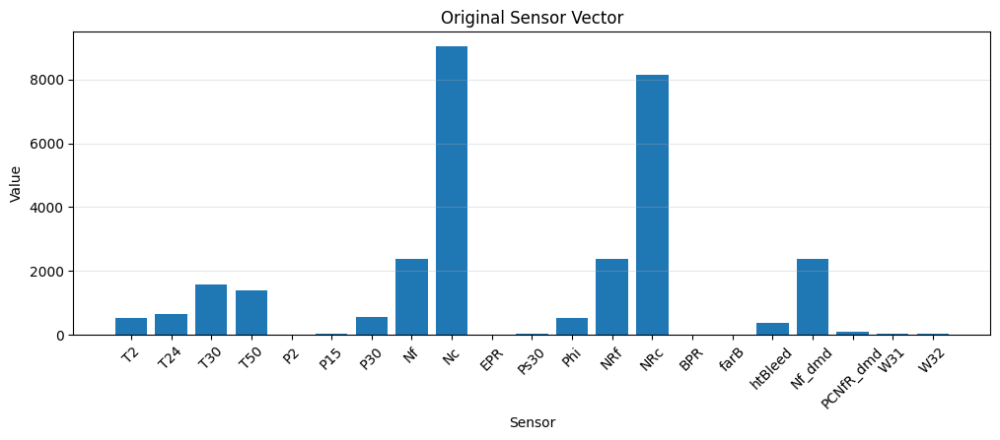

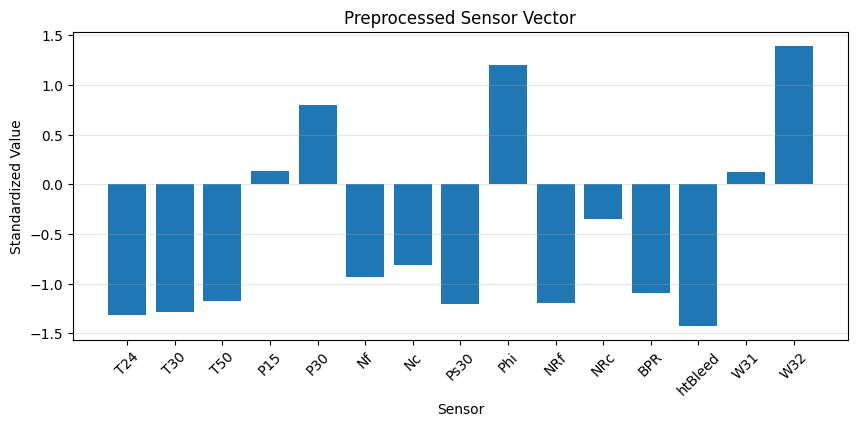

Hankel shape: (13441, 600)
40 × 15 = 600 dimensions


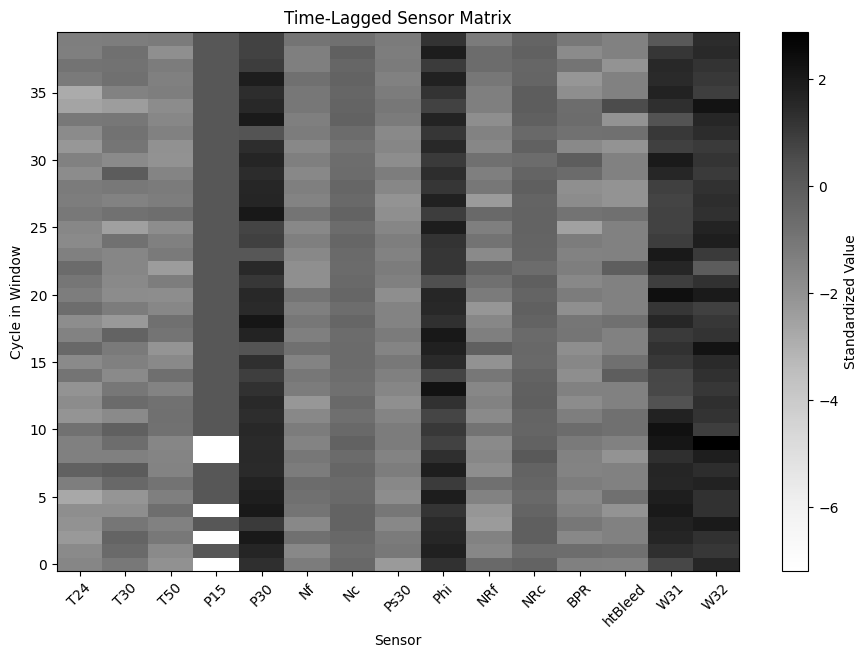

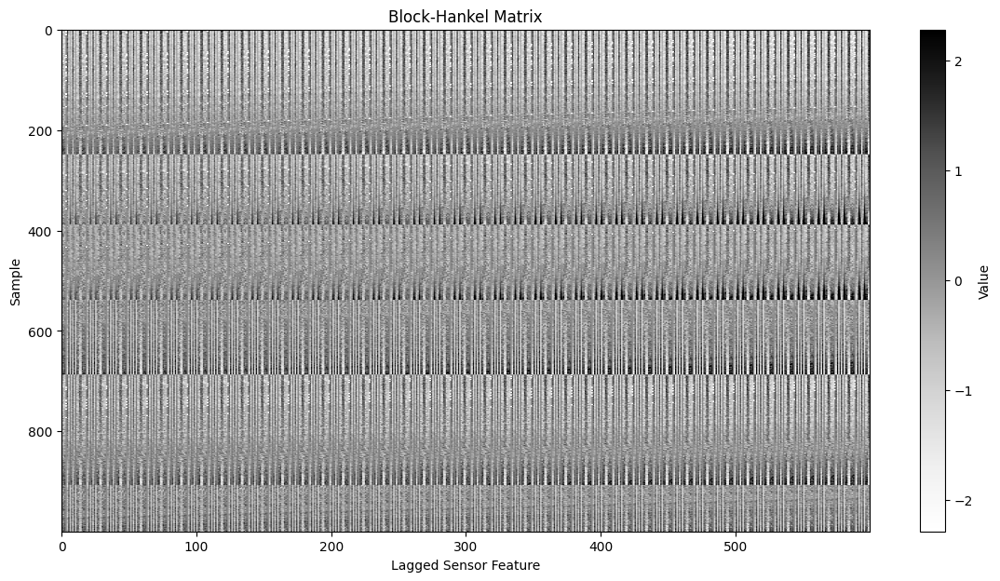

H: (13441, 600)
U: (13441, 600)
S: (600,)
Vt: (600, 600)


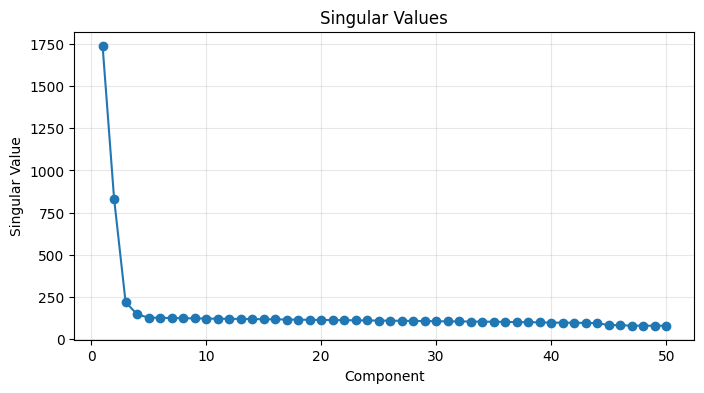

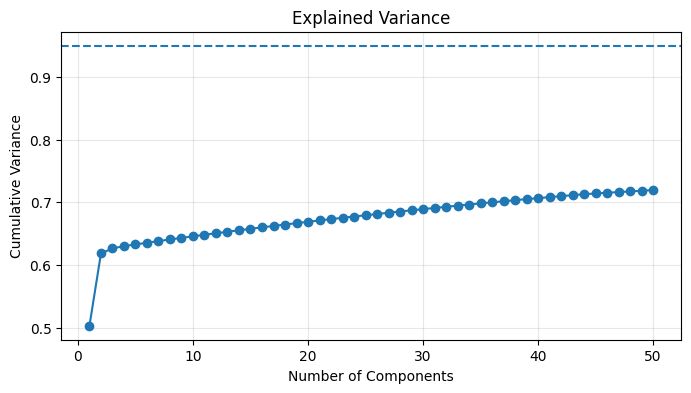

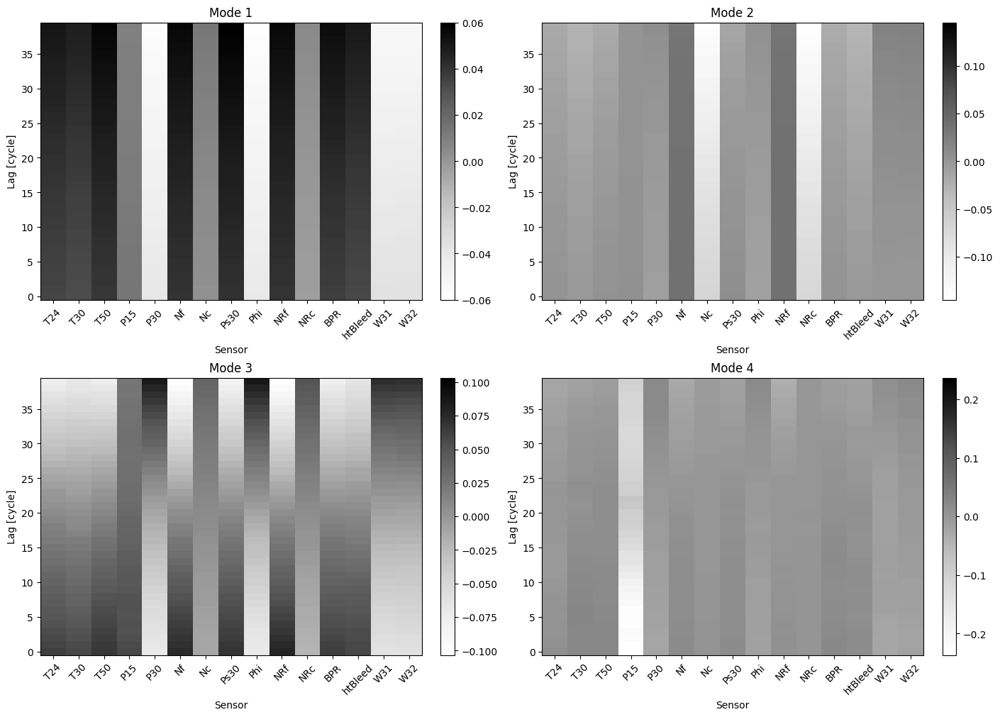

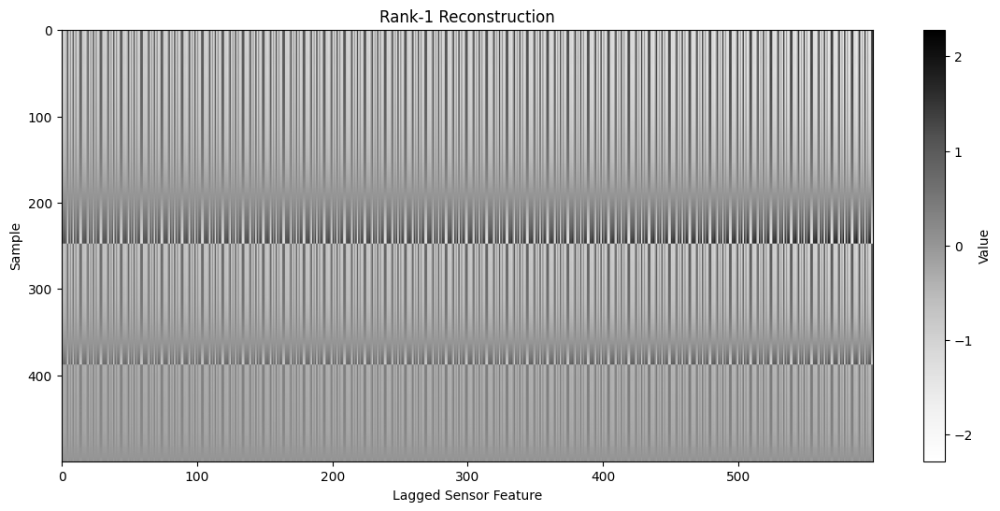

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:373: RuntimeWarning: divide by zero encountered in matmul
  H_rank = (U[:, :rank] * S[:rank]) @ Vt[:rank]
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:373: RuntimeWarning: overflow encountered in matmul
  H_rank = (U[:, :rank] * S[:rank]) @ Vt[:rank]
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:373: RuntimeWarning: invalid value encountered in matmul
  H_rank = (U[:, :rank] * S[:rank]) @ Vt[:rank]


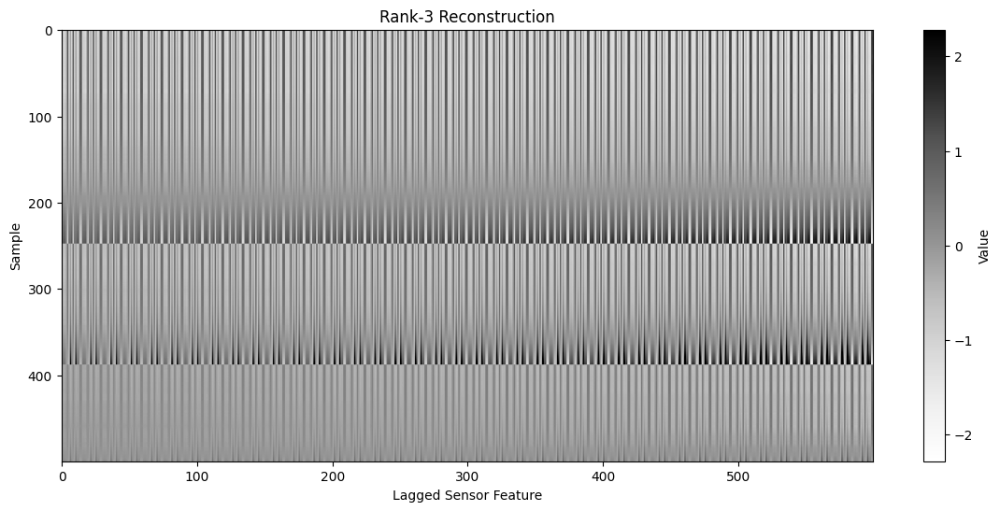

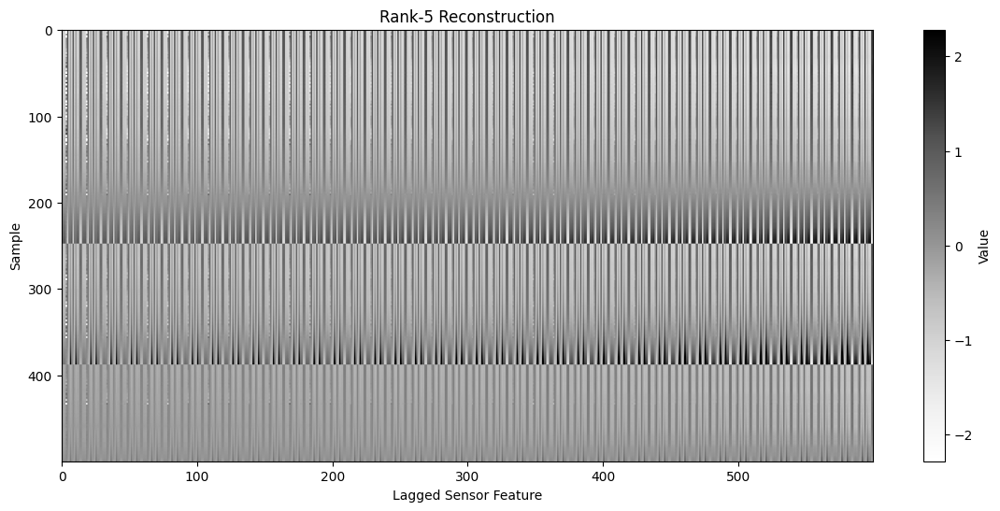

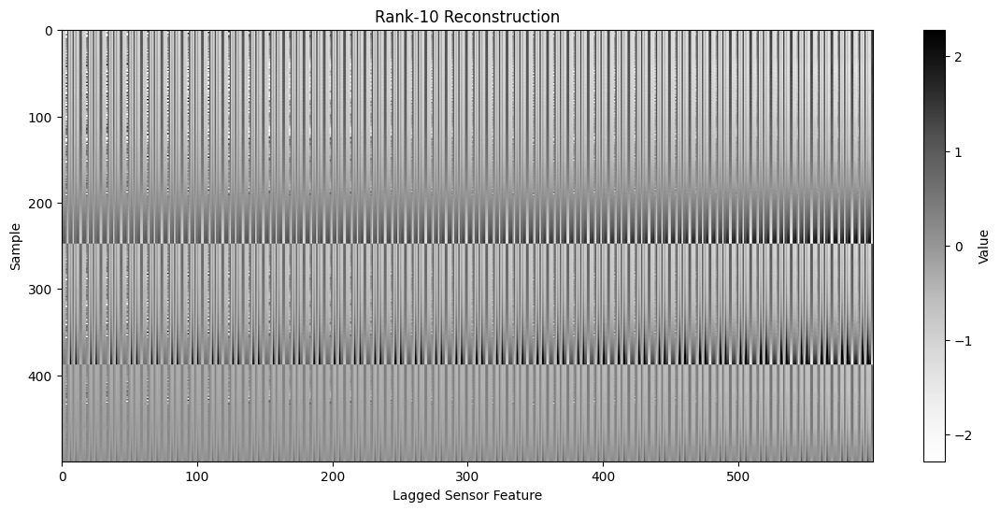

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:497: RuntimeWarning: divide by zero encountered in matmul
  Z_train = H_train_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:497: RuntimeWarning: overflow encountered in matmul
  Z_train = H_train_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:497: RuntimeWarning: invalid value encountered in matmul
  Z_train = H_train_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:498: RuntimeWarning: divide by zero encountered in matmul
  Z_val = H_val_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:498: RuntimeWarning: overflow encountered in matmul
  Z_val = H_val_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:498: RuntimeWarning: invalid value encountered in matmul
  Z_val = H_val_centered @ Vr
/var/f


Model Selection
Best rank: 11
Best lambda: 100.0
Validation RMSE: 11.78


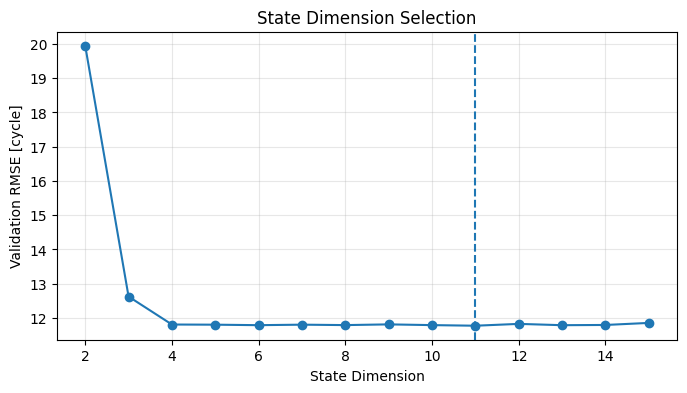

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:560: RuntimeWarning: divide by zero encountered in matmul
  Z_train = H_train_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:560: RuntimeWarning: overflow encountered in matmul
  Z_train = H_train_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:560: RuntimeWarning: invalid value encountered in matmul
  Z_train = H_train_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:561: RuntimeWarning: divide by zero encountered in matmul
  Z_val = H_val_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:561: RuntimeWarning: overflow encountered in matmul
  Z_val = H_val_centered @ Vr
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:561: RuntimeWarning: invalid value encountered in matmul
  Z_val = H_val_centered @ Vr


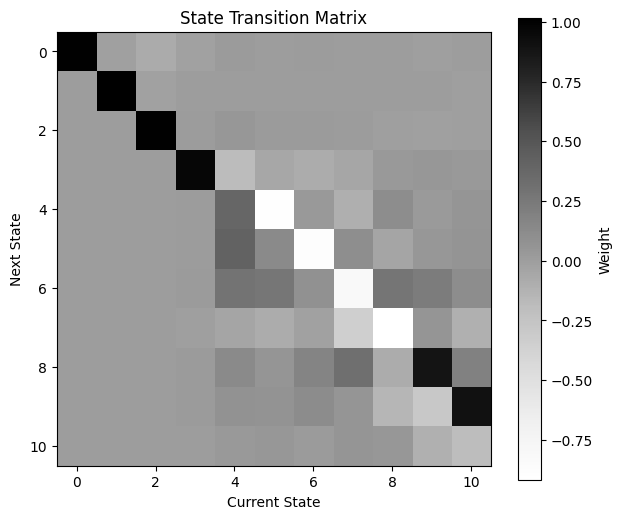

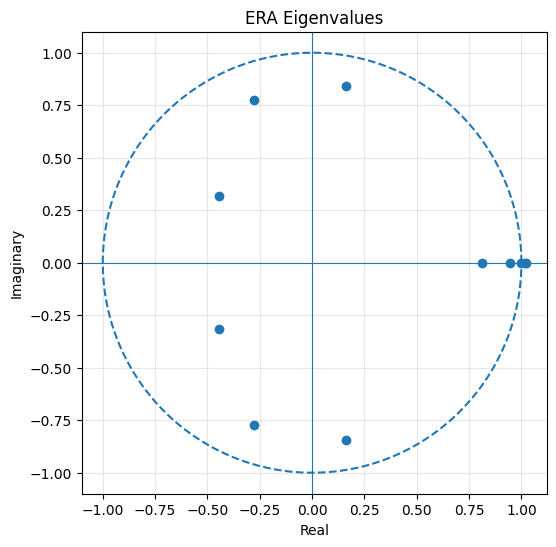

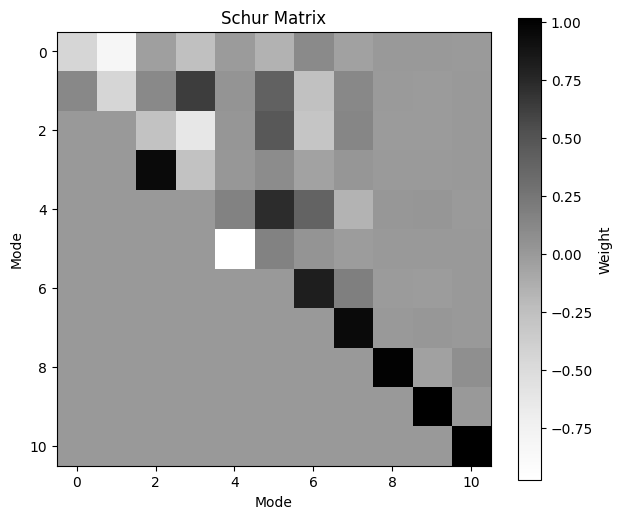

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:621: RuntimeWarning: divide by zero encountered in matmul
  M_train = Z_train @ Q
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:621: RuntimeWarning: overflow encountered in matmul
  M_train = Z_train @ Q
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:621: RuntimeWarning: invalid value encountered in matmul
  M_train = Z_train @ Q
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:622: RuntimeWarning: divide by zero encountered in matmul
  M_val = Z_val @ Q
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:622: RuntimeWarning: overflow encountered in matmul
  M_val = Z_val @ Q
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:622: RuntimeWarning: invalid value encountered in matmul
  M_val = Z_val @ Q


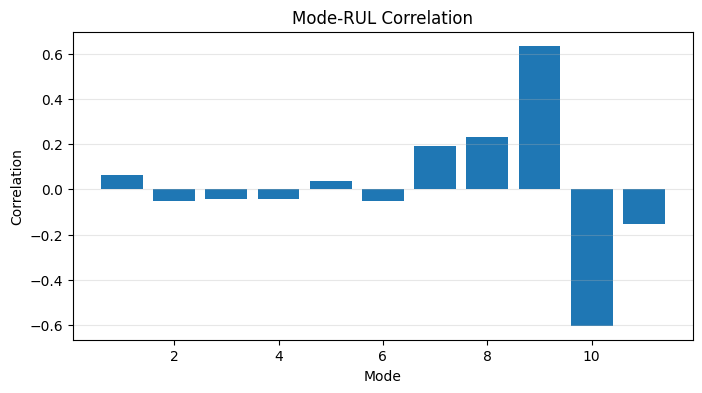

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:663: RuntimeWarning: divide by zero encountered in matmul
  y_val_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:663: RuntimeWarning: overflow encountered in matmul
  y_val_pred = Phi_val @ beta
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:663: RuntimeWarning: invalid value encountered in matmul
  y_val_pred = Phi_val @ beta



Validation Metrics
MSE  : 138.65
RMSE : 11.78
MAE  : 9.43
R²   : 0.9363


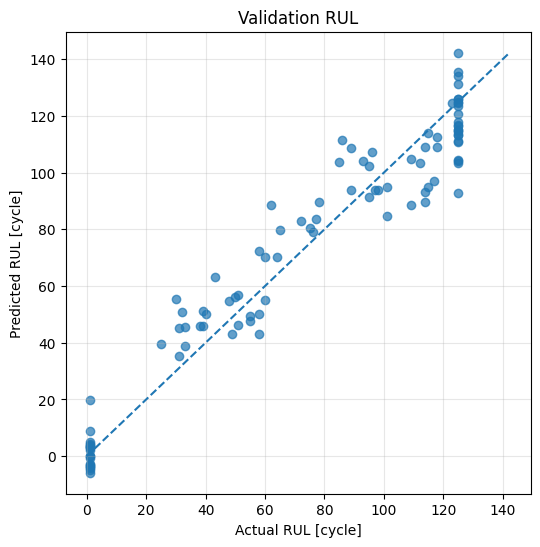

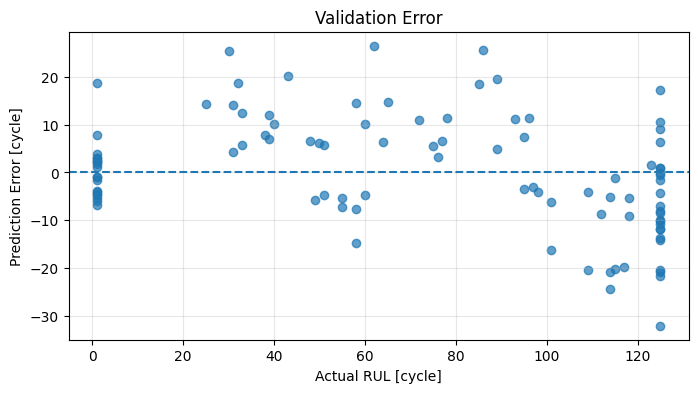


Test Metrics
MSE  : 190.05
RMSE : 13.79
MAE  : 9.91
R²   : 0.8817

Raw Test Metrics
MSE  : 230.56
RMSE : 15.18
MAE  : 10.93
R²   : 0.8665


/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:747: RuntimeWarning: divide by zero encountered in matmul
  Z_full = H_full_centered @ Vr_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:747: RuntimeWarning: overflow encountered in matmul
  Z_full = H_full_centered @ Vr_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:747: RuntimeWarning: invalid value encountered in matmul
  Z_full = H_full_centered @ Vr_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:763: RuntimeWarning: divide by zero encountered in matmul
  M_full_raw = Z_full @ Q_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:763: RuntimeWarning: overflow encountered in matmul
  M_full_raw = Z_full @ Q_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:763: RuntimeWarning: invalid value encountered in matmul
  M_full_raw = Z_full @ Q

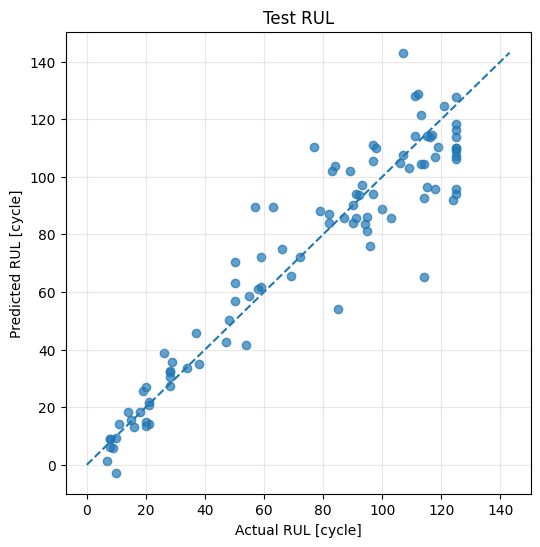

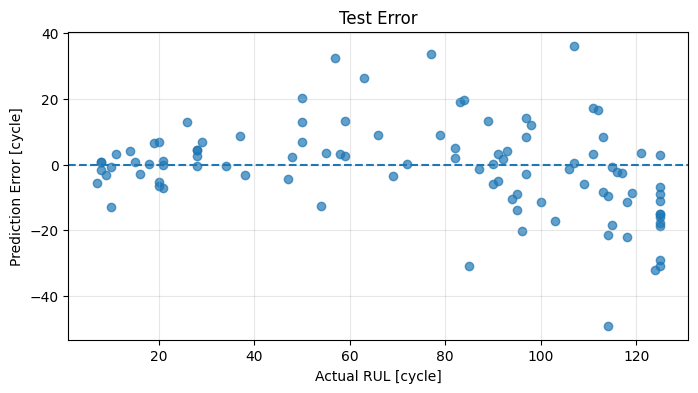

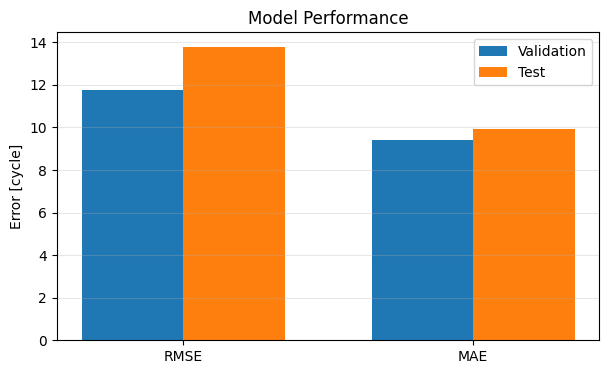

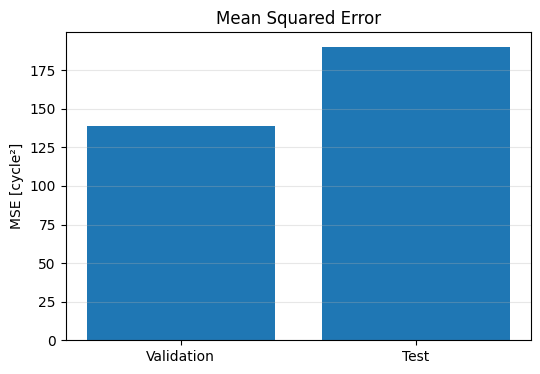

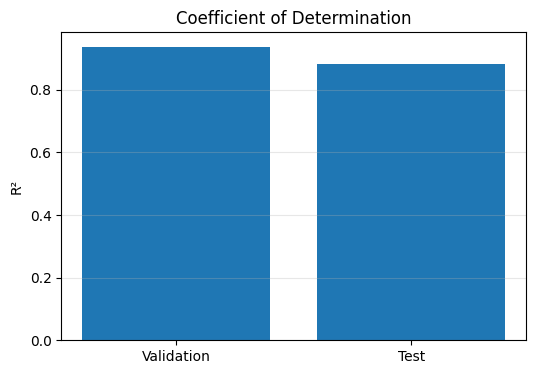


Geometry Modes
Mode X: 9 (-0.6492)
Mode Y: 10 (0.6165)


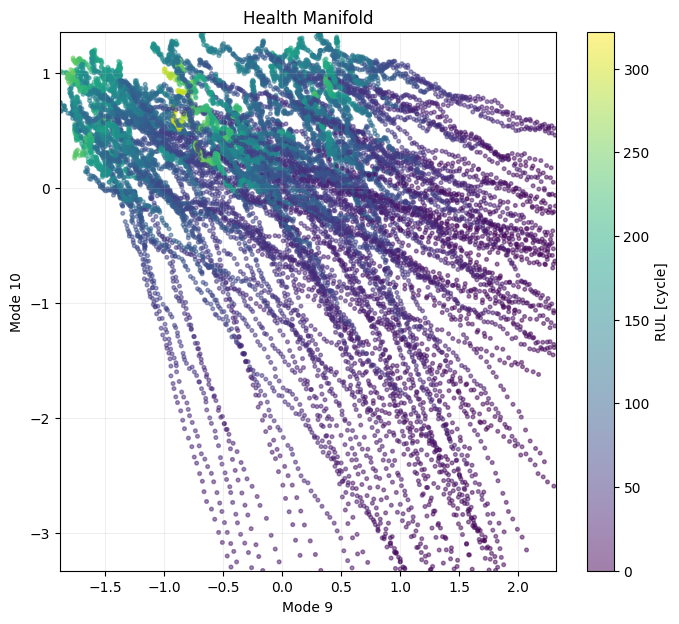

/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:1074: RuntimeWarning: divide by zero encountered in matmul
  surface_rul = Phi_surface @ beta_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:1074: RuntimeWarning: overflow encountered in matmul
  surface_rul = Phi_surface @ beta_full
/var/folders/2p/hhtqy8b96_d6zjxc3jlbxhz80000gn/T/ipykernel_4733/2576657245.py:1074: RuntimeWarning: invalid value encountered in matmul
  surface_rul = Phi_surface @ beta_full


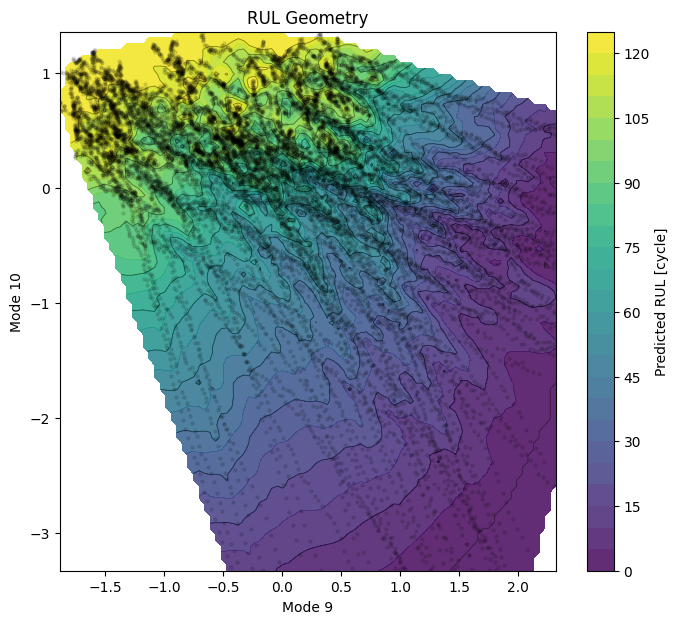

/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/mpl_toolkits/mplot3d/art3d.py:1239: RuntimeWarning: divide by zero encountered in matmul
  shade = ((normals / np.linalg.norm(normals, axis=1, keepdims=True))
/Users/br4c3/Projects/linear-algebra-for-machine-and-deep-learning/.venv/lib/python3.9/site-packages/mpl_toolkits/mplot3d/art3d.py:1239: RuntimeWarning: overflow encountered in matmul
  shade = ((normals / np.linalg.norm(normals, axis=1, keepdims=True))


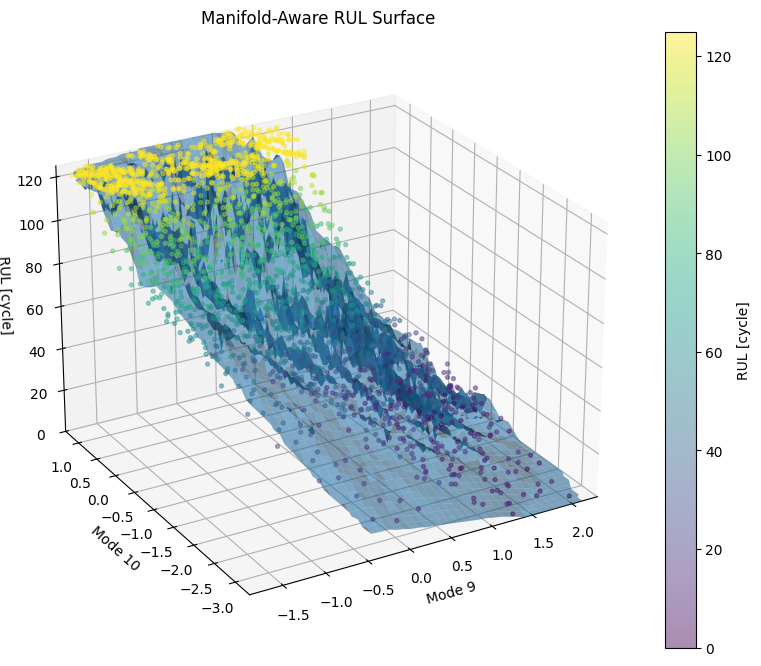

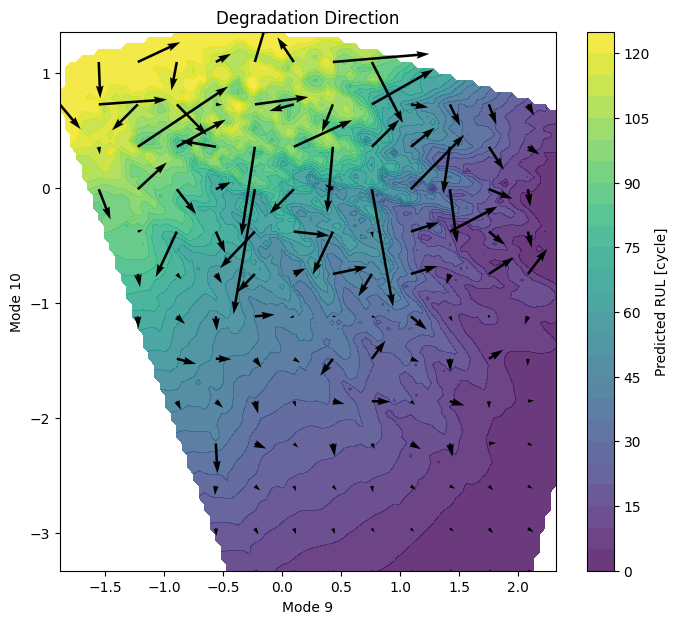

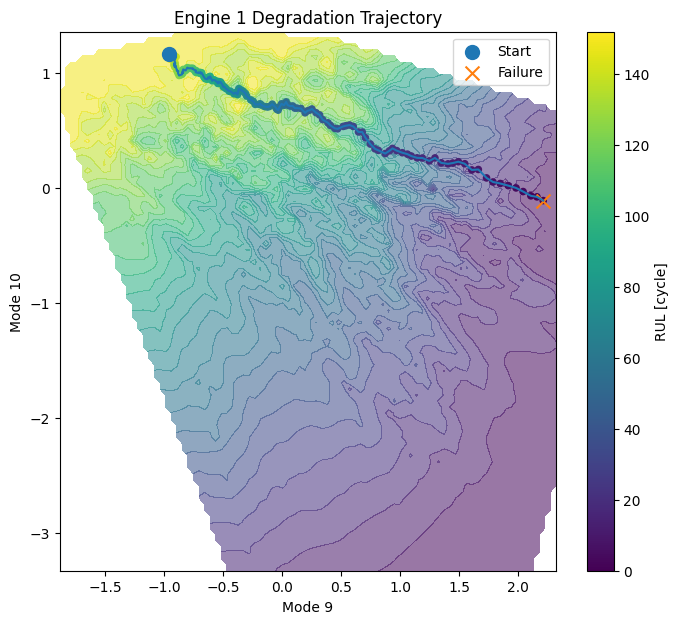

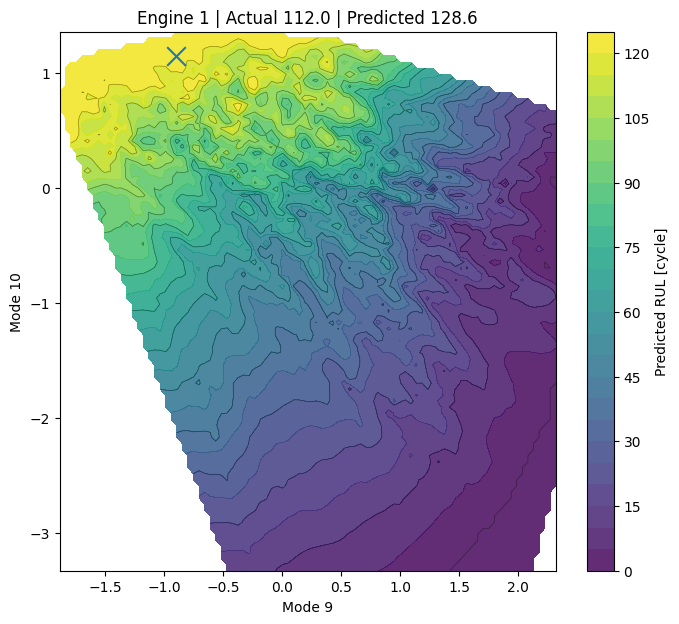

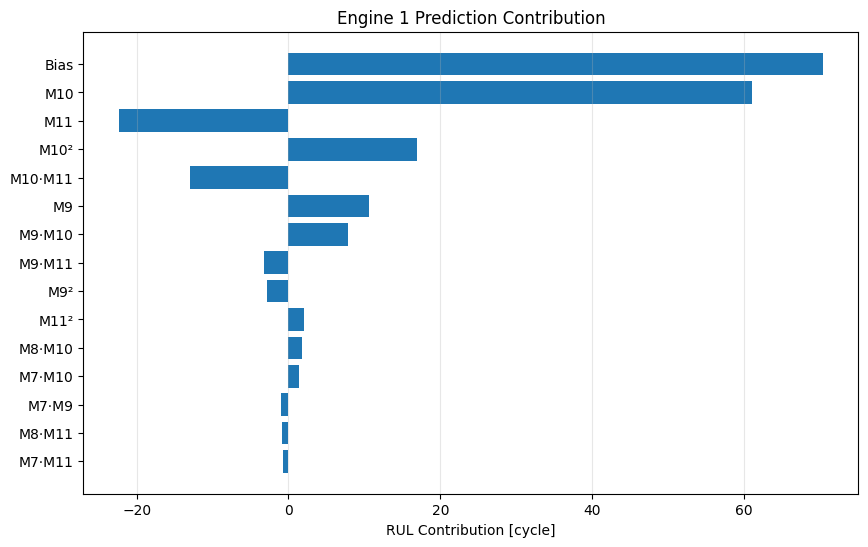


Prediction decomposition
Actual RUL: 112.0
Predicted RUL: 128.6103456258268
Contribution sum: 128.6103456258268


In [12]:
import matplotlib.pyplot as plt
import numpy as np

from scipy.linalg import schur
from scipy.spatial import Delaunay, cKDTree
from sklearn.model_selection import train_test_split


# ============================================================
# 설정
# ============================================================

lag = 40
rul_limit = 125

max_rank = 15
n_val_cutoffs = 5
min_val_cycle = 40

lambda_grid = [1e-4, 1e-3, 1e-2, 1e-1, 1.0, 10.0, 100.0]
dynamic_lambda = 1e-3


# ============================================================
# Sensor 정보
# ============================================================

sensor_names = {
    "sensor_1": "T2",          # 팬 입구 총온도
    "sensor_2": "T24",         # 저압 압축기 출구 총온도
    "sensor_3": "T30",         # 고압 압축기 출구 총온도
    "sensor_4": "T50",         # 저압 터빈 출구 총온도
    "sensor_5": "P2",          # 팬 입구 압력
    "sensor_6": "P15",         # 바이패스 덕트 총압력
    "sensor_7": "P30",         # 고압 압축기 출구 총압력
    "sensor_8": "Nf",          # 팬 회전 속도
    "sensor_9": "Nc",          # 코어 회전 속도
    "sensor_10": "EPR",        # 엔진 압력비
    "sensor_11": "Ps30",       # 고압 압축기 출구 정압
    "sensor_12": "Phi",        # 연료 유량 / Ps30
    "sensor_13": "NRf",        # 보정 팬 회전 속도
    "sensor_14": "NRc",        # 보정 코어 회전 속도
    "sensor_15": "BPR",        # 바이패스 비율
    "sensor_16": "farB",       # 연소기 연료-공기비
    "sensor_17": "htBleed",    # 블리드 공기 엔탈피
    "sensor_18": "Nf_dmd",     # 요구 팬 회전 속도
    "sensor_19": "PCNfR_dmd",  # 요구 보정 팬 회전 속도
    "sensor_20": "W31",        # 고압 터빈 냉각 블리드 유량
    "sensor_21": "W32",        # 저압 터빈 냉각 블리드 유량
}


# ============================================================
# RUL 생성
# ============================================================

train_df["RUL_raw"] = train_df.groupby("unit_id")["cycle"].transform("max") - train_df["cycle"]
train_df["RUL"] = train_df["RUL_raw"].clip(upper=rul_limit)


# ============================================================
# Train / Validation
# ============================================================

unit_ids = train_df["unit_id"].unique()
train_units, val_units = train_test_split(unit_ids, test_size=0.2, random_state=42)

train_raw = train_df[train_df["unit_id"].isin(train_units)].copy()
val_raw = train_df[train_df["unit_id"].isin(val_units)].copy()


# ============================================================
# Sensor 선택
# ============================================================

all_sensor_cols = [f"sensor_{i}" for i in range(1, 22)]

X_train_raw = train_raw[all_sensor_cols].to_numpy(float)

if not np.isfinite(X_train_raw).all():
    raise ValueError("Sensor data contains NaN or Inf.")

mean = X_train_raw.mean(0)
std = X_train_raw.std(0)

valid = std > 1e-8

sensor_cols = np.array(all_sensor_cols)[valid].tolist()
removed_sensor_cols = np.array(all_sensor_cols)[~valid].tolist()

mean = mean[valid]
std = std[valid]

sensor_labels = [sensor_names[x] for x in sensor_cols]

print("Selected sensors:", sensor_labels)
print("Removed sensors:", [sensor_names[x] for x in removed_sensor_cols])
print("Sensor dimension:", len(sensor_cols))


# ============================================================
# Standardization
# ============================================================

def normalize_data(df, sensors, mean, std):
    data = df.copy()
    data[sensors] = data[sensors].astype(float)
    data.loc[:, sensors] = (data[sensors].to_numpy(float) - mean) / std
    return data


train_data = normalize_data(train_raw, sensor_cols, mean, std)
val_data = normalize_data(val_raw, sensor_cols, mean, std)


# ============================================================
# 입력 예시
# ============================================================

example_unit = sorted(train_units)[0]

example_engine_raw = train_raw[train_raw["unit_id"] == example_unit].sort_values("cycle")
example_engine = train_data[train_data["unit_id"] == example_unit].sort_values("cycle")

example_index = min(lag - 1, len(example_engine) - 1)

x_raw = example_engine_raw.iloc[example_index][all_sensor_cols].to_numpy(float)
x_processed = example_engine.iloc[example_index][sensor_cols].to_numpy(float)


# ============================================================
# 원본 입력
# ============================================================

plt.figure(figsize=(12, 4))
plt.bar([sensor_names[x] for x in all_sensor_cols], x_raw)
plt.xlabel("Sensor")
plt.ylabel("Value")
plt.title("Original Sensor Vector")
plt.xticks(rotation=45)
plt.grid(axis="y", alpha=0.3)
plt.show()


# ============================================================
# 전처리 입력
# ============================================================

plt.figure(figsize=(10, 4))
plt.bar(sensor_labels, x_processed)
plt.xlabel("Sensor")
plt.ylabel("Standardized Value")
plt.title("Preprocessed Sensor Vector")
plt.xticks(rotation=45)
plt.grid(axis="y", alpha=0.3)
plt.show()


# ============================================================
# Block-Hankel
# ============================================================

def make_hankel_states(df, sensors, lag):
    H = []
    y = []
    y_raw = []
    units = []
    cycles = []

    for unit_id in sorted(df["unit_id"].unique()):
        engine = df[df["unit_id"] == unit_id].sort_values("cycle")

        X = engine[sensors].to_numpy(float)
        rul = engine["RUL"].to_numpy(float)
        rul_raw = engine["RUL_raw"].to_numpy(float)
        cycle = engine["cycle"].to_numpy()

        for t in range(lag - 1, len(engine)):
            window = X[t - lag + 1:t + 1]

            H.append(window.reshape(-1))
            y.append(rul[t])
            y_raw.append(rul_raw[t])
            units.append(unit_id)
            cycles.append(cycle[t])

    return np.array(H), np.array(y), np.array(y_raw), np.array(units), np.array(cycles)


H_train, y_train, y_train_raw, unit_train, cycle_train = make_hankel_states(train_data, sensor_cols, lag)

print("Hankel shape:", H_train.shape)
print(f"{lag} × {len(sensor_cols)} = {lag * len(sensor_cols)} dimensions")


# ============================================================
# 한 Window
# ============================================================

example_window = example_engine[sensor_cols].iloc[:lag].to_numpy(float)

plt.figure(figsize=(11, 7))
plt.imshow(example_window, aspect="auto", origin="lower", cmap="Greys")
plt.xlabel("Sensor")
plt.ylabel("Cycle in Window")
plt.title("Time-Lagged Sensor Matrix")
plt.xticks(range(len(sensor_labels)), sensor_labels, rotation=45)
plt.colorbar(label="Standardized Value")
plt.show()


# ============================================================
# Validation Cutoff
# ============================================================

def make_validation_cutoffs(df, n_cutoffs, min_cycle, lag, rul_limit):
    cutoffs = []

    for unit_id in sorted(df["unit_id"].unique()):
        engine = df[df["unit_id"] == unit_id].sort_values("cycle")

        max_cycle = int(engine["cycle"].max())
        start = max(min_cycle, lag)

        if start >= max_cycle:
            continue

        points = np.linspace(start, max_cycle - 1, n_cutoffs, dtype=int)

        for cutoff in np.unique(points):
            raw_rul = max_cycle - cutoff
            target = min(raw_rul, rul_limit)

            cutoffs.append((unit_id, cutoff, target, raw_rul))

    return cutoffs


val_cutoffs = make_validation_cutoffs(val_data, n_val_cutoffs, min_val_cycle, lag, rul_limit)


# ============================================================
# Validation Hankel
# ============================================================

def make_cutoff_hankel(df, sensors, lag, cutoffs):
    H = []
    y = []
    y_raw = []
    units = []

    for unit_id, cutoff, target, raw_target in cutoffs:
        engine = df[(df["unit_id"] == unit_id) & (df["cycle"] <= cutoff)].sort_values("cycle")

        X = engine[sensors].to_numpy(float)

        if len(X) < lag:
            padding = np.repeat(X[:1], lag - len(X), axis=0)
            window = np.vstack([padding, X])
        else:
            window = X[-lag:]

        H.append(window.reshape(-1))
        y.append(target)
        y_raw.append(raw_target)
        units.append(unit_id)

    return np.array(H), np.array(y, float), np.array(y_raw, float), np.array(units)


H_val, y_val, y_val_raw, val_engine_ids = make_cutoff_hankel(val_data, sensor_cols, lag, val_cutoffs)


# ============================================================
# Centering
# ============================================================

H_mean = H_train.mean(0)

H_train_centered = H_train - H_mean
H_val_centered = H_val - H_mean


# ============================================================
# Block-Hankel Matrix
# ============================================================

n_heatmap = min(1000, len(H_train_centered))
heat_limit = np.percentile(np.abs(H_train_centered[:n_heatmap]), 99)

plt.figure(figsize=(14, 7))
plt.imshow(H_train_centered[:n_heatmap], aspect="auto", cmap="Greys", vmin=-heat_limit, vmax=heat_limit)
plt.xlabel("Lagged Sensor Feature")
plt.ylabel("Sample")
plt.title("Block-Hankel Matrix")
plt.colorbar(label="Value")
plt.show()


# ============================================================
# SVD
# ============================================================

U, S, Vt = np.linalg.svd(H_train_centered, full_matrices=False)

print("H:", H_train_centered.shape)
print("U:", U.shape)
print("S:", S.shape)
print("Vt:", Vt.shape)


# ============================================================
# Singular Values
# ============================================================

n_plot = min(50, len(S))

plt.figure(figsize=(8, 4))
plt.plot(range(1, n_plot + 1), S[:n_plot], "o-")
plt.xlabel("Component")
plt.ylabel("Singular Value")
plt.title("Singular Values")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Explained Variance
# ============================================================

explained_variance = S ** 2 / np.sum(S ** 2)
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(8, 4))
plt.plot(range(1, n_plot + 1), cumulative_variance[:n_plot], "o-")
plt.axhline(0.95, linestyle="--")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance")
plt.title("Explained Variance")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Temporal SVD Modes
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 10), layout="constrained")

for i, ax in enumerate(axes.flat):
    mode = Vt[i].reshape(lag, len(sensor_cols))
    limit = np.max(np.abs(mode))

    image = ax.imshow(mode, aspect="auto", origin="lower", cmap="Greys", vmin=-limit, vmax=limit)

    ax.set_title(f"Mode {i + 1}")
    ax.set_xlabel("Sensor")
    ax.set_ylabel("Lag [cycle]")
    ax.set_xticks(range(len(sensor_labels)), sensor_labels, rotation=45)

    fig.colorbar(image, ax=ax)

plt.show()


# ============================================================
# Low-Rank Reconstruction
# ============================================================

reconstruction_ranks = [1, 3, 5, 10]

for rank in reconstruction_ranks:
    H_rank = (U[:, :rank] * S[:rank]) @ Vt[:rank]

    plt.figure(figsize=(14, 6))
    plt.imshow(H_rank[:500], aspect="auto", cmap="Greys", vmin=-heat_limit, vmax=heat_limit)
    plt.xlabel("Lagged Sensor Feature")
    plt.ylabel("Sample")
    plt.title(f"Rank-{rank} Reconstruction")
    plt.colorbar(label="Value")
    plt.show()


# ============================================================
# Metrics
# ============================================================

def mse(y, y_pred):
    return np.mean((y - y_pred) ** 2)


def rmse(y, y_pred):
    return np.sqrt(mse(y, y_pred))


def mae(y, y_pred):
    return np.mean(np.abs(y - y_pred))


def r2(y, y_pred):
    ss_res = np.sum((y - y_pred) ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    return 1 - ss_res / ss_tot


# ============================================================
# Engine Weight
# ============================================================

def engine_weights(units):
    unique, counts = np.unique(units, return_counts=True)
    count_map = dict(zip(unique, counts))

    weights = np.array([1 / count_map[unit] for unit in units])
    weights /= weights.mean()

    return weights


train_weights = engine_weights(unit_train)


# ============================================================
# State Transition
# ============================================================

def fit_transition(Z, units, cycles, lam):
    mask = (units[:-1] == units[1:]) & (cycles[1:] == cycles[:-1] + 1)

    Z_prev = Z[:-1][mask]
    Z_next = Z[1:][mask]

    rank = Z.shape[1]

    A_aug = np.vstack([Z_prev, np.sqrt(lam) * np.eye(rank)])
    B_aug = np.vstack([Z_next, np.zeros((rank, rank))])

    theta, _, _, _ = np.linalg.lstsq(A_aug, B_aug, rcond=None)

    return theta.T


# ============================================================
# Quadratic Feature
# ============================================================

def quadratic_features(Z):
    features = [np.ones(len(Z))]

    for i in range(Z.shape[1]):
        features.append(Z[:, i])

    for i in range(Z.shape[1]):
        for j in range(i, Z.shape[1]):
            features.append(Z[:, i] * Z[:, j])

    return np.column_stack(features)


# ============================================================
# Tikhonov
# ============================================================

def tikhonov(Phi, y, lam, weights=None):
    if weights is None:
        weights = np.ones(len(y))

    L = np.eye(Phi.shape[1])
    L[0, 0] = 0

    sqrt_w = np.sqrt(weights)

    A = Phi * sqrt_w[:, None]
    b = y * sqrt_w

    A = np.vstack([A, np.sqrt(lam) * L])
    b = np.concatenate([b, np.zeros(Phi.shape[1])])

    beta, _, _, _ = np.linalg.lstsq(A, b, rcond=None)

    return beta


# ============================================================
# Rank + Lambda 선택
# ============================================================

matrix_rank = np.sum(S > S[0] * 1e-10)
max_rank = min(max_rank, matrix_rank)

results = []

for rank in range(2, max_rank + 1):
    Vr = Vt[:rank].T

    Z_train = H_train_centered @ Vr
    Z_val = H_val_centered @ Vr

    A = fit_transition(Z_train, unit_train, cycle_train, dynamic_lambda)

    T, Q = schur(A, output="real")

    M_train = Z_train @ Q
    M_val = Z_val @ Q

    modal_mean = M_train.mean(0)
    modal_std = M_train.std(0)
    modal_std[modal_std < 1e-8] = 1

    M_train = (M_train - modal_mean) / modal_std
    M_val = (M_val - modal_mean) / modal_std

    Phi_train = quadratic_features(M_train)
    Phi_val = quadratic_features(M_val)

    for lam in lambda_grid:
        beta = tikhonov(Phi_train, y_train, lam, train_weights)
        y_pred = Phi_val @ beta

        results.append((rank, lam, rmse(y_val, y_pred)))


best_rank, best_lambda, best_rmse = min(results, key=lambda x: x[2])

print()
print("Model Selection")
print("Best rank:", best_rank)
print("Best lambda:", best_lambda)
print(f"Validation RMSE: {best_rmse:.2f}")


# ============================================================
# Rank Selection
# ============================================================

rank_errors = []

for rank in range(2, max_rank + 1):
    candidates = [result for result in results if result[0] == rank]
    rank_errors.append(min(candidates, key=lambda x: x[2])[2])


plt.figure(figsize=(8, 4))
plt.plot(range(2, max_rank + 1), rank_errors, "o-")
plt.axvline(best_rank, linestyle="--")
plt.xlabel("State Dimension")
plt.ylabel("Validation RMSE [cycle]")
plt.title("State Dimension Selection")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Reduced State
# ============================================================

Vr = Vt[:best_rank].T

Z_train = H_train_centered @ Vr
Z_val = H_val_centered @ Vr


# ============================================================
# Transition Matrix
# ============================================================

A = fit_transition(Z_train, unit_train, cycle_train, dynamic_lambda)

plt.figure(figsize=(7, 6))
plt.imshow(A, cmap="Greys")
plt.xlabel("Current State")
plt.ylabel("Next State")
plt.title("State Transition Matrix")
plt.colorbar(label="Weight")
plt.show()


# ============================================================
# Eigenvalues
# ============================================================

eigenvalues = np.linalg.eigvals(A)

angle = np.linspace(0, 2 * np.pi, 400)

plt.figure(figsize=(6, 6))
plt.plot(np.cos(angle), np.sin(angle), "--")
plt.scatter(eigenvalues.real, eigenvalues.imag)

plt.axhline(0, linewidth=0.8)
plt.axvline(0, linewidth=0.8)

plt.xlabel("Real")
plt.ylabel("Imaginary")
plt.title("ERA Eigenvalues")
plt.axis("equal")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Schur
# ============================================================

T, Q = schur(A, output="real")

plt.figure(figsize=(7, 6))
plt.imshow(T, cmap="Greys")
plt.xlabel("Mode")
plt.ylabel("Mode")
plt.title("Schur Matrix")
plt.colorbar(label="Weight")
plt.show()


# ============================================================
# Modal State
# ============================================================

M_train = Z_train @ Q
M_val = Z_val @ Q

modal_mean = M_train.mean(0)
modal_std = M_train.std(0)
modal_std[modal_std < 1e-8] = 1

M_train = (M_train - modal_mean) / modal_std
M_val = (M_val - modal_mean) / modal_std


# ============================================================
# Mode-RUL Correlation
# ============================================================

mode_correlations = []

for i in range(best_rank):
    corr = np.corrcoef(M_train[:, i], y_train_raw)[0, 1]
    mode_correlations.append(corr)

mode_order = np.argsort(np.abs(mode_correlations))[::-1]


plt.figure(figsize=(8, 4))
plt.bar(range(1, best_rank + 1), mode_correlations)
plt.xlabel("Mode")
plt.ylabel("Correlation")
plt.title("Mode-RUL Correlation")
plt.grid(axis="y", alpha=0.3)
plt.show()


# ============================================================
# Validation Regression
# ============================================================

Phi_train = quadratic_features(M_train)
Phi_val = quadratic_features(M_val)

beta = tikhonov(Phi_train, y_train, best_lambda, train_weights)

y_val_pred = Phi_val @ beta


# ============================================================
# Validation Metrics
# ============================================================

print()
print("Validation Metrics")
print(f"MSE  : {mse(y_val, y_val_pred):.2f}")
print(f"RMSE : {rmse(y_val, y_val_pred):.2f}")
print(f"MAE  : {mae(y_val, y_val_pred):.2f}")
print(f"R²   : {r2(y_val, y_val_pred):.4f}")


# ============================================================
# Validation RUL
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_val, y_val_pred, alpha=0.7)

limit = max(y_val.max(), y_val_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Validation RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Validation Error
# ============================================================

val_error = y_val_pred - y_val

plt.figure(figsize=(8, 4))
plt.scatter(y_val, val_error, alpha=0.7)
plt.axhline(0, linestyle="--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Prediction Error [cycle]")
plt.title("Validation Error")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# 전체 Train 재학습
# ============================================================

X_full_raw = train_df[sensor_cols].to_numpy(float)

full_mean = X_full_raw.mean(0)
full_std = X_full_raw.std(0)

if np.any(full_std <= 1e-8):
    raise ValueError("A selected sensor has zero variance.")

full_data = normalize_data(train_df, sensor_cols, full_mean, full_std)
test_data = normalize_data(test_df, sensor_cols, full_mean, full_std)


# ============================================================
# Full Hankel
# ============================================================

H_full, y_full, y_full_raw, unit_full, cycle_full = make_hankel_states(full_data, sensor_cols, lag)

H_full_mean = H_full.mean(0)
H_full_centered = H_full - H_full_mean

full_weights = engine_weights(unit_full)


# ============================================================
# Full SVD
# ============================================================

_, _, Vt_full = np.linalg.svd(H_full_centered, full_matrices=False)

Vr_full = Vt_full[:best_rank].T

Z_full = H_full_centered @ Vr_full


# ============================================================
# Full ERA
# ============================================================

A_full = fit_transition(Z_full, unit_full, cycle_full, dynamic_lambda)

T_full, Q_full = schur(A_full, output="real")


# ============================================================
# Full Modal State
# ============================================================

M_full_raw = Z_full @ Q_full

full_modal_mean = M_full_raw.mean(0)
full_modal_std = M_full_raw.std(0)
full_modal_std[full_modal_std < 1e-8] = 1

M_full = (M_full_raw - full_modal_mean) / full_modal_std


# ============================================================
# Final Regression
# ============================================================

Phi_full = quadratic_features(M_full)

beta_full = tikhonov(Phi_full, y_full, best_lambda, full_weights)


# ============================================================
# Test Hankel
# ============================================================

def make_test_hankel(df, sensors, lag):
    H = []
    units = []

    for unit_id in sorted(df["unit_id"].unique()):
        engine = df[df["unit_id"] == unit_id].sort_values("cycle")

        X = engine[sensors].to_numpy(float)

        if len(X) < lag:
            padding = np.repeat(X[:1], lag - len(X), axis=0)
            window = np.vstack([padding, X])
        else:
            window = X[-lag:]

        H.append(window.reshape(-1))
        units.append(unit_id)

    return np.array(H), np.array(units)


H_test, engine_ids = make_test_hankel(test_data, sensor_cols, lag)

H_test_centered = H_test - H_full_mean

Z_test = H_test_centered @ Vr_full

M_test_raw = Z_test @ Q_full
M_test = (M_test_raw - full_modal_mean) / full_modal_std

Phi_test = quadratic_features(M_test)


# ============================================================
# Test Prediction
# ============================================================

y_test_raw = rul_df["RUL"].to_numpy(float)
y_test = np.minimum(y_test_raw, rul_limit)

y_test_pred = Phi_test @ beta_full


# ============================================================
# Test Metrics
# ============================================================

print()
print("Test Metrics")
print(f"MSE  : {mse(y_test, y_test_pred):.2f}")
print(f"RMSE : {rmse(y_test, y_test_pred):.2f}")
print(f"MAE  : {mae(y_test, y_test_pred):.2f}")
print(f"R²   : {r2(y_test, y_test_pred):.4f}")


# ============================================================
# Raw Test Metrics
# ============================================================

print()
print("Raw Test Metrics")
print(f"MSE  : {mse(y_test_raw, y_test_pred):.2f}")
print(f"RMSE : {rmse(y_test_raw, y_test_pred):.2f}")
print(f"MAE  : {mae(y_test_raw, y_test_pred):.2f}")
print(f"R²   : {r2(y_test_raw, y_test_pred):.4f}")


# ============================================================
# Test RUL
# ============================================================

plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.7)

limit = max(y_test.max(), y_test_pred.max())

plt.plot([0, limit], [0, limit], "--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Predicted RUL [cycle]")
plt.title("Test RUL")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Test Error
# ============================================================

test_error = y_test_pred - y_test

plt.figure(figsize=(8, 4))
plt.scatter(y_test, test_error, alpha=0.7)
plt.axhline(0, linestyle="--")
plt.xlabel("Actual RUL [cycle]")
plt.ylabel("Prediction Error [cycle]")
plt.title("Test Error")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Validation / Test Metric 비교
# ============================================================

metric_names = ["RMSE", "MAE"]

validation_metrics = [
    rmse(y_val, y_val_pred),
    mae(y_val, y_val_pred),
]

test_metrics = [
    rmse(y_test, y_test_pred),
    mae(y_test, y_test_pred),
]

x = np.arange(len(metric_names))
width = 0.35

plt.figure(figsize=(7, 4))
plt.bar(x - width / 2, validation_metrics, width, label="Validation")
plt.bar(x + width / 2, test_metrics, width, label="Test")
plt.xticks(x, metric_names)
plt.ylabel("Error [cycle]")
plt.title("Model Performance")
plt.legend()
plt.grid(axis="y", alpha=0.3)
plt.show()


# ============================================================
# MSE 비교
# ============================================================

plt.figure(figsize=(6, 4))
plt.bar(["Validation", "Test"], [mse(y_val, y_val_pred), mse(y_test, y_test_pred)])
plt.ylabel("MSE [cycle²]")
plt.title("Mean Squared Error")
plt.grid(axis="y", alpha=0.3)
plt.show()


# ============================================================
# R² 비교
# ============================================================

plt.figure(figsize=(6, 4))
plt.bar(["Validation", "Test"], [r2(y_val, y_val_pred), r2(y_test, y_test_pred)])
plt.ylabel("R²")
plt.title("Coefficient of Determination")
plt.grid(axis="y", alpha=0.3)
plt.show()


# ============================================================
# ============================================================
#
# GEOMETRIC INTERPRETATION
#
# ============================================================
# ============================================================


# ============================================================
# Full Mode-RUL Correlation
# ============================================================

mode_correlations_full = []

for i in range(best_rank):
    corr = np.corrcoef(M_full[:, i], y_full_raw)[0, 1]
    mode_correlations_full.append(corr)

mode_order_full = np.argsort(np.abs(mode_correlations_full))[::-1]

mode_x = mode_order_full[0]
mode_y = mode_order_full[1]

if best_rank >= 3:
    mode_z = mode_order_full[2]

print()
print("Geometry Modes")
print(f"Mode X: {mode_x + 1} ({mode_correlations_full[mode_x]:.4f})")
print(f"Mode Y: {mode_y + 1} ({mode_correlations_full[mode_y]:.4f})")


# ============================================================
# Latent Data Range
# ============================================================

x_data = M_full[:, mode_x]
y_data = M_full[:, mode_y]

x_low, x_high = np.percentile(x_data, [2, 98])
y_low, y_high = np.percentile(y_data, [2, 98])

x_margin = 0.05 * (x_high - x_low)
y_margin = 0.05 * (y_high - y_low)

x_min = x_low - x_margin
x_max = x_high + x_margin

y_min = y_low - y_margin
y_max = y_high + y_margin

in_range = (
    (x_data >= x_min)
    & (x_data <= x_max)
    & (y_data >= y_min)
    & (y_data <= y_max)
)


# ============================================================
# Health Manifold
# ============================================================

plt.figure(figsize=(8, 7))

scatter = plt.scatter(x_data[in_range], y_data[in_range], c=y_full_raw[in_range], s=7, alpha=0.5)

plt.xlabel(f"Mode {mode_x + 1}")
plt.ylabel(f"Mode {mode_y + 1}")
plt.title("Health Manifold")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

plt.colorbar(scatter, label="RUL [cycle]")
plt.grid(alpha=0.2)
plt.show()


# ============================================================
# Manifold-aware Surface
# ============================================================

x_grid = np.linspace(x_min, x_max, 90)
y_grid = np.linspace(y_min, y_max, 90)

GX, GY = np.meshgrid(x_grid, y_grid)

grid_points = np.column_stack([GX.ravel(), GY.ravel()])
data_points = np.column_stack([x_data, y_data])


# ============================================================
# Convex Hull
# ============================================================

hull = Delaunay(data_points)

inside = hull.find_simplex(grid_points) >= 0


# ============================================================
# KNN
# ============================================================

tree = cKDTree(data_points)

k_neighbors = 30

distances, indices = tree.query(grid_points, k=k_neighbors)

weights = 1 / (distances + 1e-6)
weights /= weights.sum(1, keepdims=True)


# ============================================================
# Full Modal State 보간
# ============================================================

surface_modes = np.zeros((len(grid_points), best_rank))

for i in range(len(grid_points)):
    surface_modes[i] = np.sum(M_full[indices[i]] * weights[i, :, None], axis=0)

surface_modes[:, mode_x] = grid_points[:, 0]
surface_modes[:, mode_y] = grid_points[:, 1]


# ============================================================
# Surface Prediction
# ============================================================

Phi_surface = quadratic_features(surface_modes)

surface_rul = Phi_surface @ beta_full

surface_rul[~inside] = np.nan

RUL_surface = surface_rul.reshape(GX.shape)

RUL_display = np.clip(RUL_surface, 0, rul_limit)


# ============================================================
# RUL Geometry
# ============================================================

plt.figure(figsize=(8, 7))

contour = plt.contourf(GX, GY, RUL_display, levels=30, alpha=0.85)

plt.contour(GX, GY, RUL_display, levels=12, colors="black", linewidths=0.6, alpha=0.45)

plt.scatter(x_data[in_range], y_data[in_range], c="black", s=5, alpha=0.10)

plt.xlabel(f"Mode {mode_x + 1}")
plt.ylabel(f"Mode {mode_y + 1}")
plt.title("RUL Geometry")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

plt.colorbar(contour, label="Predicted RUL [cycle]")
plt.show()


# ============================================================
# 3D RUL Surface
# ============================================================

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

ax.plot_surface(GX, GY, RUL_display, alpha=0.55, linewidth=0, antialiased=True)

sample_indices = np.where(in_range)[0]
sample_step = max(1, len(sample_indices) // 2000)
sample_indices = sample_indices[::sample_step]

scatter = ax.scatter(
    x_data[sample_indices],
    y_data[sample_indices],
    y_full[sample_indices],
    c=y_full[sample_indices],
    s=8,
    alpha=0.45,
)

ax.set_xlabel(f"Mode {mode_x + 1}")
ax.set_ylabel(f"Mode {mode_y + 1}")
ax.set_zlabel("RUL [cycle]")

ax.set_title("Manifold-Aware RUL Surface")

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_zlim(0, rul_limit)

ax.view_init(25, -120)

fig.colorbar(scatter, ax=ax, label="RUL [cycle]")
plt.show()


# ============================================================
# Degradation Direction
# ============================================================

dx = x_grid[1] - x_grid[0]
dy = y_grid[1] - y_grid[0]

grad_y, grad_x = np.gradient(RUL_surface, dy, dx)

skip = 7

GX_q = GX[::skip, ::skip]
GY_q = GY[::skip, ::skip]

U_q = -grad_x[::skip, ::skip]
V_q = -grad_y[::skip, ::skip]

mask_q = np.isfinite(RUL_surface)[::skip, ::skip]


plt.figure(figsize=(8, 7))

contour = plt.contourf(GX, GY, RUL_display, levels=30, alpha=0.80)

plt.quiver(GX_q[mask_q], GY_q[mask_q], U_q[mask_q], V_q[mask_q])

plt.xlabel(f"Mode {mode_x + 1}")
plt.ylabel(f"Mode {mode_y + 1}")
plt.title("Degradation Direction")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

plt.colorbar(contour, label="Predicted RUL [cycle]")
plt.show()


# ============================================================
# 한 Engine의 Degradation Trajectory
# ============================================================

trajectory_engine = sorted(np.unique(unit_full))[0]

trajectory_mask = unit_full == trajectory_engine

trajectory = M_full[trajectory_mask]
trajectory_rul = y_full_raw[trajectory_mask]


plt.figure(figsize=(8, 7))

plt.contourf(GX, GY, RUL_display, levels=30, alpha=0.55)

plt.plot(trajectory[:, mode_x], trajectory[:, mode_y], linewidth=1.5)

scatter = plt.scatter(
    trajectory[:, mode_x],
    trajectory[:, mode_y],
    c=trajectory_rul,
    s=20,
)

plt.scatter(trajectory[0, mode_x], trajectory[0, mode_y], s=100, marker="o", label="Start")
plt.scatter(trajectory[-1, mode_x], trajectory[-1, mode_y], s=100, marker="x", label="Failure")

plt.xlabel(f"Mode {mode_x + 1}")
plt.ylabel(f"Mode {mode_y + 1}")
plt.title(f"Engine {trajectory_engine} Degradation Trajectory")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

plt.colorbar(scatter, label="RUL [cycle]")
plt.legend()
plt.show()


# ============================================================
# Test Engine Prediction Geometry
# ============================================================

explain_engine = engine_ids[0]
test_index = np.where(engine_ids == explain_engine)[0][0]

mx = M_test[test_index, mode_x]
my = M_test[test_index, mode_y]

actual = y_test[test_index]
predicted = y_test_pred[test_index]


plt.figure(figsize=(8, 7))

contour = plt.contourf(GX, GY, RUL_display, levels=30, alpha=0.85)

plt.contour(GX, GY, RUL_display, levels=12, colors="black", linewidths=0.5, alpha=0.4)

plt.scatter(mx, my, s=180, marker="x")

plt.xlabel(f"Mode {mode_x + 1}")
plt.ylabel(f"Mode {mode_y + 1}")

plt.title(
    f"Engine {explain_engine} | "
    f"Actual {actual:.1f} | "
    f"Predicted {predicted:.1f}"
)

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

plt.colorbar(contour, label="Predicted RUL [cycle]")
plt.show()


# ============================================================
# Prediction Contribution
# ============================================================

def quadratic_feature_names(n):
    names = ["Bias"]

    for i in range(n):
        names.append(f"M{i + 1}")

    for i in range(n):
        for j in range(i, n):
            if i == j:
                names.append(f"M{i + 1}²")
            else:
                names.append(f"M{i + 1}·M{j + 1}")

    return names


feature_names = quadratic_feature_names(best_rank)

phi = Phi_test[test_index]
contributions = phi * beta_full

top_n = min(15, len(contributions))

order = np.argsort(np.abs(contributions))[::-1][:top_n]

names_top = [feature_names[i] for i in order]
values_top = contributions[order]


plt.figure(figsize=(10, 6))
plt.barh(names_top[::-1], values_top[::-1])
plt.xlabel("RUL Contribution [cycle]")
plt.title(f"Engine {explain_engine} Prediction Contribution")
plt.grid(axis="x", alpha=0.3)
plt.show()


print()
print("Prediction decomposition")
print("Actual RUL:", actual)
print("Predicted RUL:", predicted)
print("Contribution sum:", contributions.sum())

## 이전 코드와 비교한 변경 사항

### 1. SVD 기반 모델에서 LSTM 기반 모델로 변경

기존에는 Block-Hankel Matrix를 만든 뒤 SVD로 차원을 축소하고, State Transition과 Schur Decomposition을 통해 동적 mode를 추출하였다.

이번에는 이러한 과정을 제거하고 **LSTM이 30 cycle의 센서 시계열을 직접 입력받아 RUL을 예측** 하도록 변경하였다.

$$
[x(t-29), \dots, x(t)]
\rightarrow
LSTM
\rightarrow
\hat{RUL}
$$

따라서 사람이 별도로 temporal mode를 정의하지 않고, LSTM이 시간적 특징을 학습하도록 하였다.

### 2. Block-Hankel에서 Sequence 입력으로 변경

기존에는 40 cycle의 데이터를 하나의 긴 벡터로 펼쳐 Block-Hankel State를 구성하였다.

이번에는 최근 30 cycle의 센서 데이터를 **2차원 Sequence 형태 그대로 유지** 한다.

$$
X \in \mathbb{R}^{30 \times d}
$$

이를 통해 센서의 시간 순서 정보를 유지한 상태에서 LSTM에 입력할 수 있도록 변경하였다.

### 3. State Transition과 Schur Decomposition 제거

기존에는 SVD로 얻은 상태에 대해

$$
Z_{t+1} \approx AZ_t
$$

형태의 State Transition Matrix를 학습하고, Schur Decomposition을 통해 Modal State를 생성하였다.

이번에는 해당 과정들을 모두 제거하고 LSTM 내부 hidden state가 시간적 상태 변화를 직접 표현하도록 하였다.

### 4. Quadratic Regression과 Tikhonov 제거

기존에는 Modal State에 Quadratic Feature를 생성하고 Tikhonov Regularization을 이용해 RUL을 예측하였다.

이번에는 별도의 회귀식을 사용하지 않고 LSTM의 마지막 hidden state를 Linear Layer에 연결하여 RUL을 직접 출력한다.

$$
h_{30}
\rightarrow
Linear
\rightarrow
\hat{RUL}
$$

### 5. Rank와 Lambda 탐색에서 Epoch 선택으로 변경

기존에는 Validation RMSE를 이용해 SVD Rank와 Regularization Parameter $\lambda$를 선택하였다.

이번에는 이러한 hyperparameter 탐색 대신 학습 과정에서 **Validation Loss가 가장 낮은 Epoch의 모델** 을 선택한다.

즉,

* 기존: Best Rank + Best $\lambda$
* 변경: Best Epoch

을 기준으로 최종 모델을 결정한다.

### 6. Gradient 기반 학습 추가

기존 모델은 Least Squares 기반으로 해를 계산하였다.

이번에는 MSE Loss를 기준으로 Adam Optimizer를 사용하여 LSTM 파라미터를 반복적으로 학습한다.

$$
L =
\frac{1}{N}
\sum_{i=1}^{N}
(y_i-\hat{y}_i)^2
$$

### 7. Validation Cutoff 방식 제거

기존에는 Validation 엔진의 여러 중간 시점을 cutoff로 만들어 실제 Test 상황과 비슷하게 평가하였다.

이번에는 Train과 동일하게 각 엔진에서 가능한 모든 30 cycle sequence를 생성하여 Validation에 사용하도록 변경하였다.

### 8. 최종 모델 재학습 방식 변경

기존에는 선택된 Rank와 $\lambda$를 이용해 전체 Train 데이터에서 SVD부터 다시 계산하였다.
ㅌ
이번에는 Validation에서 찾은 **Best Epoch만큼 전체 Train 데이터로 새로운 LSTM을 다시 학습** 하도록 변경하였다.

### 9. Test 입력 방식 단순화

기존에는 Test 데이터를 Block-Hankel → SVD → Modal State → Quadratic Feature 순서로 변환하였다.

이번에는 각 엔진의 **마지막 30 cycle 센서 sequence** 만 입력하여 바로 RUL을 예측한다.

30 cycle보다 짧은 엔진은 첫 번째 상태를 반복하여 Padding한다.

### 10. 해석 중심 분석 제거

기존 코드에 있던

* Health Manifold
* RUL Geometry
* Degradation Direction
* Engine Trajectory
* Mode-RUL Correlation
* Prediction Contribution

등의 해석용 분석은 제거하였다.

이번 코드는 모델 구조를 단순화하여 **시계열 센서 데이터에서 직접 RUL 예측 성능을 학습하는 것** 에 집중하도록 변경하였다.

### 11. LSTM과 기존 모델 성능 비교

기존 모델은 Block-Hankel Matrix를 통해 과거 센서 정보를 하나의 상태로 구성하고, SVD와 State Transition을 이용해 시간에 따른 상태 변화를 표현하였다.

즉, LSTM처럼 시계열 데이터의 **시간적 변화와 상태 전이 정보를 모델링하는 역할** 을 선형대수 기반으로 수행했다고 볼 수 있다.

이번에는 이러한 구조를 실제 LSTM으로 변경하여 30 cycle의 센서 시계열을 직접 학습하도록 하였다.

$$
[x(t-29), \dots, x(t)]
\rightarrow
LSTM
\rightarrow
\hat{RUL}
$$

하지만 실험 결과에서는 LSTM 기반 모델보다 기존의 **Block-Hankel + SVD + State Transition 기반 모델이 더 좋은 RUL 예측 성능** 을 보였다.

따라서 C-MAPSS 데이터에서는 복잡한 비선형 시계열 모델을 사용하는 것보다, 센서의 시간적 변화를 저차원 상태로 압축하고 상태 전이를 명시적으로 모델링하는 방식이 더 효과적일 수 있음을 확인하였다.

또한 기존 모델은 State Transition, Modal State, Health Manifold 등을 통해 열화 과정을 직접 해석할 수 있다는 점에서 LSTM보다 높은 해석 가능성도 가진다.


Selected sensors: ['sensor_2', 'sensor_3', 'sensor_4', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_17', 'sensor_20', 'sensor_21']
Input dimension: 15
Train: (14241, 30, 15) (14241,)
Validation: (3490, 30, 15) (3490,)
Device: cpu
RULModel(
  (lstm): LSTM(15, 64, num_layers=2, batch_first=True, dropout=0.2)
  (fc): Linear(in_features=64, out_features=1, bias=True)
)
01 | Train: 7270.958 | Validation: 6380.350
02 | Train: 6012.534 | Validation: 5425.352
03 | Train: 5134.266 | Validation: 4631.889
04 | Train: 4373.939 | Validation: 3932.214
05 | Train: 3726.058 | Validation: 3348.239
06 | Train: 3172.660 | Validation: 2847.822
07 | Train: 2697.747 | Validation: 2418.342
08 | Train: 2292.713 | Validation: 2055.289
09 | Train: 1946.544 | Validation: 1739.089
10 | Train: 1649.639 | Validation: 1474.049
11 | Train: 1397.216 | Validation: 1249.276
12 | Train: 1181.616 | Validation: 1059.480
13 | Train: 1002.153 | Valid

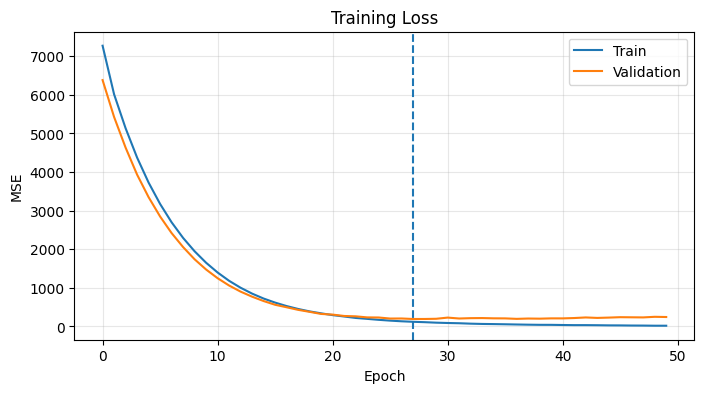

Validation RMSE: 13.89
Validation MAE: 10.70


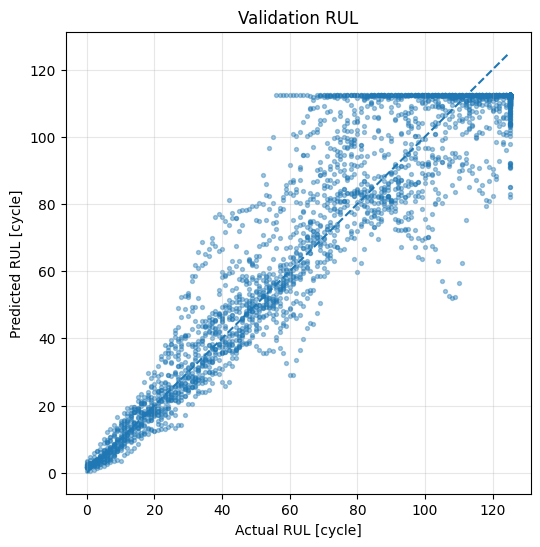

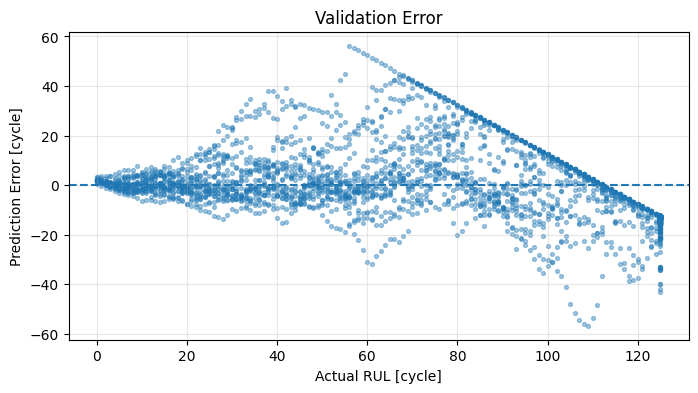

Final Training 01/28 | Loss: 7126.148
Final Training 02/28 | Loss: 5718.864
Final Training 03/28 | Loss: 4717.159
Final Training 04/28 | Loss: 3863.816
Final Training 05/28 | Loss: 3164.976
Final Training 06/28 | Loss: 2590.889
Final Training 07/28 | Loss: 2116.346
Final Training 08/28 | Loss: 1727.170
Final Training 09/28 | Loss: 1406.423
Final Training 10/28 | Loss: 1144.933
Final Training 11/28 | Loss: 932.003
Final Training 12/28 | Loss: 760.446
Final Training 13/28 | Loss: 622.212
Final Training 14/28 | Loss: 514.349
Final Training 15/28 | Loss: 428.146
Final Training 16/28 | Loss: 357.918
Final Training 17/28 | Loss: 305.473
Final Training 18/28 | Loss: 262.928
Final Training 19/28 | Loss: 223.654
Final Training 20/28 | Loss: 194.668
Final Training 21/28 | Loss: 174.881
Final Training 22/28 | Loss: 155.579
Final Training 23/28 | Loss: 139.912
Final Training 24/28 | Loss: 124.679
Final Training 25/28 | Loss: 117.411
Final Training 26/28 | Loss: 105.164
Final Training 27/28 | Loss:

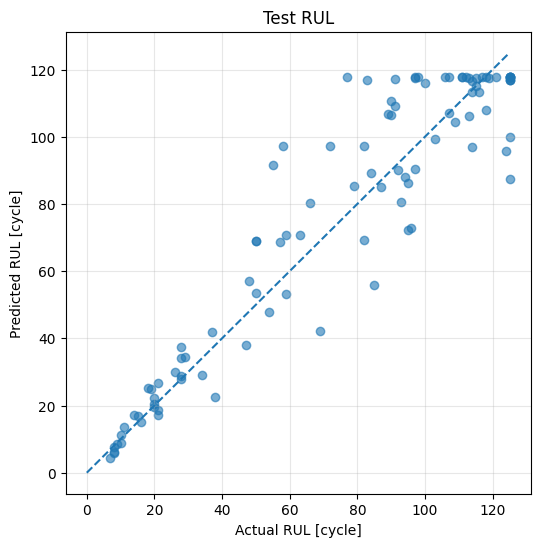

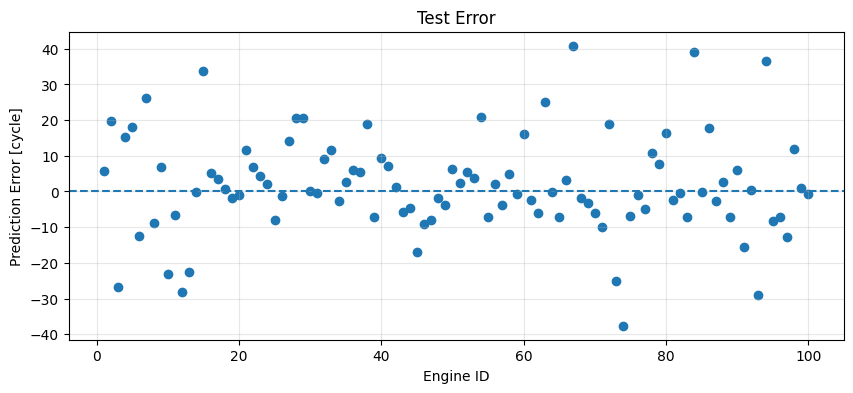

In [9]:
import copy

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn

from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset


# ============================================================
# Setting
# ============================================================

rul_limit = 125
seq_len = 30
batch_size = 128
epochs = 50


# ============================================================
# RUL
# ============================================================

train_df["RUL_raw"] = (
    train_df.groupby("unit_id")["cycle"].transform("max")
    - train_df["cycle"]
)

train_df["RUL"] = train_df["RUL_raw"].clip(upper=rul_limit)


# ============================================================
# Train / Validation
# 엔진 단위로 분리
# ============================================================

unit_ids = train_df["unit_id"].unique()

train_units, val_units = train_test_split(
    unit_ids,
    test_size=0.2,
    random_state=42
)

train_data = train_df[
    train_df["unit_id"].isin(train_units)
].copy()

val_data = train_df[
    train_df["unit_id"].isin(val_units)
].copy()


# ============================================================
# Sensor
# ============================================================

sensor_cols = [
    f"sensor_{i}"
    for i in range(1, 22)
]


# ------------------------------------------------------------
# float으로 변환
# ------------------------------------------------------------

train_data[sensor_cols] = train_data[sensor_cols].astype(float)
val_data[sensor_cols] = val_data[sensor_cols].astype(float)


# ------------------------------------------------------------
# Train 데이터로만 mean / std 계산
# ------------------------------------------------------------

X_train_raw = train_data[sensor_cols].to_numpy(dtype=float)

mean = X_train_raw.mean(axis=0)
std = X_train_raw.std(axis=0)


# ------------------------------------------------------------
# 변화가 없는 sensor 제거
# ------------------------------------------------------------

valid = std > 1e-8

sensor_cols = np.array(sensor_cols)[valid].tolist()

mean = mean[valid]
std = std[valid]


print("Selected sensors:", sensor_cols)
print("Input dimension:", len(sensor_cols))


# ============================================================
# Standardization
# ============================================================

train_data[sensor_cols] = (
    train_data[sensor_cols].astype(float) - mean
) / std

val_data[sensor_cols] = (
    val_data[sensor_cols].astype(float) - mean
) / std


# ============================================================
# Sequence 생성
#
# cycle 1 ~ 30
# -> cycle 30의 RUL
#
# cycle 2 ~ 31
# -> cycle 31의 RUL
#
# ...
# ============================================================

def make_sequences(df, sensors, seq_len):

    X = []
    y = []

    for unit_id in df["unit_id"].unique():

        engine = (
            df[df["unit_id"] == unit_id]
            .sort_values("cycle")
        )

        sensor_data = engine[sensors].to_numpy(dtype=float)
        rul = engine["RUL"].to_numpy(dtype=float)

        for i in range(len(engine) - seq_len + 1):

            X.append(
                sensor_data[i:i + seq_len]
            )

            y.append(
                rul[i + seq_len - 1]
            )

    return np.array(X), np.array(y)


X_train, y_train = make_sequences(
    train_data,
    sensor_cols,
    seq_len
)

X_val, y_val = make_sequences(
    val_data,
    sensor_cols,
    seq_len
)


print(
    "Train:",
    X_train.shape,
    y_train.shape
)

print(
    "Validation:",
    X_val.shape,
    y_val.shape
)


# ============================================================
# Tensor
# ============================================================

X_train = torch.tensor(
    X_train,
    dtype=torch.float32
)

y_train = torch.tensor(
    y_train,
    dtype=torch.float32
)

X_val = torch.tensor(
    X_val,
    dtype=torch.float32
)

y_val = torch.tensor(
    y_val,
    dtype=torch.float32
)


train_dataset = TensorDataset(
    X_train,
    y_train
)

val_dataset = TensorDataset(
    X_val,
    y_val
)


train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False
)


# ============================================================
# LSTM
# ============================================================

class RULModel(nn.Module):

    def __init__(self, input_size):

        super().__init__()

        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=64,
            num_layers=2,
            batch_first=True,
            dropout=0.2
        )

        self.fc = nn.Linear(
            64,
            1
        )

    def forward(self, x):

        x, _ = self.lstm(x)

        # 마지막 timestep 사용
        x = x[:, -1, :]

        x = self.fc(x)

        return x.squeeze(1)


# ============================================================
# Training Setup
# ============================================================

device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


model = RULModel(
    len(sensor_cols)
).to(device)


criterion = nn.MSELoss()

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-3
)


print("Device:", device)
print(model)


# ============================================================
# Training
# ============================================================

train_losses = []
val_losses = []

best_loss = np.inf
best_epoch = 0
best_state = None


for epoch in range(epochs):

    # --------------------------------------------------------
    # Train
    # --------------------------------------------------------

    model.train()

    train_loss = 0.0

    for X, y in train_loader:

        X = X.to(device)
        y = y.to(device)

        optimizer.zero_grad()

        y_pred = model(X)

        loss = criterion(
            y_pred,
            y
        )

        loss.backward()

        optimizer.step()

        train_loss += (
            loss.item()
            * len(X)
        )

    train_loss /= len(train_dataset)


    # --------------------------------------------------------
    # Validation
    # --------------------------------------------------------

    model.eval()

    val_loss = 0.0

    with torch.no_grad():

        for X, y in val_loader:

            X = X.to(device)
            y = y.to(device)

            y_pred = model(X)

            loss = criterion(
                y_pred,
                y
            )

            val_loss += (
                loss.item()
                * len(X)
            )

    val_loss /= len(val_dataset)


    train_losses.append(train_loss)
    val_losses.append(val_loss)


    # --------------------------------------------------------
    # Best Model
    # --------------------------------------------------------

    if val_loss < best_loss:

        best_loss = val_loss
        best_epoch = epoch + 1

        best_state = copy.deepcopy(
            model.state_dict()
        )


    print(
        f"{epoch + 1:02d} | "
        f"Train: {train_loss:.3f} | "
        f"Validation: {val_loss:.3f}"
    )


# ============================================================
# Best Model
# ============================================================

model.load_state_dict(
    best_state
)


print(
    "Best epoch:",
    best_epoch
)

print(
    f"Best validation MSE: "
    f"{best_loss:.2f}"
)


# ============================================================
# Loss
# ============================================================

plt.figure(
    figsize=(8, 4)
)

plt.plot(
    train_losses,
    label="Train"
)

plt.plot(
    val_losses,
    label="Validation"
)

plt.axvline(
    best_epoch - 1,
    linestyle="--"
)

plt.xlabel("Epoch")
plt.ylabel("MSE")

plt.title(
    "Training Loss"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Evaluation Function
# ============================================================

def rmse(y, y_pred):

    return np.sqrt(
        np.mean(
            (y - y_pred) ** 2
        )
    )


def mae(y, y_pred):

    return np.mean(
        np.abs(
            y - y_pred
        )
    )


# ============================================================
# Validation
# ============================================================

model.eval()

with torch.no_grad():

    y_val_pred = (
        model(
            X_val.to(device)
        )
        .cpu()
        .numpy()
    )


y_val_np = y_val.numpy()


print(
    f"Validation RMSE: "
    f"{rmse(y_val_np, y_val_pred):.2f}"
)

print(
    f"Validation MAE: "
    f"{mae(y_val_np, y_val_pred):.2f}"
)


# ============================================================
# Validation RUL
# ============================================================

plt.figure(
    figsize=(6, 6)
)

plt.scatter(
    y_val_np,
    y_val_pred,
    s=8,
    alpha=0.4
)


limit = max(
    y_val_np.max(),
    y_val_pred.max()
)


plt.plot(
    [0, limit],
    [0, limit],
    "--"
)

plt.xlabel(
    "Actual RUL [cycle]"
)

plt.ylabel(
    "Predicted RUL [cycle]"
)

plt.title(
    "Validation RUL"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Validation Error
# ============================================================

val_error = (
    y_val_pred
    - y_val_np
)


plt.figure(
    figsize=(8, 4)
)

plt.scatter(
    y_val_np,
    val_error,
    s=8,
    alpha=0.4
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Actual RUL [cycle]"
)

plt.ylabel(
    "Prediction Error [cycle]"
)

plt.title(
    "Validation Error"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 전체 Train 데이터 기준 정규화
# ============================================================

full_data = train_df.copy()


# 중요:
# int 센서가 있을 수 있으므로 float으로 변환
full_data[sensor_cols] = (
    full_data[sensor_cols]
    .astype(float)
)


X_full_raw = (
    full_data[sensor_cols]
    .to_numpy(dtype=float)
)


full_mean = X_full_raw.mean(
    axis=0
)

full_std = X_full_raw.std(
    axis=0
)


# ------------------------------------------------------------
# 전체 train 기준 표준화
# ------------------------------------------------------------

full_data[sensor_cols] = (
    full_data[sensor_cols] - full_mean
) / full_std


# ============================================================
# 전체 Train Sequence
# ============================================================

X_full, y_full = make_sequences(
    full_data,
    sensor_cols,
    seq_len
)


X_full = torch.tensor(
    X_full,
    dtype=torch.float32
)

y_full = torch.tensor(
    y_full,
    dtype=torch.float32
)


full_dataset = TensorDataset(
    X_full,
    y_full
)

full_loader = DataLoader(
    full_dataset,
    batch_size=batch_size,
    shuffle=True
)


# ============================================================
# Final Model
#
# Validation에서 찾은 best epoch 만큼
# 전체 데이터 재학습
# ============================================================

final_model = RULModel(
    len(sensor_cols)
).to(device)


criterion = nn.MSELoss()

optimizer = torch.optim.Adam(
    final_model.parameters(),
    lr=1e-3
)


for epoch in range(best_epoch):

    final_model.train()

    train_loss = 0.0

    for X, y in full_loader:

        X = X.to(device)
        y = y.to(device)

        optimizer.zero_grad()

        y_pred = final_model(X)

        loss = criterion(
            y_pred,
            y
        )

        loss.backward()

        optimizer.step()

        train_loss += (
            loss.item()
            * len(X)
        )

    train_loss /= len(full_dataset)

    print(
        f"Final Training "
        f"{epoch + 1:02d}/{best_epoch:02d} | "
        f"Loss: {train_loss:.3f}"
    )


# ============================================================
# Test Sequence
#
# Test에서는 각 엔진의 마지막 seq_len cycle만 사용
# 엔진당 RUL 하나를 예측
# ============================================================

def make_test_sequences(
    df,
    sensors,
    mean,
    std,
    seq_len
):

    X = []
    engine_ids = []


    for unit_id in df["unit_id"].unique():

        engine = (
            df[df["unit_id"] == unit_id]
            .sort_values("cycle")
        )


        # numpy float으로 바로 변환
        values = (
            engine[sensors]
            .to_numpy(dtype=float)
        )


        # 표준화
        values = (
            values - mean
        ) / std


        # seq_len보다 짧으면
        # 첫 값을 앞에 padding
        if len(values) < seq_len:

            padding = np.repeat(
                values[:1],
                seq_len - len(values),
                axis=0
            )

            values = np.vstack([
                padding,
                values
            ])

        else:

            # 마지막 seq_len만 사용
            values = values[-seq_len:]


        X.append(values)

        engine_ids.append(
            unit_id
        )


    return (
        np.array(X),
        np.array(engine_ids)
    )


X_test, engine_ids = make_test_sequences(
    test_df,
    sensor_cols,
    full_mean,
    full_std,
    seq_len
)


X_test = torch.tensor(
    X_test,
    dtype=torch.float32
)


print(
    "Test:",
    X_test.shape
)


# ============================================================
# Test Prediction
# ============================================================

final_model.eval()


with torch.no_grad():

    y_test_pred = (
        final_model(
            X_test.to(device)
        )
        .cpu()
        .numpy()
    )


# 실제 Test RUL
y_test_raw = (
    rul_df["RUL"]
    .to_numpy(dtype=float)
)


# train과 동일하게
# RUL 최대 125로 clipping
y_test = np.minimum(
    y_test_raw,
    rul_limit
)


print(
    f"Test RMSE: "
    f"{rmse(y_test, y_test_pred):.2f}"
)

print(
    f"Test MAE: "
    f"{mae(y_test, y_test_pred):.2f}"
)


# ============================================================
# Test RUL
# ============================================================

plt.figure(
    figsize=(6, 6)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.6
)


limit = max(
    y_test.max(),
    y_test_pred.max()
)


plt.plot(
    [0, limit],
    [0, limit],
    "--"
)

plt.xlabel(
    "Actual RUL [cycle]"
)

plt.ylabel(
    "Predicted RUL [cycle]"
)

plt.title(
    "Test RUL"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# Test Error
# ============================================================

test_error = (
    y_test_pred
    - y_test
)


plt.figure(
    figsize=(10, 4)
)

plt.scatter(
    engine_ids,
    test_error
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Engine ID"
)

plt.ylabel(
    "Prediction Error [cycle]"
)

plt.title(
    "Test Error"
)

plt.grid(
    alpha=0.3
)

plt.show()